# Generative Adversarial Networks

<img src="https://i.imgur.com/x8k3nJq.png"/>



<center>“What I cannot create, I do not understand.” — Richard P. Feynman</center>

# Taxonomy of ML
* Supervised Learning
* Unsupervised Learning   <--- You are here
* Reinforcement Learning

# Supervised Learning

Learning from Labeled Datasets

Example: Classifying Cats vs Dogs
<img src="http://adilmoujahid.com/images/cats-dogs.jpg"/>

# Unsupervised Learning

Self Learning, Unlabeled Data
Examples:
* Boltzmann Machines
* Auto-encoder
* Generative Adversarial Network


# Reinforcement Learning

Learning through a reward function
* When the algorithm is right, pat it on the head and give it a treat
* When the algorithm is wrong, do not give it a treat, or scold it.

## What is a Generative Adversarial Network (GAN)

Ian Goodfellow et al, "Generative Adversarial Networks", 2014

* Puts two neural networks against each other in a zero sum game
* The GAN is searching for a nash equilibrium
* The problem is there is no guarantee one exists

## What is a Generative Adversarial Network (GAN)
<img src="https://cdn-images-1.medium.com/max/1400/1*L_pqMKMNJ8J-sa0Fx0qKpw.jpeg" style="width: 700px;"/>

## What is a Generative Adversarial Network (GAN)

<img src="https://i.imgur.com/rO0AvNa.jpg"/>


* The generator is like a counterfeiter
* The generator is forced by the discriminator to generate fakes of increasingly high quality
* The discriminator is forced by the generator to get better at detecting fakes.


# Use Cases
* Text, Image, or Whatever else synthesis (suffice it to say you can teach them to generate things)
* Anomaly Detection
* Denoising

<img src="https://i.imgur.com/IUu20uk.jpg"/>

## Example: MNIST Generation


In [1]:
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os

%matplotlib inline

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
mb_size = 32
X_dim = 784
z_dim = 64
h_dim = 128
lr = 1e-3
d_steps = 3

In [3]:
mnist = input_data.read_data_sets('../../MNIST_data', one_hot=True)

Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting ../../MNIST_data/train-images-idx3-ubyte.gz
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting ../../MNIST_data/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Extracting ../../MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../../MNIST_data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.


In [4]:
def plot(samples):
    fig = plt.figure(figsize=(4, 4))
    gs = gridspec.GridSpec(4, 4)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig


In [5]:
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)


def log(x):
    return tf.log(x + 1e-8)

### Generator and Discriminator
* Generator takes a prior and outputs an image
* Discriminator takes images and outputs the probability it not faked by the generator.

The below is borrowed from https://wiseodd.github.io/techblog/2016/09/17/gan-tensorflow/

In [6]:
X = tf.placeholder(tf.float32, shape=[None, X_dim])
z = tf.placeholder(tf.float32, shape=[None, z_dim])

def generator(z):
    G_h1 = tf.nn.relu(tf.matmul(z, G_W1) + G_b1)
    G_log_prob = tf.matmul(G_h1, G_W2) + G_b2
    G_prob = tf.nn.sigmoid(G_log_prob)
    return G_prob

G_W1 = tf.Variable(xavier_init([z_dim, h_dim]))
G_b1 = tf.Variable(tf.zeros(shape=[h_dim]))
G_W2 = tf.Variable(xavier_init([h_dim, X_dim]))
G_b2 = tf.Variable(tf.zeros(shape=[X_dim]))

theta_G = [G_W1, G_W2, G_b1, G_b2]


In [7]:
D_W1 = tf.Variable(xavier_init([784, 128]))
D_b1 = tf.Variable(tf.zeros(shape=[128]))
D_W2 = tf.Variable(xavier_init([128, 1]))
D_b2 = tf.Variable(tf.zeros(shape=[1]))

def discriminator(x):
    D_h1 = tf.nn.relu(tf.matmul(x, D_W1) + D_b1)
    out = tf.nn.sigmoid(tf.matmul(D_h1, D_W2) + D_b2)
    return out

theta_D = [D_W1, D_W2, D_b1, D_b2]

### Noise Prior
* This code is using uniform noise for the prior distribution.

In [8]:
def sample_z(m, n):
    return np.random.uniform(-1., 1., size=[m, n])


### Loss Functions

In [9]:
G_sample = generator(z)

D_real = discriminator(X)
D_fake = discriminator(G_sample)

D_loss = -tf.reduce_mean(log(D_real) + log(1 - D_fake))
G_loss = 0.5 * tf.reduce_mean((log(D_fake) - log(1 - D_fake))**2)

D_solver = (tf.train.AdamOptimizer(learning_rate=lr)
            .minimize(D_loss, var_list=theta_D))
G_solver = (tf.train.AdamOptimizer(learning_rate=lr)
            .minimize(G_loss, var_list=theta_G))

sess = tf.Session()
sess.run(tf.global_variables_initializer())

if not os.path.exists('out/'):
    os.makedirs('out/')

Iter: 0; D_loss: 1.356; G_loss: 1.768


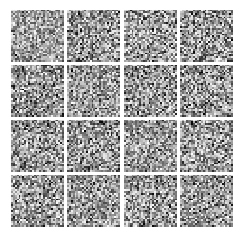

Iter: 100; D_loss: 0.2863; G_loss: 8.948


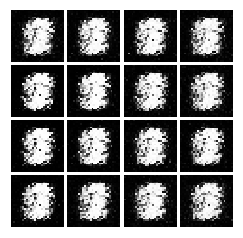

Iter: 200; D_loss: 0.1298; G_loss: 8.562


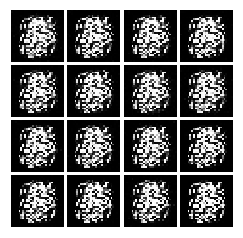

Iter: 300; D_loss: 0.08728; G_loss: 11.96


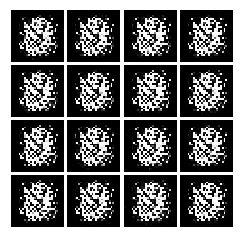

Iter: 400; D_loss: 0.04483; G_loss: 11.26


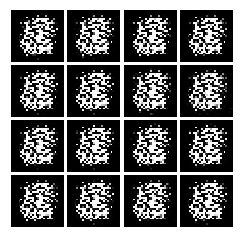

Iter: 500; D_loss: 0.02288; G_loss: 11.35


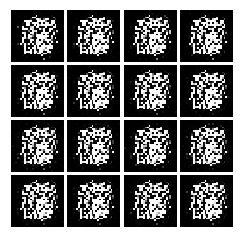

Iter: 600; D_loss: 0.008596; G_loss: 20.0


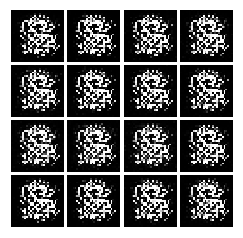

Iter: 700; D_loss: 0.00871; G_loss: 17.51


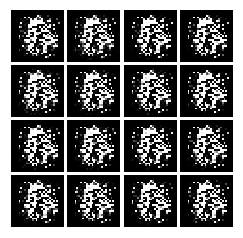

Iter: 800; D_loss: 0.007597; G_loss: 16.16


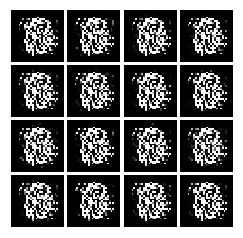

Iter: 900; D_loss: 0.009199; G_loss: 19.82


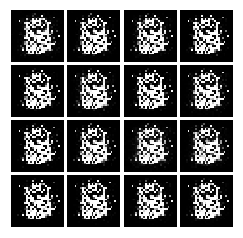

Iter: 1000; D_loss: 0.02073; G_loss: 13.54


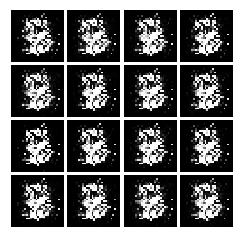

Iter: 1100; D_loss: 0.01908; G_loss: 16.63


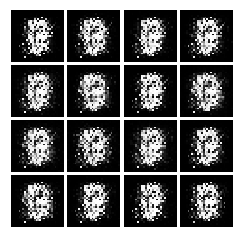

Iter: 1200; D_loss: 0.03614; G_loss: 12.62


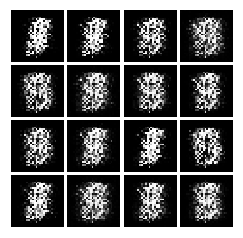

Iter: 1300; D_loss: 0.0479; G_loss: 16.62


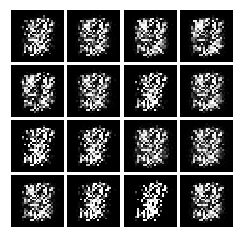

Iter: 1400; D_loss: 0.03214; G_loss: 10.93


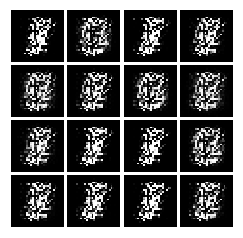

Iter: 1500; D_loss: 0.0252; G_loss: 15.3


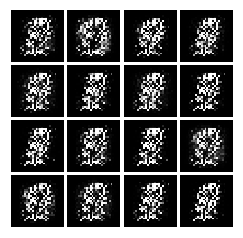

Iter: 1600; D_loss: 0.01084; G_loss: 20.47


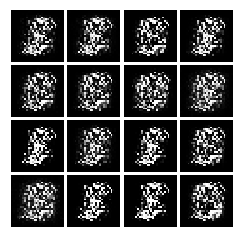

Iter: 1700; D_loss: 0.01535; G_loss: 18.75


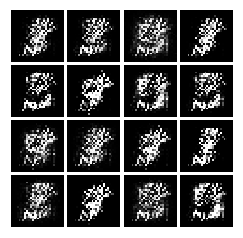

Iter: 1800; D_loss: 0.01457; G_loss: 15.72


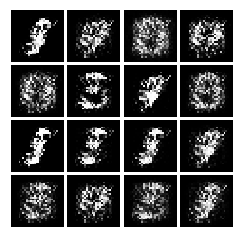

Iter: 1900; D_loss: 0.0579; G_loss: 12.05


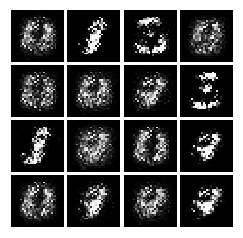

Iter: 2000; D_loss: 0.1263; G_loss: 6.19


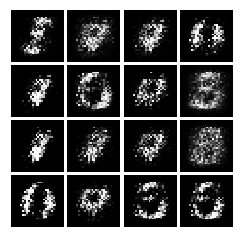

Iter: 2100; D_loss: 0.1281; G_loss: 7.526


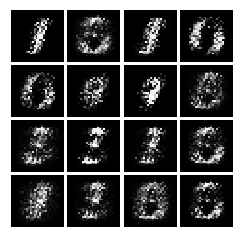

Iter: 2200; D_loss: 0.07859; G_loss: 11.43


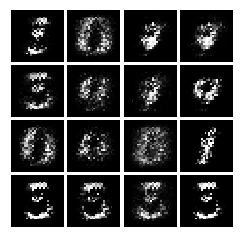

Iter: 2300; D_loss: 0.1051; G_loss: 8.822


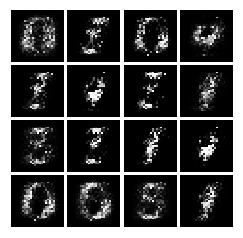

Iter: 2400; D_loss: 0.07326; G_loss: 8.048


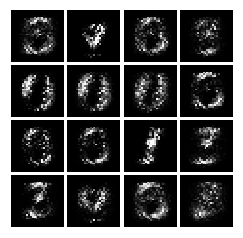

Iter: 2500; D_loss: 0.05215; G_loss: 9.582


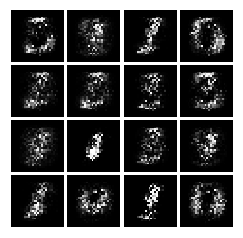

Iter: 2600; D_loss: 0.1272; G_loss: 13.44


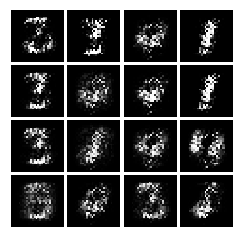

Iter: 2700; D_loss: 0.03759; G_loss: 10.73


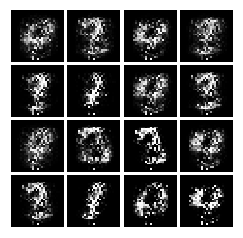

Iter: 2800; D_loss: 0.06277; G_loss: 9.105


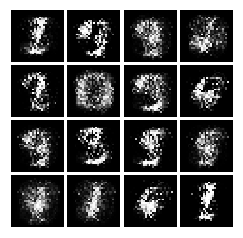

Iter: 2900; D_loss: 0.05215; G_loss: 15.81


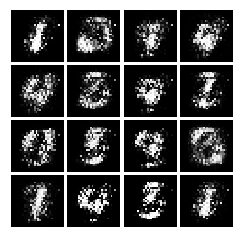

Iter: 3000; D_loss: 0.1688; G_loss: 10.12


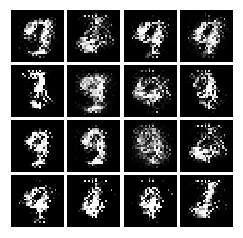

Iter: 3100; D_loss: 0.0712; G_loss: 14.79


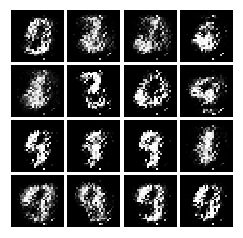

Iter: 3200; D_loss: 0.1615; G_loss: 7.507


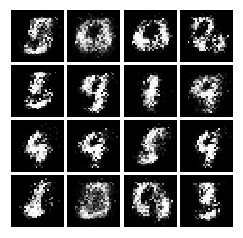

Iter: 3300; D_loss: 0.2261; G_loss: 11.11


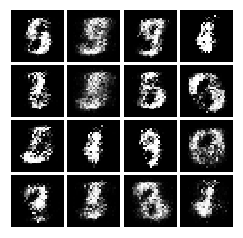

Iter: 3400; D_loss: 0.0972; G_loss: 9.022


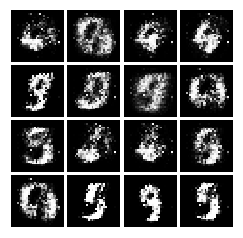

Iter: 3500; D_loss: 0.2337; G_loss: 7.969


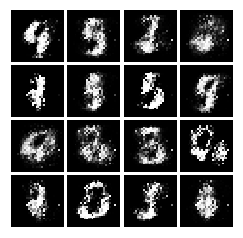

Iter: 3600; D_loss: 0.2036; G_loss: 9.662


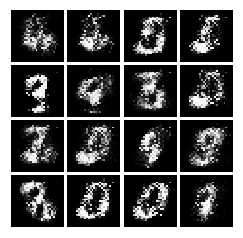

Iter: 3700; D_loss: 0.1453; G_loss: 12.75


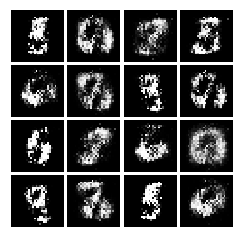

Iter: 3800; D_loss: 0.07421; G_loss: 15.48


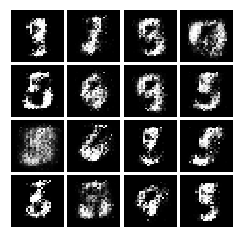

Iter: 3900; D_loss: 0.1982; G_loss: 9.636


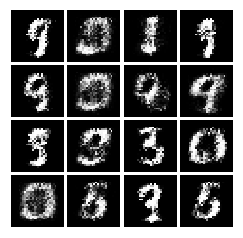

Iter: 4000; D_loss: 0.1336; G_loss: 11.04


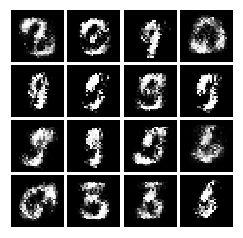

Iter: 4100; D_loss: 0.2185; G_loss: 10.46


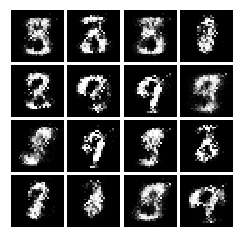

Iter: 4200; D_loss: 0.3333; G_loss: 7.12


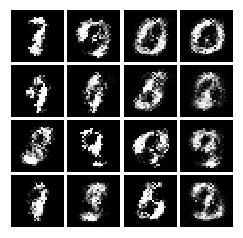

Iter: 4300; D_loss: 0.1294; G_loss: 19.2


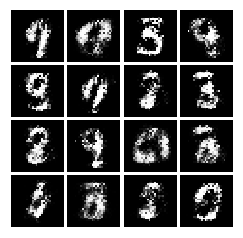

Iter: 4400; D_loss: 0.2371; G_loss: 11.92


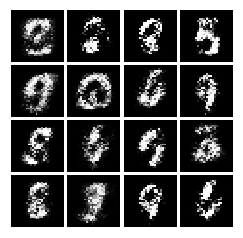

Iter: 4500; D_loss: 0.2066; G_loss: 8.49


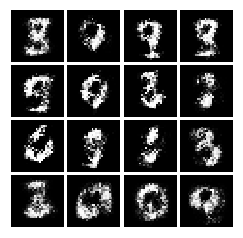

Iter: 4600; D_loss: 0.3474; G_loss: 11.34


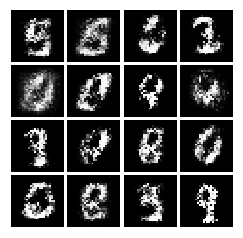

Iter: 4700; D_loss: 0.273; G_loss: 7.209


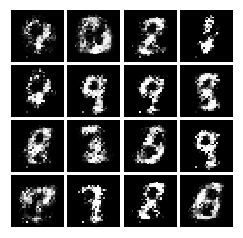

Iter: 4800; D_loss: 0.3544; G_loss: 7.629


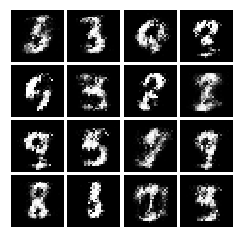

Iter: 4900; D_loss: 0.4732; G_loss: 5.624


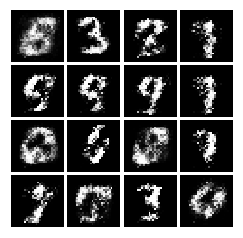

Iter: 5000; D_loss: 0.5415; G_loss: 12.11


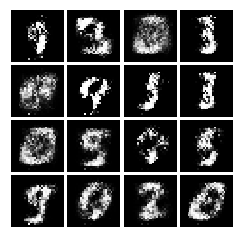

Iter: 5100; D_loss: 0.282; G_loss: 4.359


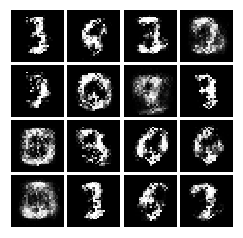

Iter: 5200; D_loss: 0.07076; G_loss: 7.815


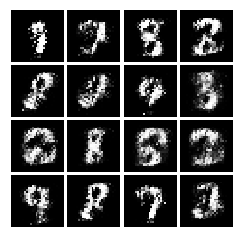

Iter: 5300; D_loss: 0.272; G_loss: 8.482


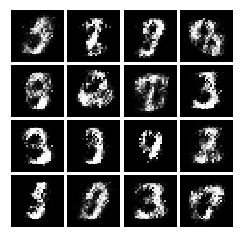

Iter: 5400; D_loss: 0.725; G_loss: 9.866


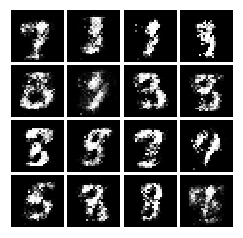

Iter: 5500; D_loss: 0.1919; G_loss: 11.15


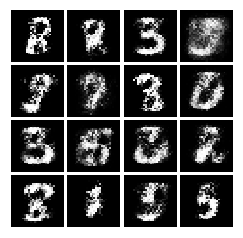

Iter: 5600; D_loss: 0.2745; G_loss: 11.25


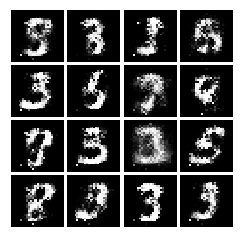

Iter: 5700; D_loss: 0.5165; G_loss: 9.104


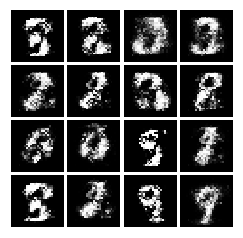

Iter: 5800; D_loss: 0.3868; G_loss: 6.48


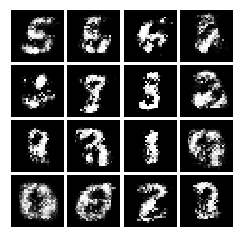

Iter: 5900; D_loss: 0.6905; G_loss: 8.857


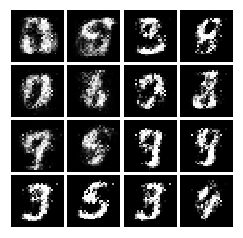

Iter: 6000; D_loss: 0.2571; G_loss: 18.62


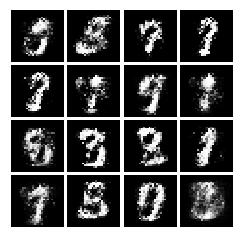

Iter: 6100; D_loss: 0.8678; G_loss: 3.443


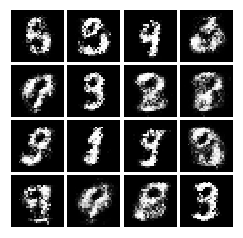

Iter: 6200; D_loss: 0.3622; G_loss: 7.291


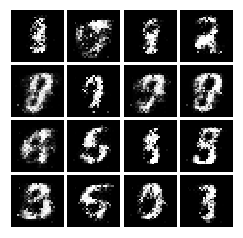

Iter: 6300; D_loss: 0.303; G_loss: 9.776


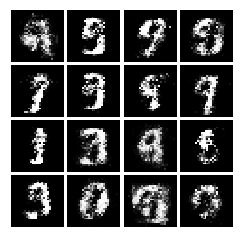

Iter: 6400; D_loss: 0.321; G_loss: 7.905


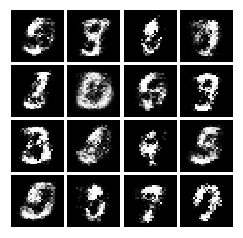

Iter: 6500; D_loss: 0.2387; G_loss: 6.365


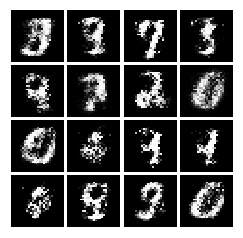

Iter: 6600; D_loss: 0.2847; G_loss: 14.79


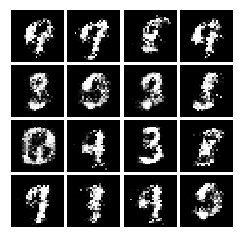

Iter: 6700; D_loss: 0.2626; G_loss: 11.23


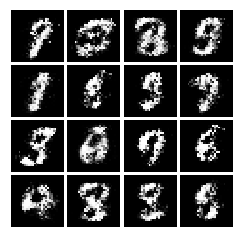

Iter: 6800; D_loss: 0.5596; G_loss: 4.679


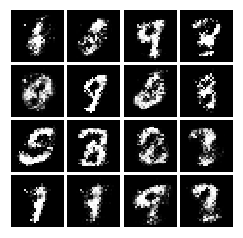

Iter: 6900; D_loss: 0.258; G_loss: 7.641


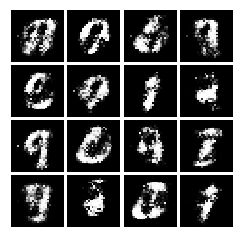

Iter: 7000; D_loss: 0.6414; G_loss: 5.552


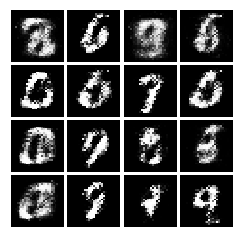

Iter: 7100; D_loss: 0.4559; G_loss: 8.644


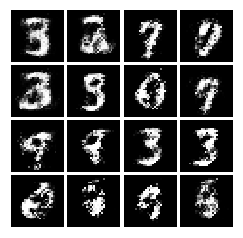

Iter: 7200; D_loss: 0.57; G_loss: 6.207


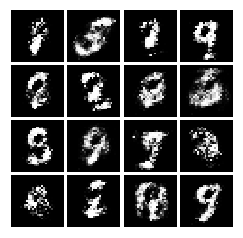

Iter: 7300; D_loss: 0.8343; G_loss: 6.997


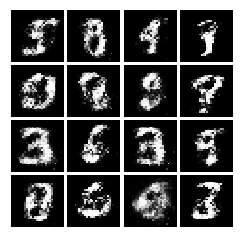

Iter: 7400; D_loss: 0.3217; G_loss: 11.54


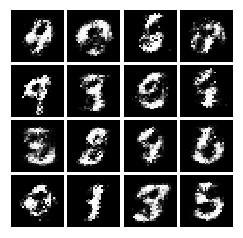

Iter: 7500; D_loss: 0.4829; G_loss: 9.713


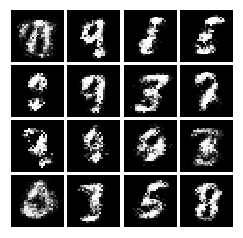

Iter: 7600; D_loss: 0.4544; G_loss: 8.696


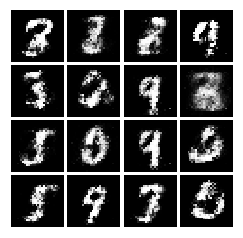

Iter: 7700; D_loss: 0.1242; G_loss: 11.38


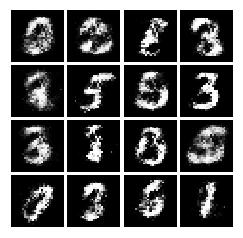

Iter: 7800; D_loss: 0.6239; G_loss: 4.673


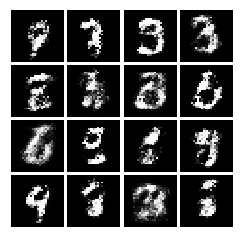

Iter: 7900; D_loss: 0.3846; G_loss: 3.45


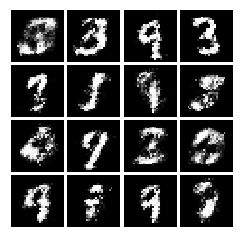

Iter: 8000; D_loss: 0.364; G_loss: 7.109


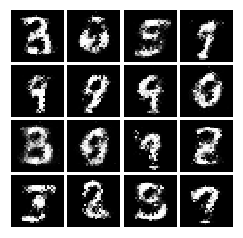

Iter: 8100; D_loss: 0.3317; G_loss: 10.03


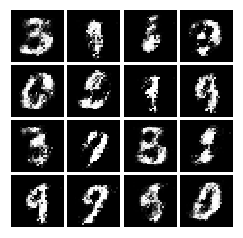

Iter: 8200; D_loss: 0.5347; G_loss: 8.046


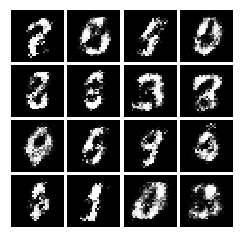

Iter: 8300; D_loss: 0.5265; G_loss: 8.08


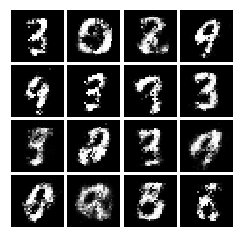

Iter: 8400; D_loss: 0.5716; G_loss: 5.211


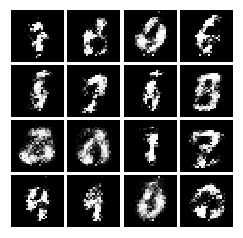

Iter: 8500; D_loss: 0.5865; G_loss: 6.275


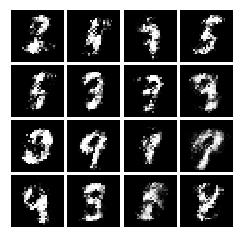

Iter: 8600; D_loss: 0.4706; G_loss: 5.176


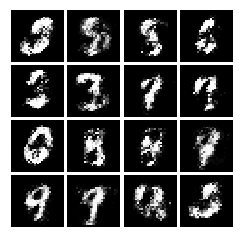

Iter: 8700; D_loss: 0.6357; G_loss: 10.06


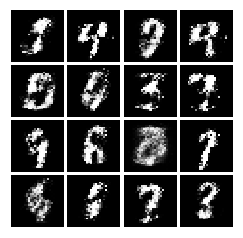

Iter: 8800; D_loss: 0.4758; G_loss: 6.815


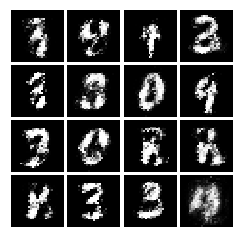

Iter: 8900; D_loss: 0.3142; G_loss: 9.973


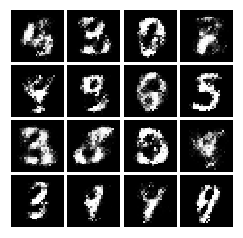

Iter: 9000; D_loss: 0.2974; G_loss: 5.529


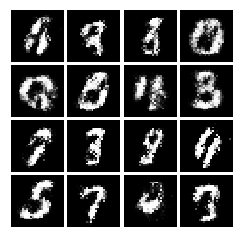

Iter: 9100; D_loss: 0.4826; G_loss: 5.412


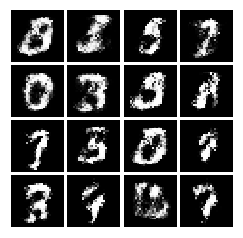

Iter: 9200; D_loss: 0.7177; G_loss: 6.955


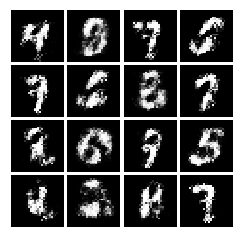

Iter: 9300; D_loss: 0.4938; G_loss: 6.528


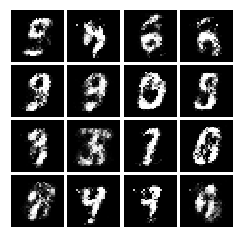

Iter: 9400; D_loss: 0.3739; G_loss: 6.987


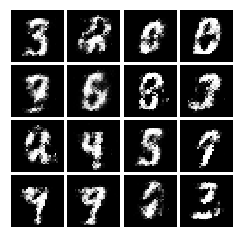

Iter: 9500; D_loss: 0.3477; G_loss: 10.28


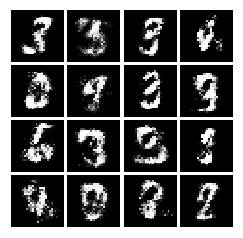

Iter: 9600; D_loss: 0.6152; G_loss: 4.957


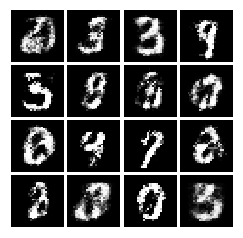

Iter: 9700; D_loss: 0.4447; G_loss: 5.47


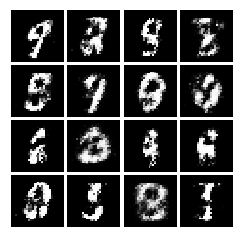

Iter: 9800; D_loss: 0.3881; G_loss: 5.067


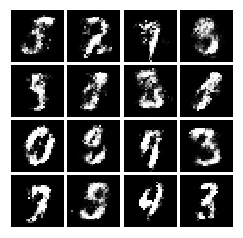

Iter: 9900; D_loss: 0.5528; G_loss: 5.236


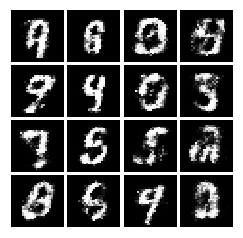

Iter: 10000; D_loss: 0.4297; G_loss: 4.651


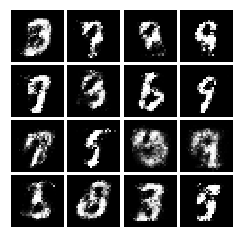

Iter: 10100; D_loss: 0.6796; G_loss: 3.07


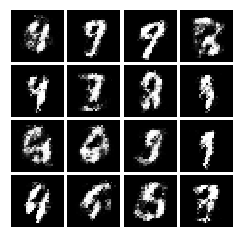

Iter: 10200; D_loss: 0.3499; G_loss: 5.722


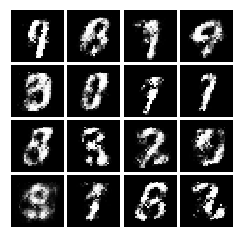

Iter: 10300; D_loss: 0.4671; G_loss: 4.641


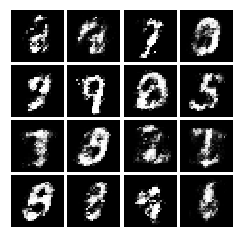

Iter: 10400; D_loss: 0.492; G_loss: 6.092


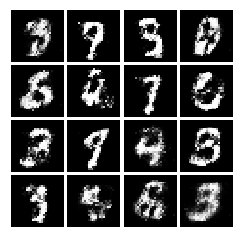

Iter: 10500; D_loss: 0.3629; G_loss: 6.938


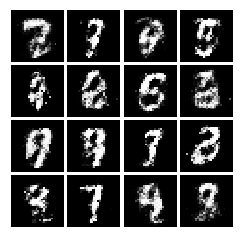

Iter: 10600; D_loss: 0.5661; G_loss: 2.371


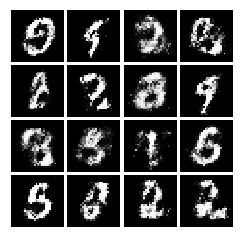

Iter: 10700; D_loss: 0.3363; G_loss: 5.667


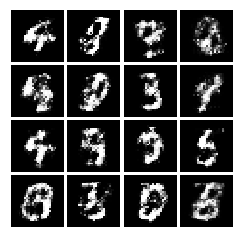

Iter: 10800; D_loss: 0.6192; G_loss: 6.811


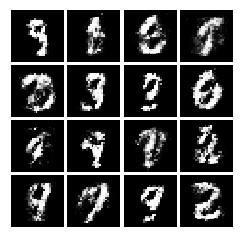

Iter: 10900; D_loss: 0.5704; G_loss: 5.0


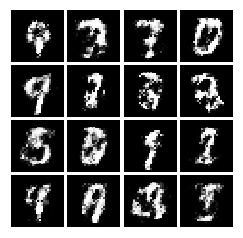

Iter: 11000; D_loss: 0.5593; G_loss: 5.905


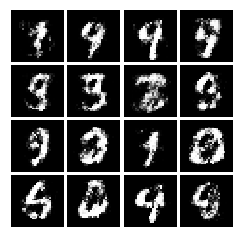

Iter: 11100; D_loss: 0.5625; G_loss: 5.92


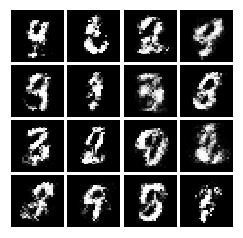

Iter: 11200; D_loss: 1.021; G_loss: 5.872


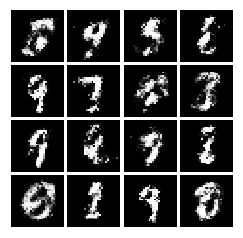

Iter: 11300; D_loss: 0.6647; G_loss: 5.102


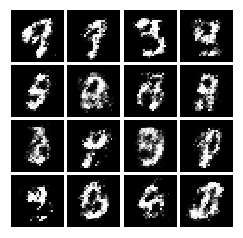

Iter: 11400; D_loss: 0.5198; G_loss: 6.499


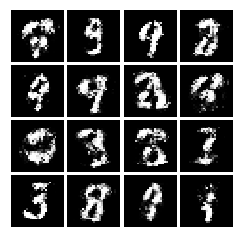

Iter: 11500; D_loss: 1.009; G_loss: 3.695


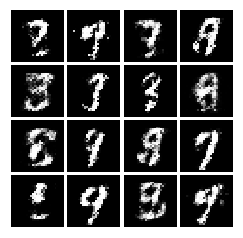

Iter: 11600; D_loss: 0.3881; G_loss: 4.342


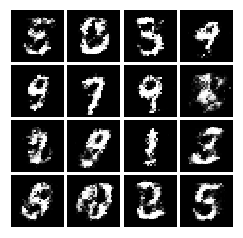

Iter: 11700; D_loss: 0.5615; G_loss: 5.792


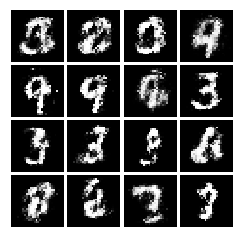

Iter: 11800; D_loss: 0.8403; G_loss: 5.271


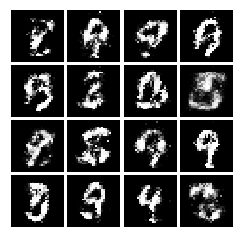

Iter: 11900; D_loss: 0.5069; G_loss: 4.847


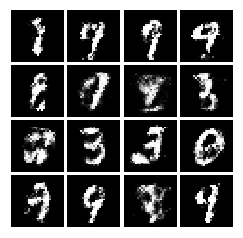

Iter: 12000; D_loss: 0.4185; G_loss: 5.057


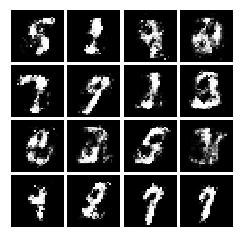

Iter: 12100; D_loss: 0.722; G_loss: 5.169


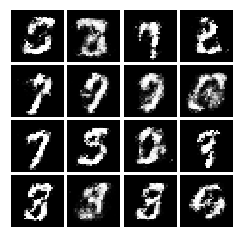

Iter: 12200; D_loss: 0.2467; G_loss: 5.213


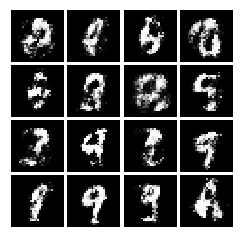

Iter: 12300; D_loss: 0.4249; G_loss: 3.26


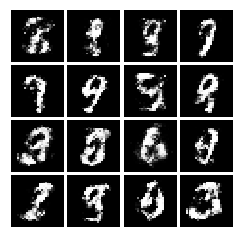

Iter: 12400; D_loss: 0.4606; G_loss: 5.615


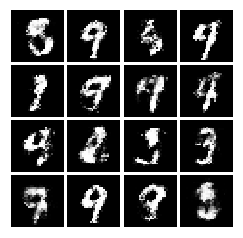

Iter: 12500; D_loss: 0.6644; G_loss: 5.466


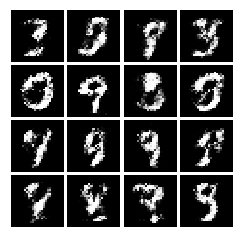

Iter: 12600; D_loss: 0.5936; G_loss: 4.267


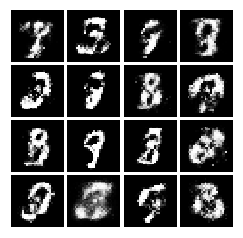

Iter: 12700; D_loss: 0.2642; G_loss: 3.576


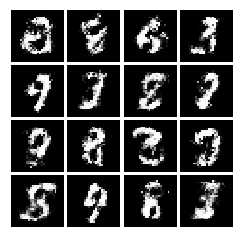

Iter: 12800; D_loss: 0.5037; G_loss: 5.391


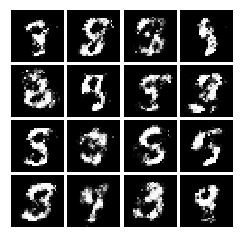

Iter: 12900; D_loss: 0.3522; G_loss: 5.82


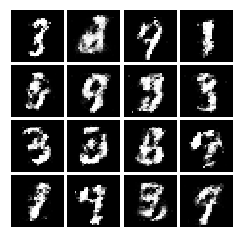

Iter: 13000; D_loss: 0.831; G_loss: 2.762


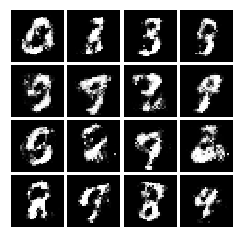

Iter: 13100; D_loss: 0.7938; G_loss: 3.894


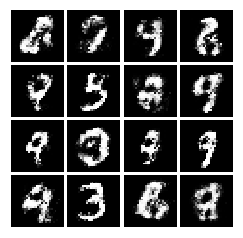

Iter: 13200; D_loss: 0.4451; G_loss: 4.577


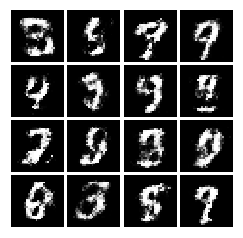

Iter: 13300; D_loss: 0.5569; G_loss: 3.893


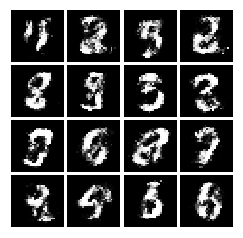

Iter: 13400; D_loss: 0.6578; G_loss: 6.182


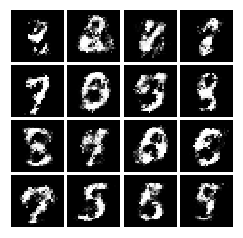

Iter: 13500; D_loss: 0.4512; G_loss: 3.706


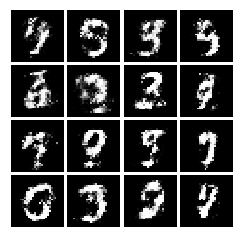

Iter: 13600; D_loss: 0.3425; G_loss: 7.222


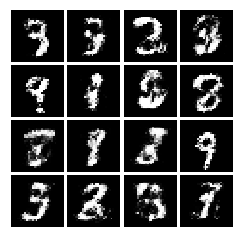

Iter: 13700; D_loss: 0.4991; G_loss: 4.485


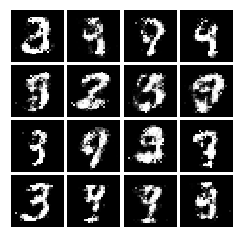

Iter: 13800; D_loss: 0.3857; G_loss: 6.179


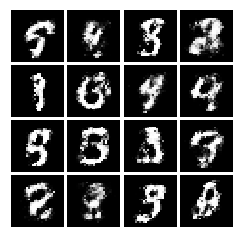

Iter: 13900; D_loss: 0.8141; G_loss: 3.48


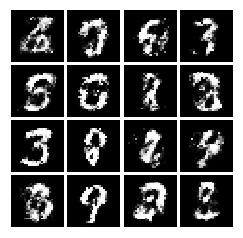

Iter: 14000; D_loss: 0.4712; G_loss: 3.535


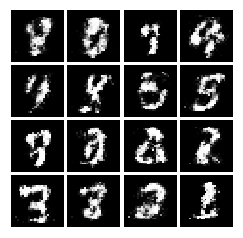

Iter: 14100; D_loss: 0.3468; G_loss: 3.958


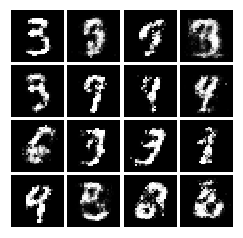

Iter: 14200; D_loss: 0.6366; G_loss: 4.679


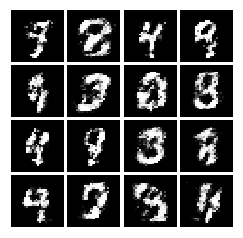

Iter: 14300; D_loss: 0.5309; G_loss: 7.09


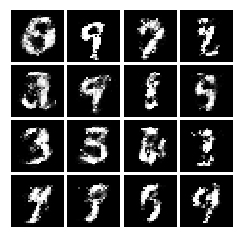

Iter: 14400; D_loss: 0.7898; G_loss: 6.003


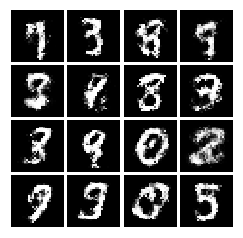

Iter: 14500; D_loss: 0.5147; G_loss: 4.866


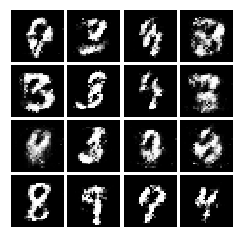

Iter: 14600; D_loss: 0.5387; G_loss: 3.623


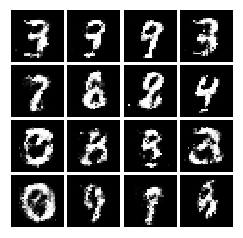

Iter: 14700; D_loss: 0.809; G_loss: 6.165


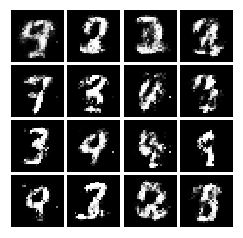

Iter: 14800; D_loss: 0.4557; G_loss: 6.186


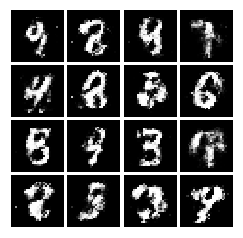

Iter: 14900; D_loss: 0.3754; G_loss: 3.695


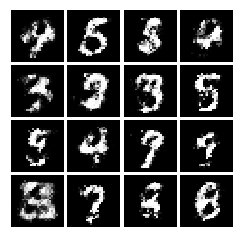

Iter: 15000; D_loss: 0.5305; G_loss: 4.7


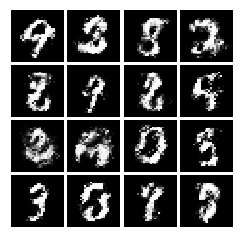

Iter: 15100; D_loss: 0.4209; G_loss: 5.631


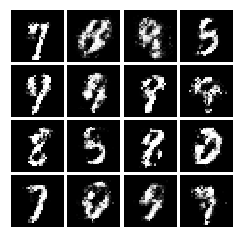

Iter: 15200; D_loss: 0.5082; G_loss: 4.444


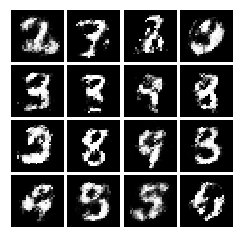

Iter: 15300; D_loss: 0.475; G_loss: 3.572


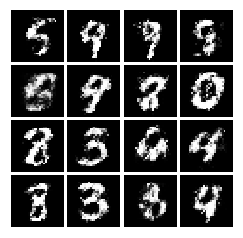

Iter: 15400; D_loss: 0.5227; G_loss: 4.981


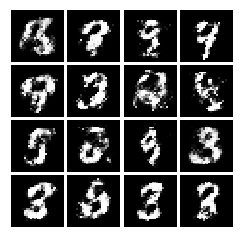

Iter: 15500; D_loss: 0.4422; G_loss: 3.851


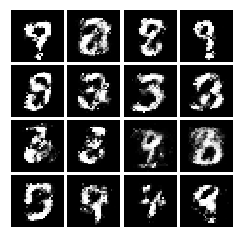

Iter: 15600; D_loss: 0.5955; G_loss: 3.32


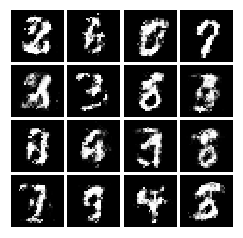

Iter: 15700; D_loss: 0.5741; G_loss: 5.189


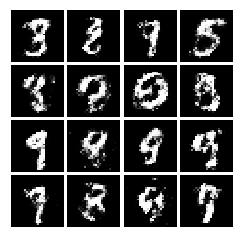

Iter: 15800; D_loss: 0.5103; G_loss: 2.386


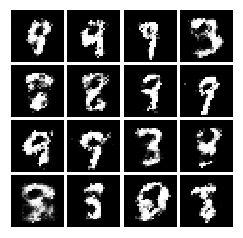

Iter: 15900; D_loss: 0.6428; G_loss: 3.081


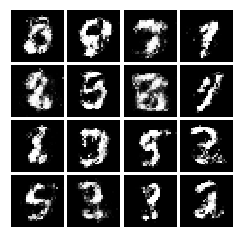

Iter: 16000; D_loss: 0.479; G_loss: 5.398


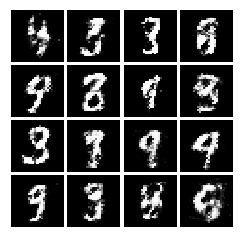

Iter: 16100; D_loss: 0.5291; G_loss: 3.721


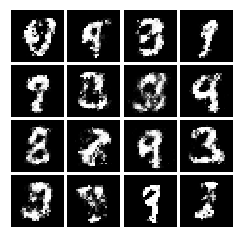

Iter: 16200; D_loss: 0.6276; G_loss: 6.309


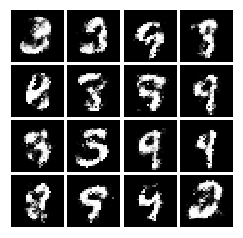

Iter: 16300; D_loss: 0.5172; G_loss: 3.242


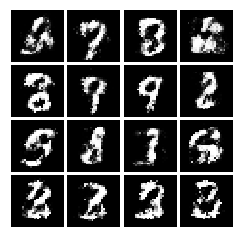

Iter: 16400; D_loss: 0.6241; G_loss: 3.826


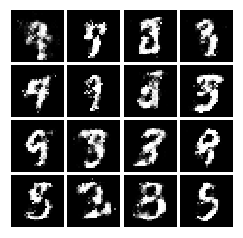

Iter: 16500; D_loss: 0.7153; G_loss: 3.633


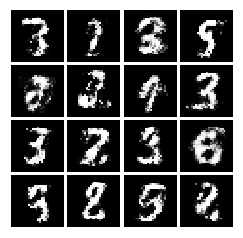

Iter: 16600; D_loss: 0.5514; G_loss: 4.048


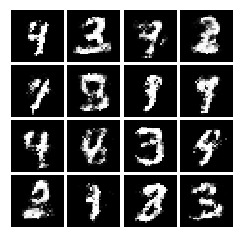

Iter: 16700; D_loss: 0.5542; G_loss: 5.45


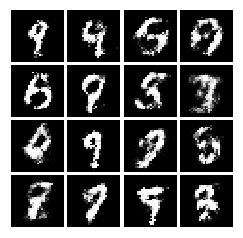

Iter: 16800; D_loss: 0.7731; G_loss: 5.541


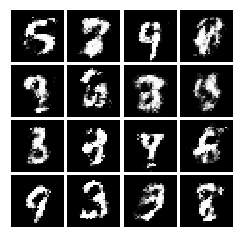

Iter: 16900; D_loss: 0.5664; G_loss: 2.223


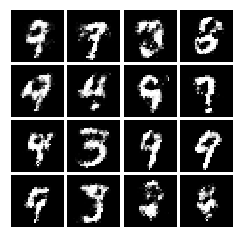

Iter: 17000; D_loss: 0.3231; G_loss: 4.237


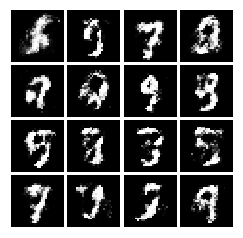

Iter: 17100; D_loss: 0.475; G_loss: 4.879


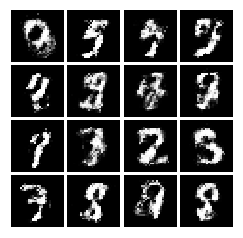

Iter: 17200; D_loss: 0.7248; G_loss: 4.112


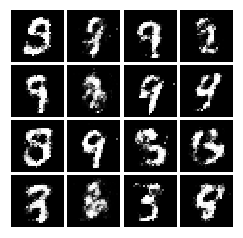

Iter: 17300; D_loss: 0.4289; G_loss: 3.039


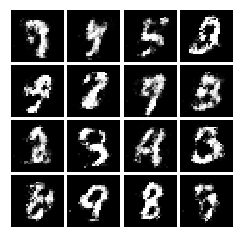

Iter: 17400; D_loss: 0.5521; G_loss: 2.355


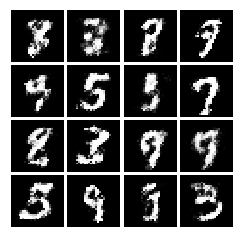

Iter: 17500; D_loss: 0.3327; G_loss: 3.796


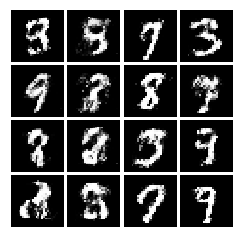

Iter: 17600; D_loss: 0.6251; G_loss: 4.914


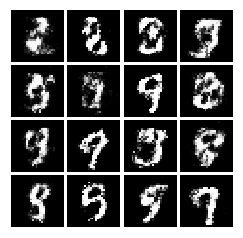

Iter: 17700; D_loss: 0.5874; G_loss: 4.062


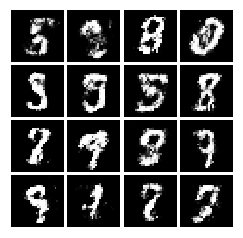

Iter: 17800; D_loss: 0.528; G_loss: 2.309


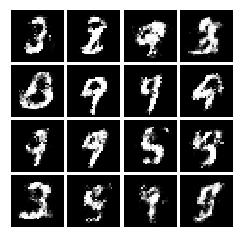

Iter: 17900; D_loss: 0.4617; G_loss: 4.013


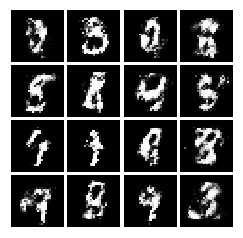

Iter: 18000; D_loss: 0.6884; G_loss: 3.685


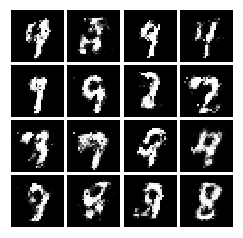

Iter: 18100; D_loss: 0.6017; G_loss: 2.84


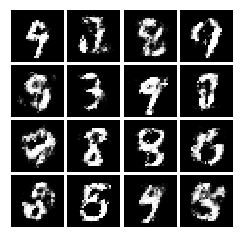

Iter: 18200; D_loss: 0.6415; G_loss: 3.914


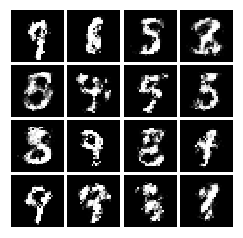

Iter: 18300; D_loss: 0.3657; G_loss: 3.487


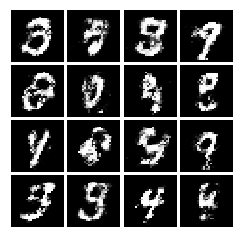

Iter: 18400; D_loss: 0.7166; G_loss: 3.831


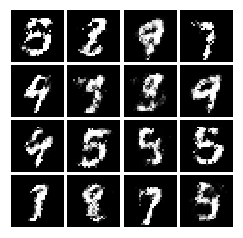

Iter: 18500; D_loss: 0.4745; G_loss: 4.792


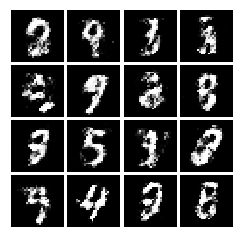

Iter: 18600; D_loss: 0.6014; G_loss: 4.031


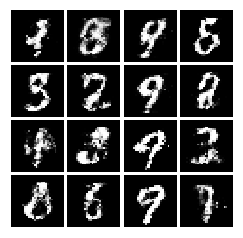

Iter: 18700; D_loss: 0.4786; G_loss: 5.279


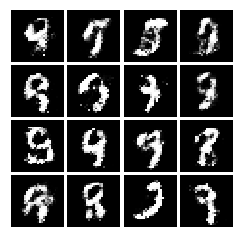

Iter: 18800; D_loss: 0.6562; G_loss: 3.408


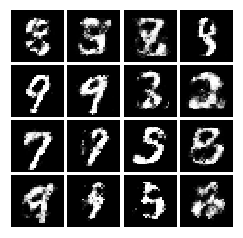

Iter: 18900; D_loss: 0.7646; G_loss: 4.905


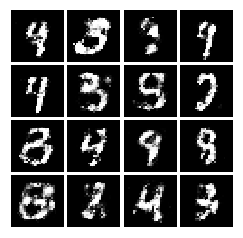

Iter: 19000; D_loss: 0.6189; G_loss: 3.583


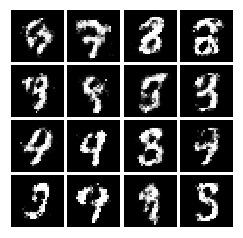

Iter: 19100; D_loss: 0.7058; G_loss: 3.481


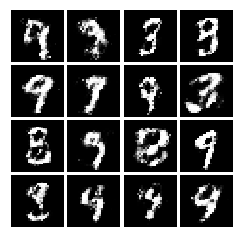

Iter: 19200; D_loss: 0.6478; G_loss: 4.029


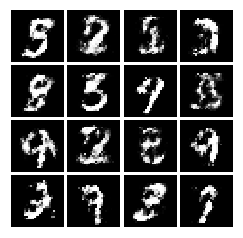

Iter: 19300; D_loss: 0.6122; G_loss: 4.834


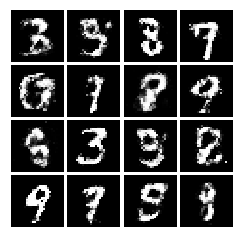

Iter: 19400; D_loss: 0.5401; G_loss: 4.112


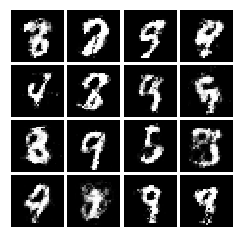

Iter: 19500; D_loss: 0.4459; G_loss: 4.415


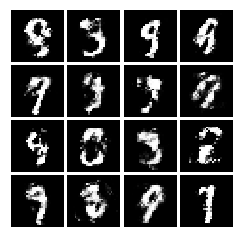

Iter: 19600; D_loss: 0.5052; G_loss: 2.902


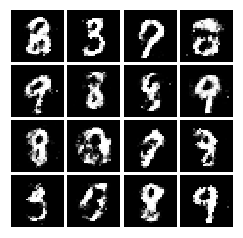

Iter: 19700; D_loss: 0.5905; G_loss: 3.213


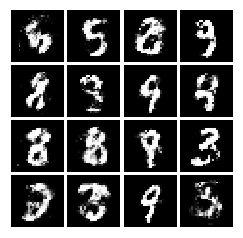

Iter: 19800; D_loss: 0.7359; G_loss: 2.035


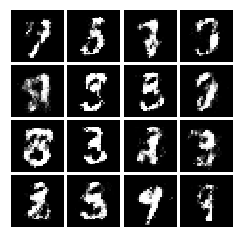

Iter: 19900; D_loss: 0.581; G_loss: 2.701


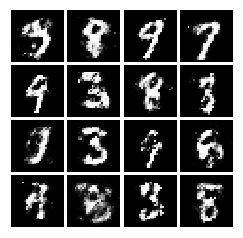

Iter: 20000; D_loss: 0.565; G_loss: 3.421


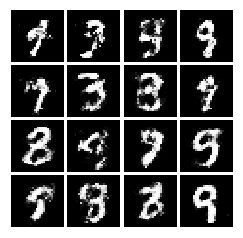

Iter: 20100; D_loss: 0.5769; G_loss: 3.05


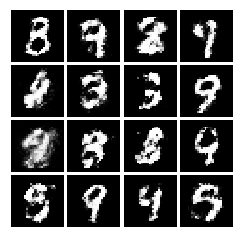

Iter: 20200; D_loss: 0.373; G_loss: 4.026


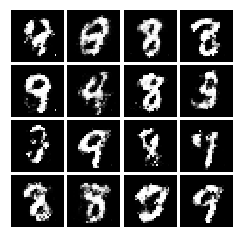

Iter: 20300; D_loss: 0.3185; G_loss: 3.171


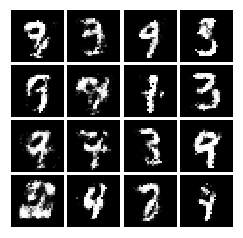

Iter: 20400; D_loss: 0.6065; G_loss: 4.713


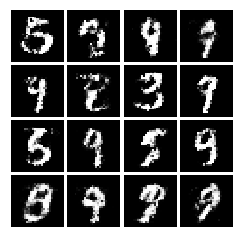

Iter: 20500; D_loss: 0.7987; G_loss: 2.731


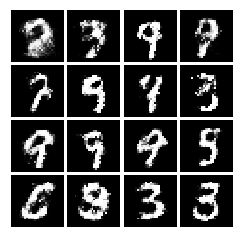

Iter: 20600; D_loss: 0.6283; G_loss: 3.459


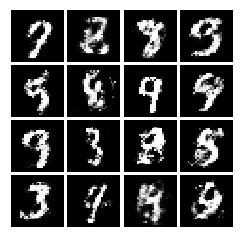

Iter: 20700; D_loss: 0.4106; G_loss: 3.107


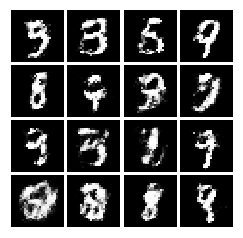

Iter: 20800; D_loss: 0.5665; G_loss: 4.343


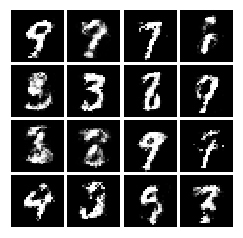

Iter: 20900; D_loss: 0.8047; G_loss: 2.146


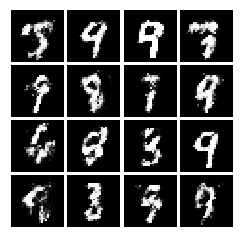

Iter: 21000; D_loss: 0.5603; G_loss: 3.646


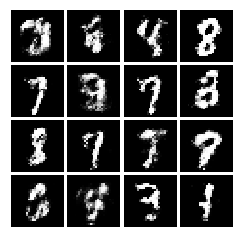

Iter: 21100; D_loss: 0.6412; G_loss: 5.317


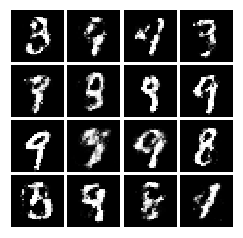

Iter: 21200; D_loss: 0.6289; G_loss: 3.097


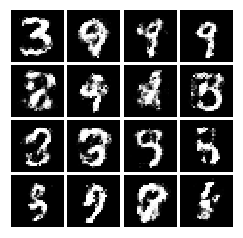

Iter: 21300; D_loss: 0.3895; G_loss: 2.862


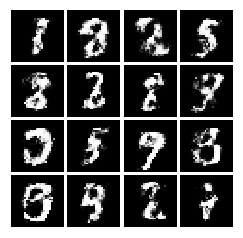

Iter: 21400; D_loss: 0.5269; G_loss: 2.461


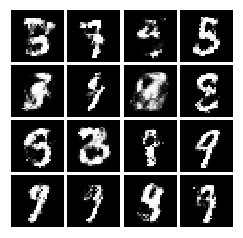

Iter: 21500; D_loss: 0.6331; G_loss: 4.604


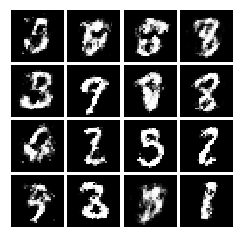

Iter: 21600; D_loss: 0.701; G_loss: 4.015


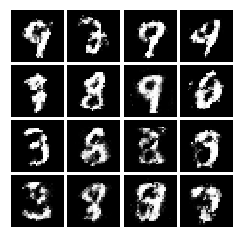

Iter: 21700; D_loss: 0.515; G_loss: 3.952


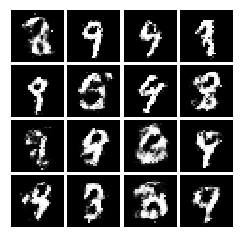

Iter: 21800; D_loss: 0.7293; G_loss: 3.651


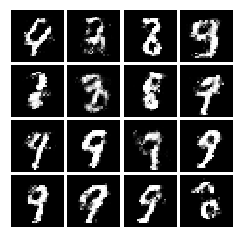

Iter: 21900; D_loss: 0.9864; G_loss: 2.893


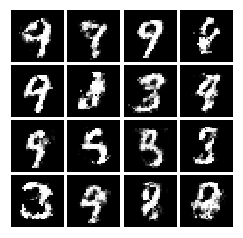

Iter: 22000; D_loss: 0.6517; G_loss: 3.045


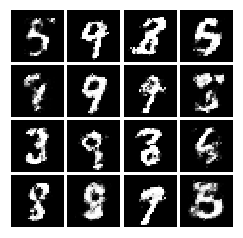

Iter: 22100; D_loss: 0.5234; G_loss: 2.197


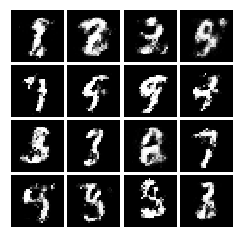

Iter: 22200; D_loss: 0.6576; G_loss: 3.684


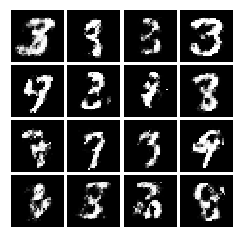

Iter: 22300; D_loss: 0.6054; G_loss: 3.189


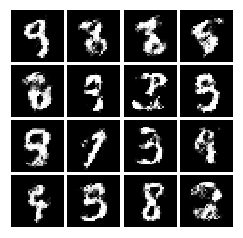

Iter: 22400; D_loss: 0.9619; G_loss: 2.021


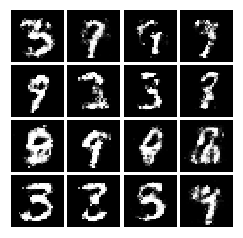

Iter: 22500; D_loss: 0.5595; G_loss: 2.763


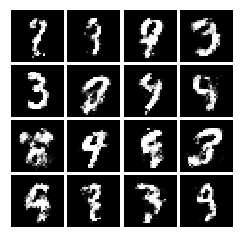

Iter: 22600; D_loss: 0.459; G_loss: 2.971


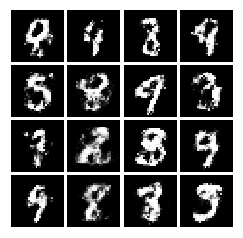

Iter: 22700; D_loss: 0.8231; G_loss: 2.749


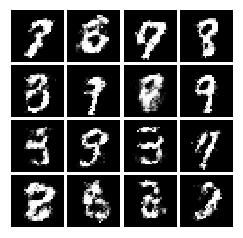

Iter: 22800; D_loss: 0.5015; G_loss: 2.267


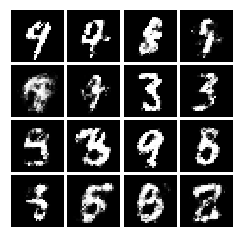

Iter: 22900; D_loss: 0.7982; G_loss: 2.849


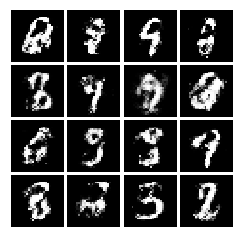

Iter: 23000; D_loss: 0.5442; G_loss: 3.473


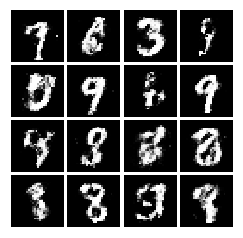

Iter: 23100; D_loss: 0.6086; G_loss: 3.291


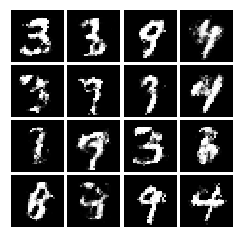

Iter: 23200; D_loss: 0.5052; G_loss: 2.875


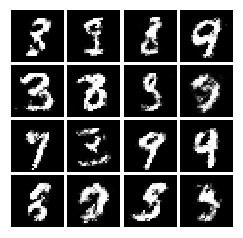

Iter: 23300; D_loss: 0.7254; G_loss: 3.022


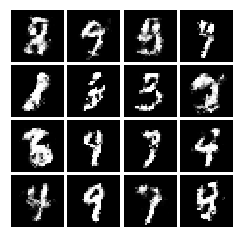

Iter: 23400; D_loss: 0.5765; G_loss: 3.084


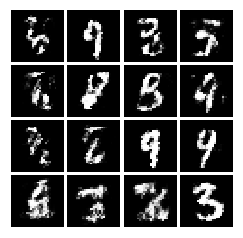

Iter: 23500; D_loss: 0.6682; G_loss: 1.886


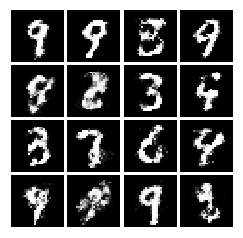

Iter: 23600; D_loss: 0.5668; G_loss: 2.082


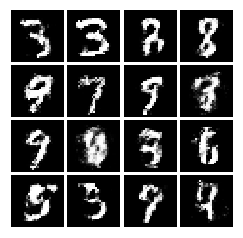

Iter: 23700; D_loss: 0.5044; G_loss: 4.777


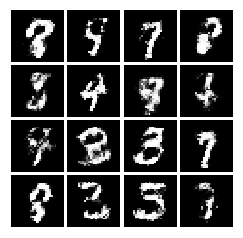

Iter: 23800; D_loss: 0.8036; G_loss: 3.073


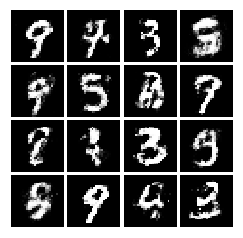

Iter: 23900; D_loss: 0.6997; G_loss: 2.815


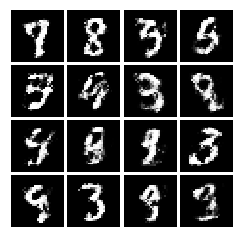

Iter: 24000; D_loss: 0.6031; G_loss: 2.356


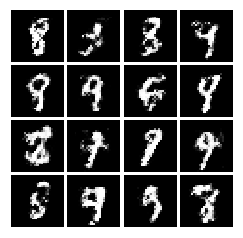

Iter: 24100; D_loss: 0.6003; G_loss: 2.925


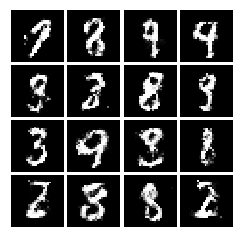

Iter: 24200; D_loss: 0.6544; G_loss: 4.053


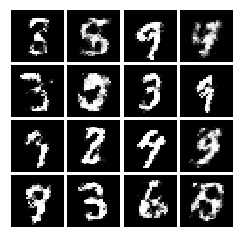

Iter: 24300; D_loss: 0.4738; G_loss: 2.281


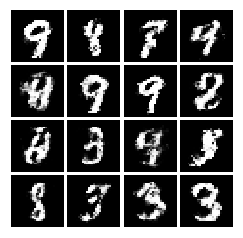

Iter: 24400; D_loss: 0.7564; G_loss: 2.723


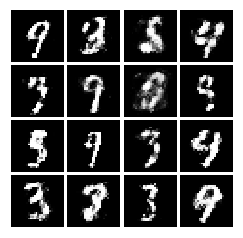

Iter: 24500; D_loss: 0.518; G_loss: 3.462


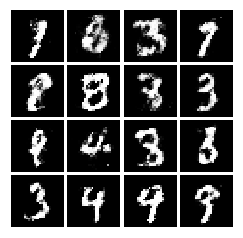

Iter: 24600; D_loss: 0.7533; G_loss: 2.272


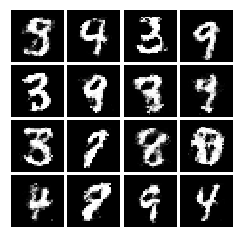

Iter: 24700; D_loss: 0.6848; G_loss: 2.368


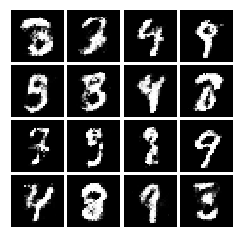

Iter: 24800; D_loss: 0.5776; G_loss: 4.028


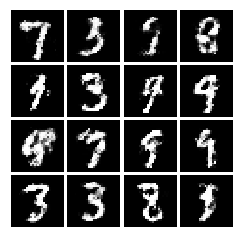

Iter: 24900; D_loss: 0.4445; G_loss: 3.233


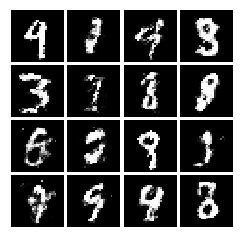

Iter: 25000; D_loss: 0.6915; G_loss: 3.013


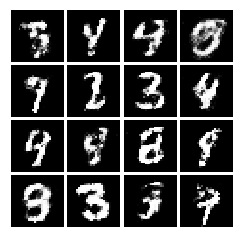

Iter: 25100; D_loss: 0.8606; G_loss: 2.603


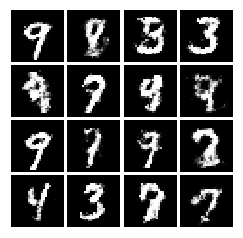

Iter: 25200; D_loss: 0.7954; G_loss: 2.726


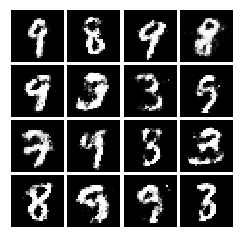

Iter: 25300; D_loss: 0.9265; G_loss: 3.679


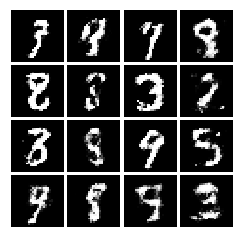

Iter: 25400; D_loss: 0.4223; G_loss: 2.303


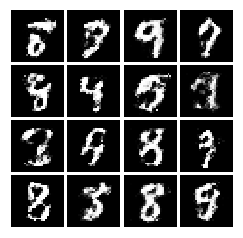

Iter: 25500; D_loss: 0.6783; G_loss: 2.353


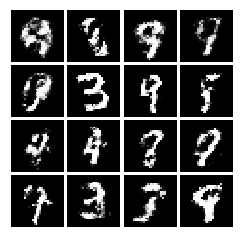

Iter: 25600; D_loss: 0.4833; G_loss: 2.34


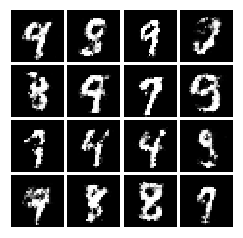

Iter: 25700; D_loss: 0.5323; G_loss: 2.637


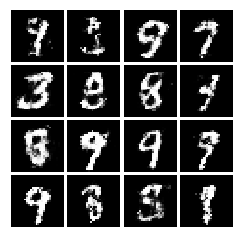

Iter: 25800; D_loss: 0.5594; G_loss: 2.123


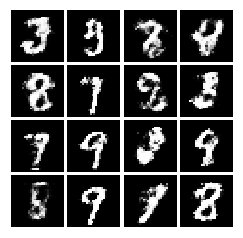

Iter: 25900; D_loss: 0.5908; G_loss: 2.182


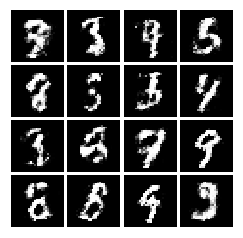

Iter: 26000; D_loss: 0.4951; G_loss: 3.361


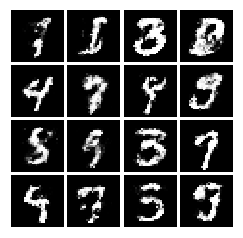

Iter: 26100; D_loss: 0.7115; G_loss: 1.814


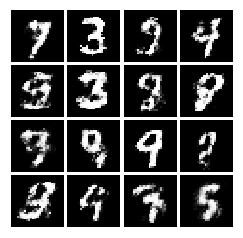

Iter: 26200; D_loss: 0.7994; G_loss: 3.52


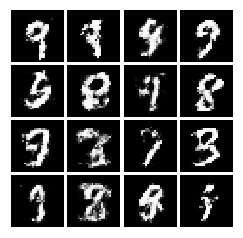

Iter: 26300; D_loss: 0.7033; G_loss: 4.332


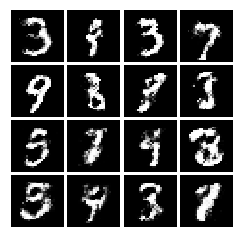

Iter: 26400; D_loss: 0.5003; G_loss: 2.187


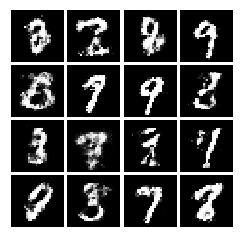

Iter: 26500; D_loss: 0.3788; G_loss: 2.624


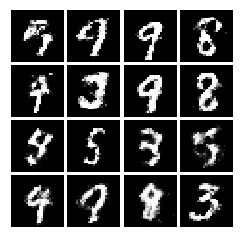

Iter: 26600; D_loss: 0.4595; G_loss: 3.068


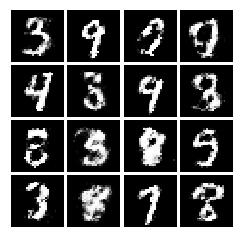

Iter: 26700; D_loss: 0.5781; G_loss: 3.228


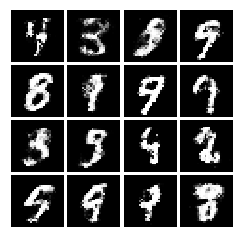

Iter: 26800; D_loss: 0.5721; G_loss: 2.127


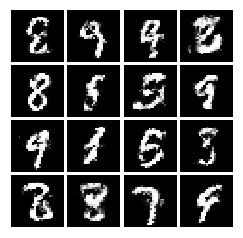

Iter: 26900; D_loss: 0.5925; G_loss: 3.781


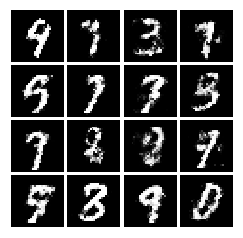

Iter: 27000; D_loss: 0.433; G_loss: 3.954


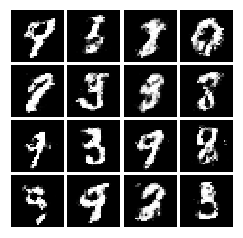

Iter: 27100; D_loss: 0.6729; G_loss: 3.028


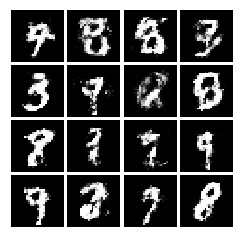

Iter: 27200; D_loss: 0.8369; G_loss: 3.133


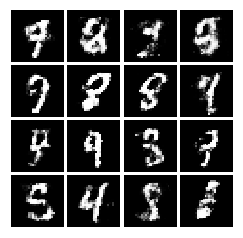

Iter: 27300; D_loss: 0.6673; G_loss: 2.674


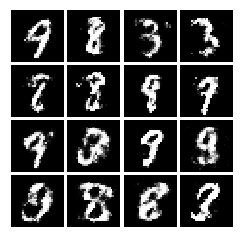

Iter: 27400; D_loss: 0.5621; G_loss: 3.055


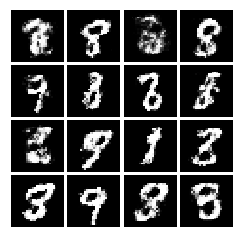

Iter: 27500; D_loss: 0.6315; G_loss: 2.258


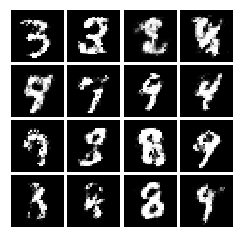

Iter: 27600; D_loss: 0.7444; G_loss: 2.806


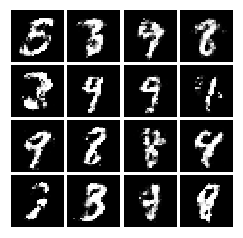

Iter: 27700; D_loss: 0.4828; G_loss: 2.534


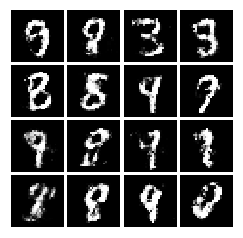

Iter: 27800; D_loss: 0.5386; G_loss: 3.376


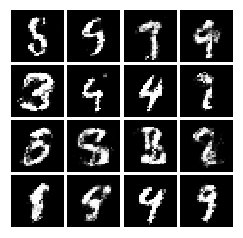

Iter: 27900; D_loss: 0.9095; G_loss: 2.781


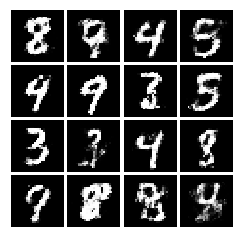

Iter: 28000; D_loss: 0.5475; G_loss: 2.855


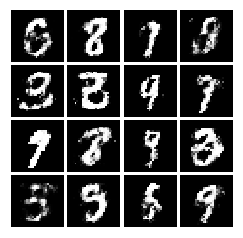

Iter: 28100; D_loss: 0.5225; G_loss: 3.077


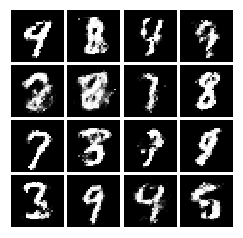

Iter: 28200; D_loss: 0.7299; G_loss: 2.588


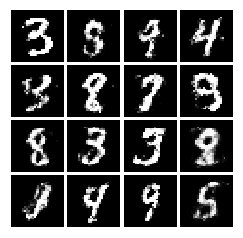

Iter: 28300; D_loss: 0.5284; G_loss: 4.32


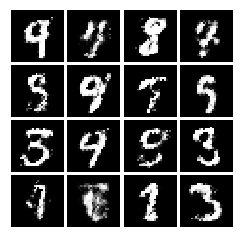

Iter: 28400; D_loss: 0.4272; G_loss: 3.207


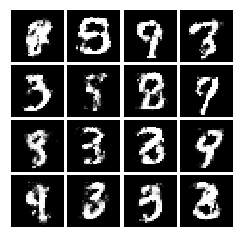

Iter: 28500; D_loss: 0.695; G_loss: 3.22


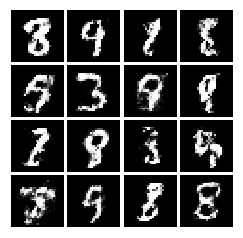

Iter: 28600; D_loss: 0.4949; G_loss: 3.158


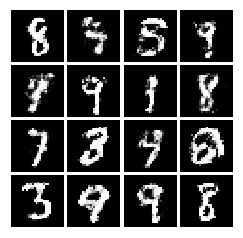

Iter: 28700; D_loss: 0.5274; G_loss: 2.417


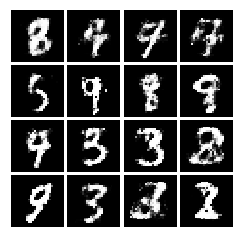

Iter: 28800; D_loss: 0.6804; G_loss: 3.133


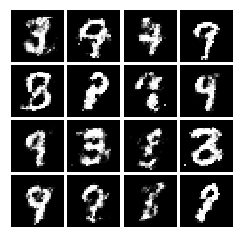

Iter: 28900; D_loss: 0.465; G_loss: 3.484


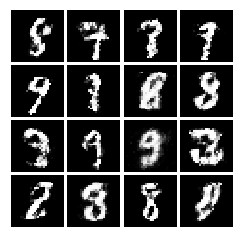

Iter: 29000; D_loss: 0.8581; G_loss: 2.908


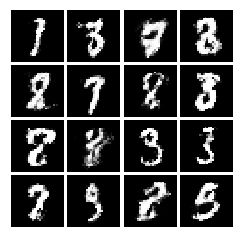

Iter: 29100; D_loss: 0.7438; G_loss: 2.568


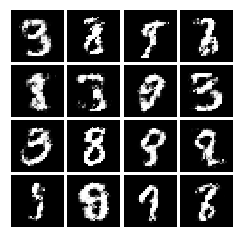

Iter: 29200; D_loss: 0.5311; G_loss: 2.86


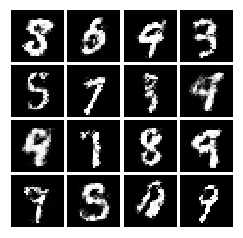

Iter: 29300; D_loss: 0.5356; G_loss: 3.188


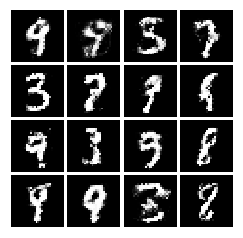

Iter: 29400; D_loss: 0.4781; G_loss: 2.44


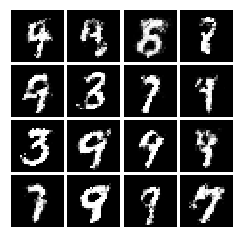

Iter: 29500; D_loss: 0.4575; G_loss: 2.527


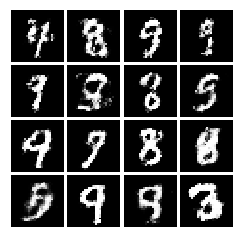

Iter: 29600; D_loss: 0.3963; G_loss: 2.109


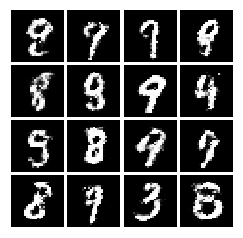

Iter: 29700; D_loss: 0.834; G_loss: 3.232


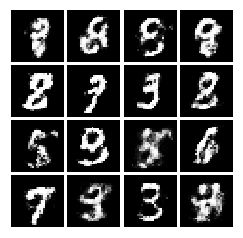

Iter: 29800; D_loss: 0.5883; G_loss: 2.543


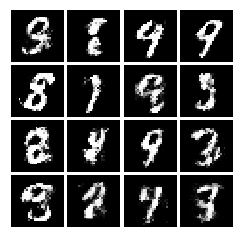

Iter: 29900; D_loss: 0.5055; G_loss: 1.591


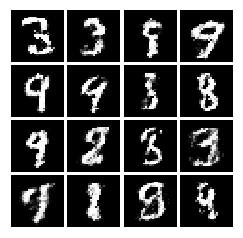

Iter: 30000; D_loss: 0.4998; G_loss: 2.111


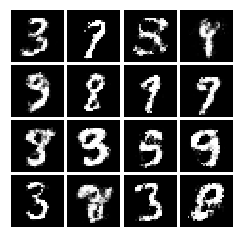

Iter: 30100; D_loss: 0.4788; G_loss: 2.725


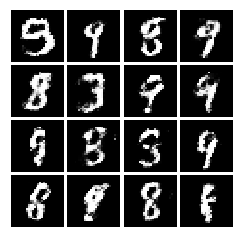

Iter: 30200; D_loss: 0.6628; G_loss: 1.967


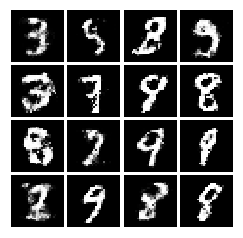

Iter: 30300; D_loss: 0.7697; G_loss: 2.832


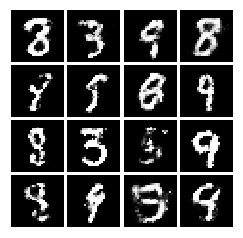

Iter: 30400; D_loss: 0.7336; G_loss: 3.008


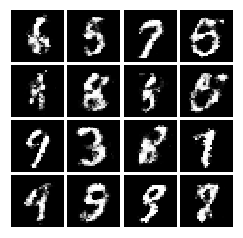

Iter: 30500; D_loss: 0.5333; G_loss: 3.252


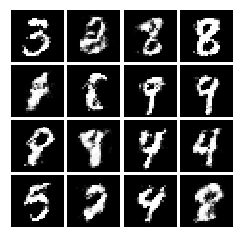

Iter: 30600; D_loss: 0.6209; G_loss: 2.561


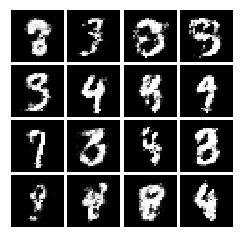

Iter: 30700; D_loss: 0.7521; G_loss: 3.02


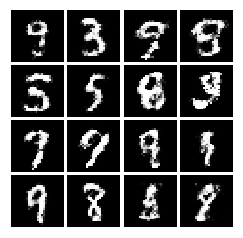

Iter: 30800; D_loss: 0.7571; G_loss: 3.252


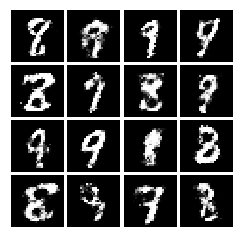

Iter: 30900; D_loss: 0.6226; G_loss: 2.133


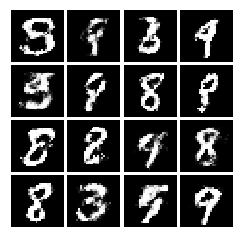

Iter: 31000; D_loss: 0.6905; G_loss: 2.76


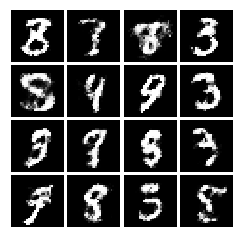

Iter: 31100; D_loss: 0.7733; G_loss: 4.281


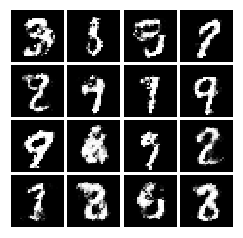

Iter: 31200; D_loss: 0.4423; G_loss: 3.269


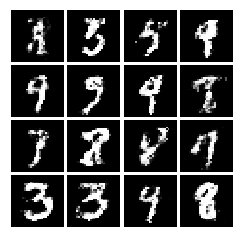

Iter: 31300; D_loss: 0.6109; G_loss: 2.429


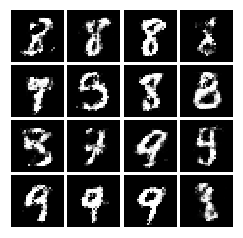

Iter: 31400; D_loss: 0.6898; G_loss: 3.553


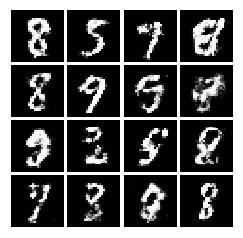

Iter: 31500; D_loss: 0.6903; G_loss: 3.236


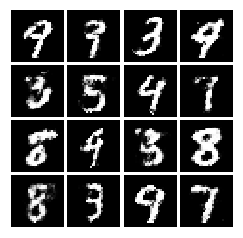

Iter: 31600; D_loss: 0.7543; G_loss: 3.211


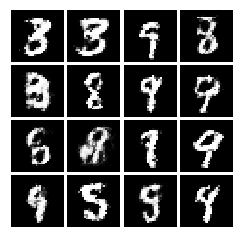

Iter: 31700; D_loss: 0.7039; G_loss: 2.858


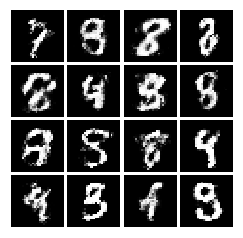

Iter: 31800; D_loss: 0.4671; G_loss: 3.357


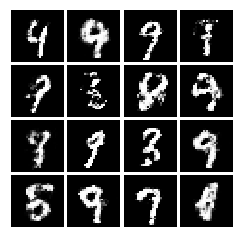

Iter: 31900; D_loss: 0.5575; G_loss: 3.147


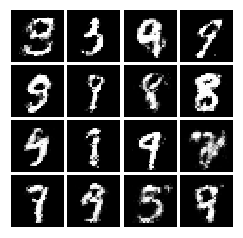

Iter: 32000; D_loss: 0.3661; G_loss: 3.24


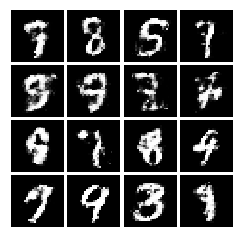

Iter: 32100; D_loss: 0.891; G_loss: 1.796


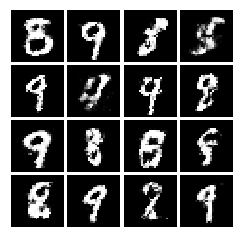

Iter: 32200; D_loss: 0.708; G_loss: 1.961


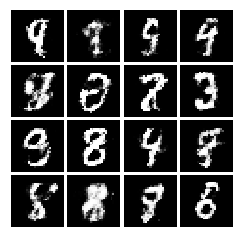

Iter: 32300; D_loss: 0.8274; G_loss: 3.303


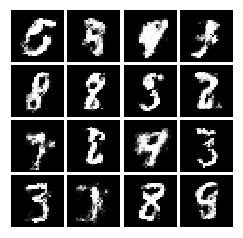

Iter: 32400; D_loss: 0.5683; G_loss: 2.741


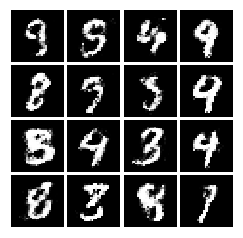

Iter: 32500; D_loss: 0.5879; G_loss: 1.951


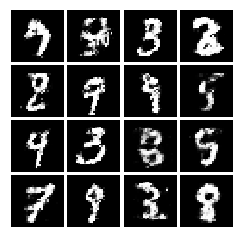

Iter: 32600; D_loss: 0.8823; G_loss: 2.534


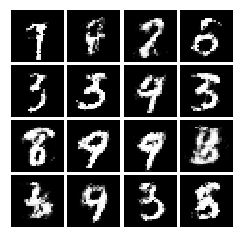

Iter: 32700; D_loss: 0.4802; G_loss: 3.492


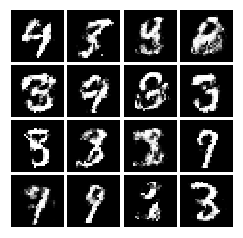

Iter: 32800; D_loss: 0.808; G_loss: 2.951


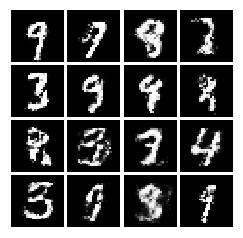

Iter: 32900; D_loss: 0.4502; G_loss: 3.611


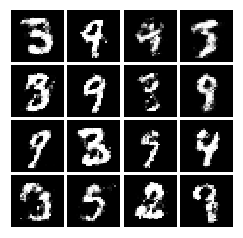

Iter: 33000; D_loss: 0.8814; G_loss: 3.394


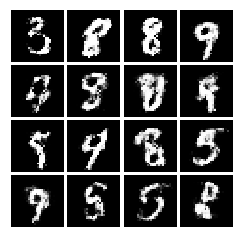

Iter: 33100; D_loss: 0.5846; G_loss: 2.264


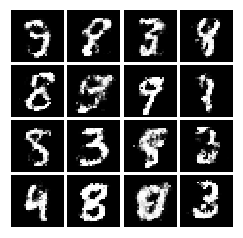

Iter: 33200; D_loss: 0.6825; G_loss: 2.266


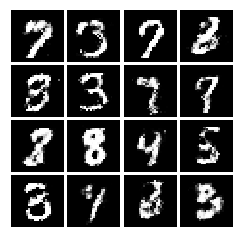

Iter: 33300; D_loss: 0.4385; G_loss: 2.616


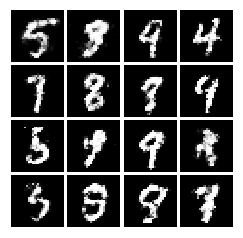

Iter: 33400; D_loss: 0.4767; G_loss: 4.378


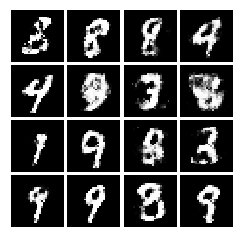

Iter: 33500; D_loss: 0.4886; G_loss: 3.238


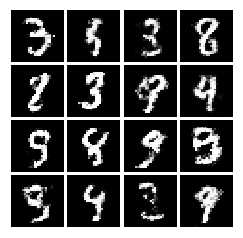

Iter: 33600; D_loss: 0.8131; G_loss: 2.773


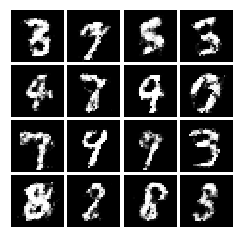

Iter: 33700; D_loss: 0.5624; G_loss: 2.764


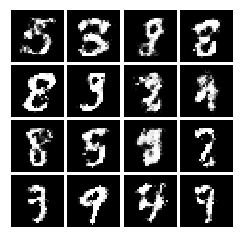

Iter: 33800; D_loss: 0.5681; G_loss: 4.323


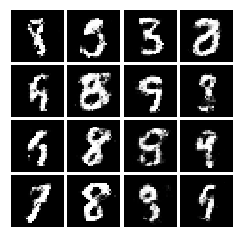

Iter: 33900; D_loss: 0.569; G_loss: 2.102


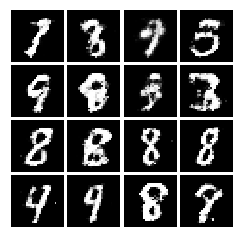

Iter: 34000; D_loss: 0.7202; G_loss: 3.277


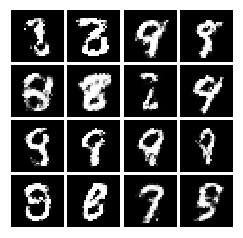

Iter: 34100; D_loss: 0.7156; G_loss: 2.464


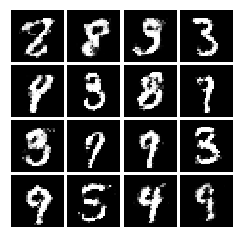

Iter: 34200; D_loss: 0.7609; G_loss: 3.359


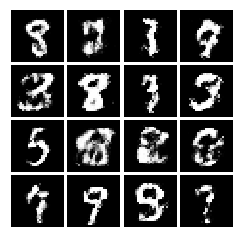

Iter: 34300; D_loss: 0.4944; G_loss: 1.591


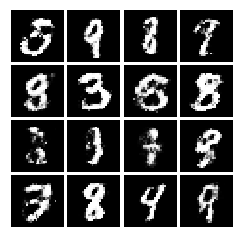

Iter: 34400; D_loss: 0.3295; G_loss: 3.098


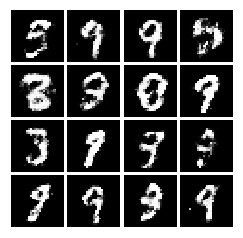

Iter: 34500; D_loss: 0.56; G_loss: 2.355


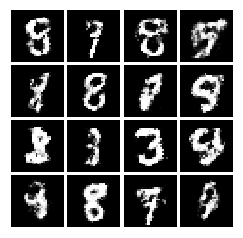

Iter: 34600; D_loss: 0.4667; G_loss: 2.015


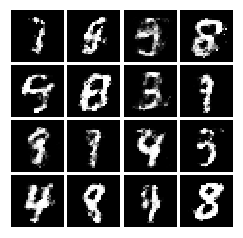

Iter: 34700; D_loss: 0.4177; G_loss: 2.509


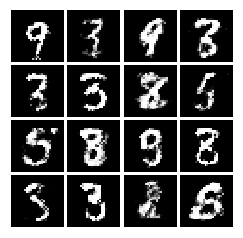

Iter: 34800; D_loss: 0.744; G_loss: 3.433


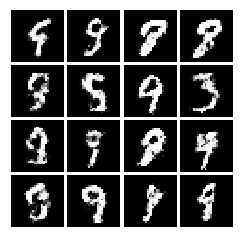

Iter: 34900; D_loss: 0.5661; G_loss: 3.708


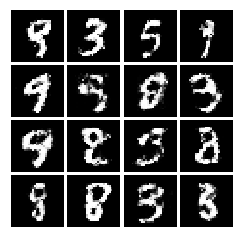

Iter: 35000; D_loss: 0.4015; G_loss: 2.607


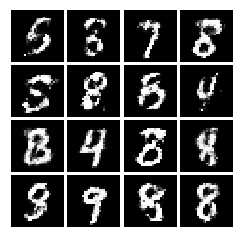

Iter: 35100; D_loss: 0.501; G_loss: 3.193


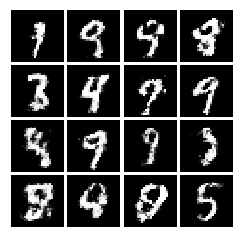

Iter: 35200; D_loss: 0.5416; G_loss: 1.538


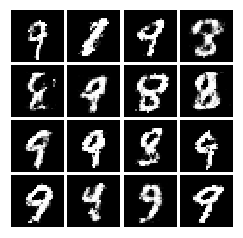

Iter: 35300; D_loss: 0.6414; G_loss: 3.188


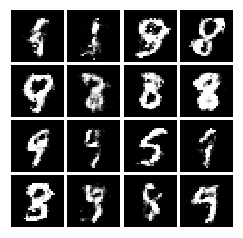

Iter: 35400; D_loss: 0.4668; G_loss: 2.454


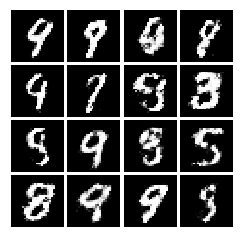

Iter: 35500; D_loss: 0.6362; G_loss: 2.679


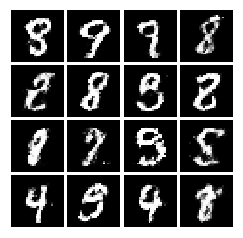

Iter: 35600; D_loss: 0.4132; G_loss: 2.574


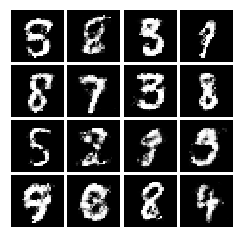

Iter: 35700; D_loss: 0.5236; G_loss: 2.203


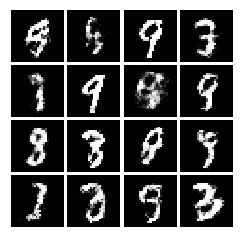

Iter: 35800; D_loss: 0.7753; G_loss: 3.692


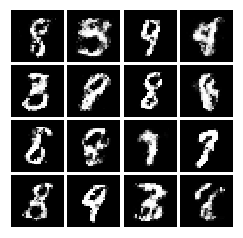

Iter: 35900; D_loss: 0.6045; G_loss: 3.213


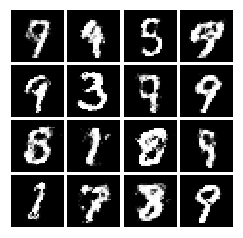

Iter: 36000; D_loss: 0.7231; G_loss: 3.648


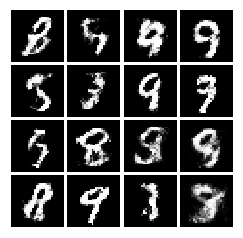

Iter: 36100; D_loss: 0.6075; G_loss: 2.874


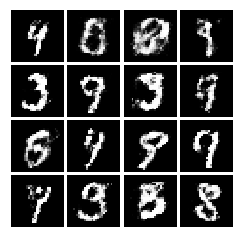

Iter: 36200; D_loss: 0.3924; G_loss: 2.316


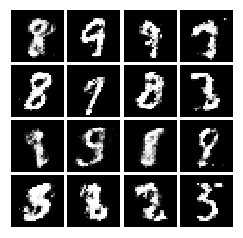

Iter: 36300; D_loss: 0.3252; G_loss: 3.617


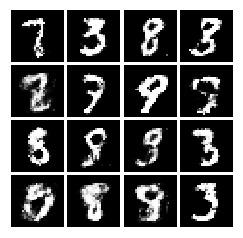

Iter: 36400; D_loss: 0.526; G_loss: 2.254


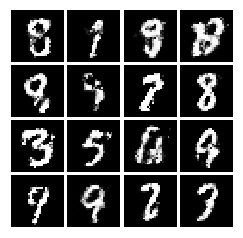

Iter: 36500; D_loss: 0.4304; G_loss: 3.625


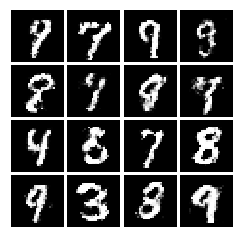

Iter: 36600; D_loss: 0.6378; G_loss: 2.734


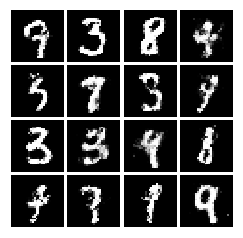

Iter: 36700; D_loss: 0.5342; G_loss: 3.745


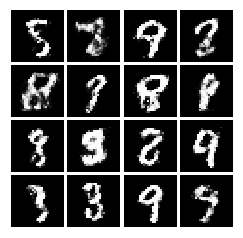

Iter: 36800; D_loss: 0.6759; G_loss: 3.836


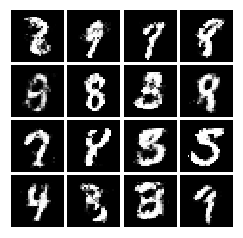

Iter: 36900; D_loss: 0.6073; G_loss: 3.984


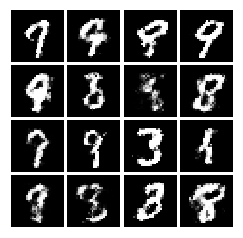

Iter: 37000; D_loss: 0.5516; G_loss: 2.223


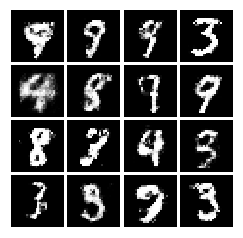

Iter: 37100; D_loss: 0.7354; G_loss: 2.456


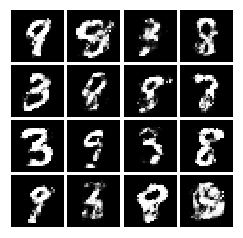

Iter: 37200; D_loss: 0.5331; G_loss: 2.55


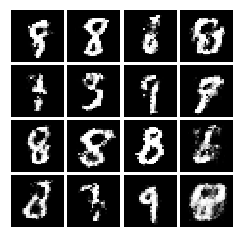

Iter: 37300; D_loss: 0.4296; G_loss: 3.509


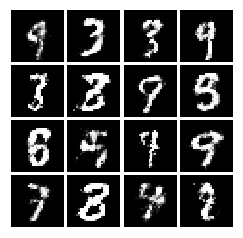

Iter: 37400; D_loss: 0.4748; G_loss: 3.094


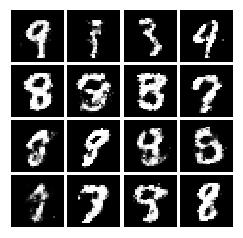

Iter: 37500; D_loss: 0.6357; G_loss: 2.021


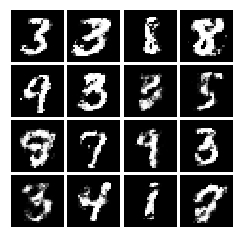

Iter: 37600; D_loss: 0.4986; G_loss: 2.883


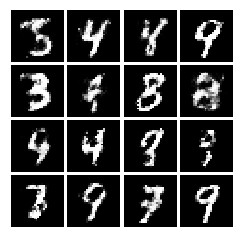

Iter: 37700; D_loss: 0.7136; G_loss: 2.108


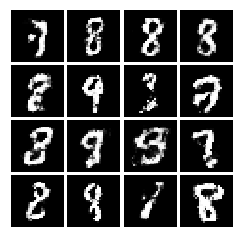

Iter: 37800; D_loss: 0.8153; G_loss: 2.269


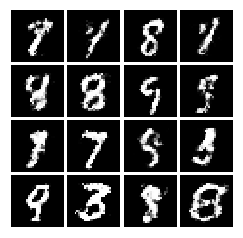

Iter: 37900; D_loss: 0.4949; G_loss: 3.177


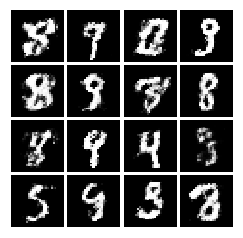

Iter: 38000; D_loss: 0.5121; G_loss: 3.648


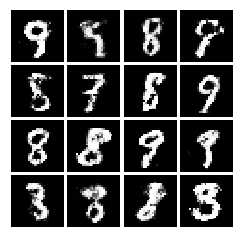

Iter: 38100; D_loss: 0.7886; G_loss: 3.126


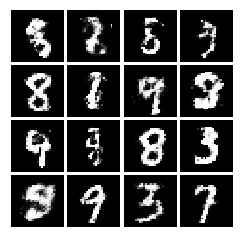

Iter: 38200; D_loss: 0.5381; G_loss: 2.801


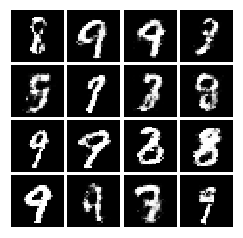

Iter: 38300; D_loss: 0.423; G_loss: 1.853


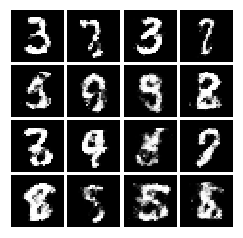

Iter: 38400; D_loss: 0.5664; G_loss: 4.474


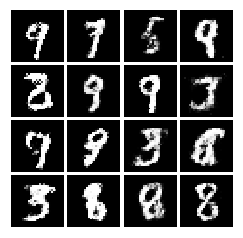

Iter: 38500; D_loss: 0.5933; G_loss: 3.734


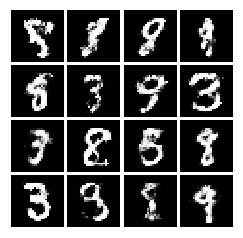

Iter: 38600; D_loss: 0.4328; G_loss: 3.358


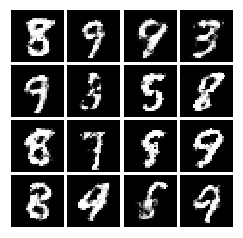

Iter: 38700; D_loss: 0.5005; G_loss: 2.061


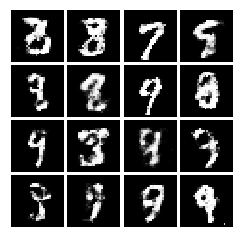

Iter: 38800; D_loss: 0.6039; G_loss: 2.638


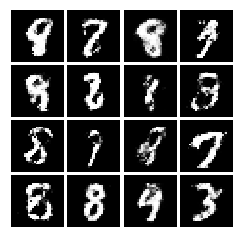

Iter: 38900; D_loss: 0.62; G_loss: 3.892


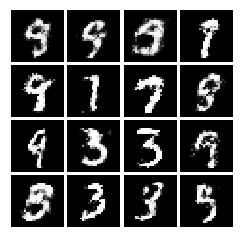

Iter: 39000; D_loss: 0.4925; G_loss: 1.928


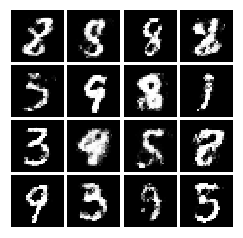

Iter: 39100; D_loss: 0.6218; G_loss: 3.339


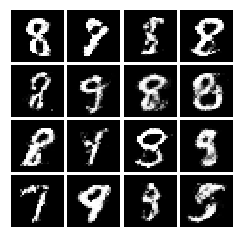

Iter: 39200; D_loss: 0.5251; G_loss: 2.734


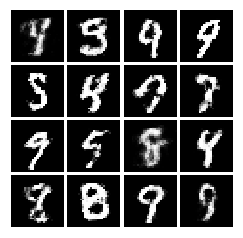

Iter: 39300; D_loss: 0.4384; G_loss: 3.158


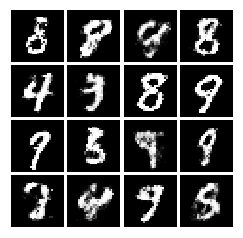

Iter: 39400; D_loss: 0.3816; G_loss: 3.027


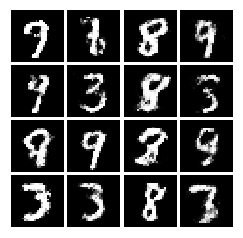

Iter: 39500; D_loss: 0.5366; G_loss: 2.253


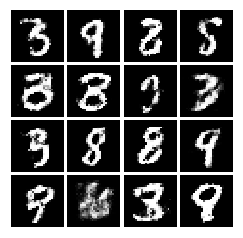

Iter: 39600; D_loss: 0.7617; G_loss: 1.994


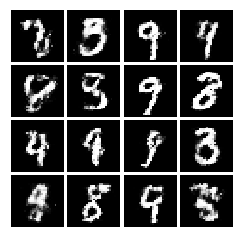

Iter: 39700; D_loss: 0.4838; G_loss: 2.591


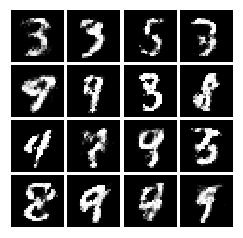

Iter: 39800; D_loss: 0.7188; G_loss: 2.989


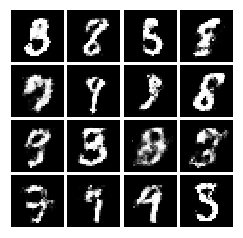

Iter: 39900; D_loss: 0.5596; G_loss: 4.701


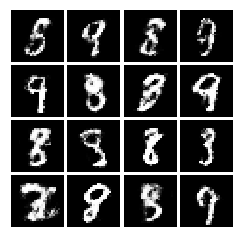

Iter: 40000; D_loss: 0.9242; G_loss: 5.968


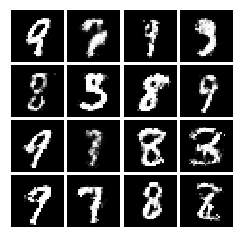

Iter: 40100; D_loss: 0.627; G_loss: 1.88


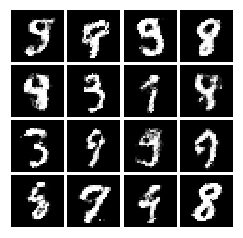

Iter: 40200; D_loss: 0.5969; G_loss: 3.398


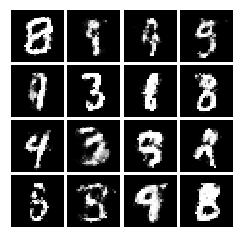

Iter: 40300; D_loss: 0.7124; G_loss: 3.149


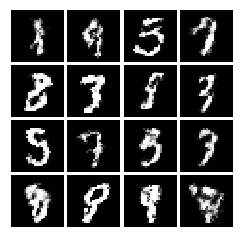

Iter: 40400; D_loss: 0.8303; G_loss: 3.602


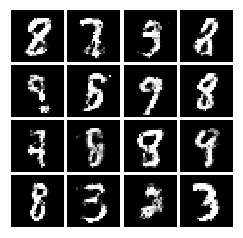

Iter: 40500; D_loss: 0.6613; G_loss: 2.925


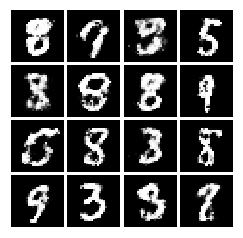

Iter: 40600; D_loss: 0.5496; G_loss: 1.792


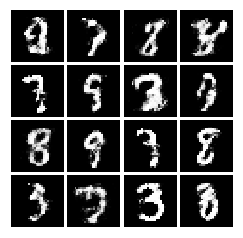

Iter: 40700; D_loss: 0.8671; G_loss: 3.282


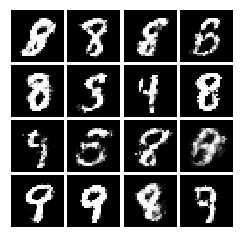

Iter: 40800; D_loss: 0.7309; G_loss: 2.138


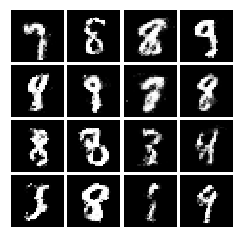

Iter: 40900; D_loss: 0.712; G_loss: 4.869


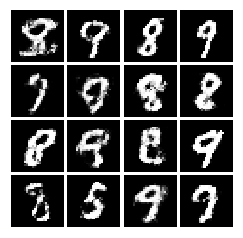

Iter: 41000; D_loss: 0.5103; G_loss: 2.784


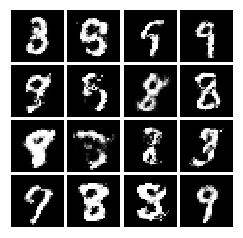

Iter: 41100; D_loss: 0.3448; G_loss: 4.033


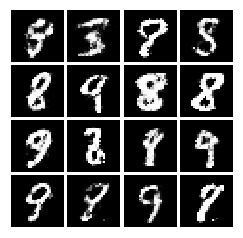

Iter: 41200; D_loss: 0.4588; G_loss: 3.733


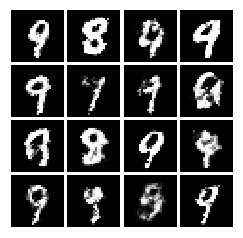

Iter: 41300; D_loss: 0.5895; G_loss: 3.159


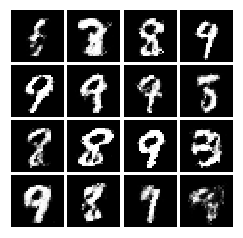

Iter: 41400; D_loss: 0.48; G_loss: 3.576


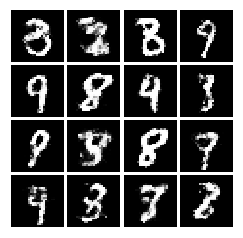

Iter: 41500; D_loss: 0.4079; G_loss: 4.204


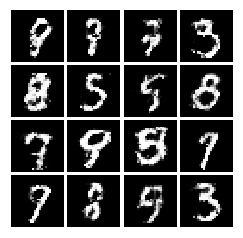

Iter: 41600; D_loss: 0.5919; G_loss: 3.226


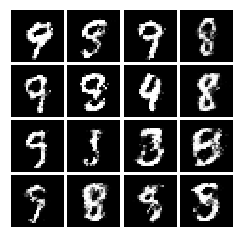

Iter: 41700; D_loss: 0.4692; G_loss: 3.124


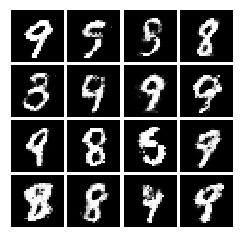

Iter: 41800; D_loss: 0.4478; G_loss: 3.193


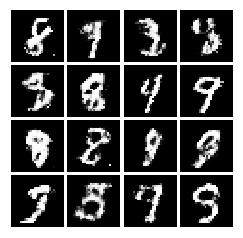

Iter: 41900; D_loss: 0.7307; G_loss: 3.018


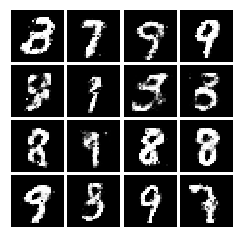

Iter: 42000; D_loss: 0.4717; G_loss: 4.308


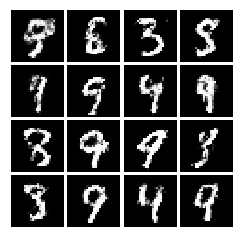

Iter: 42100; D_loss: 0.7035; G_loss: 3.97


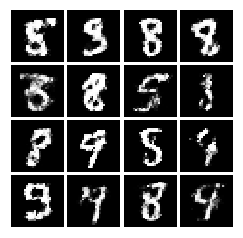

Iter: 42200; D_loss: 0.4586; G_loss: 4.193


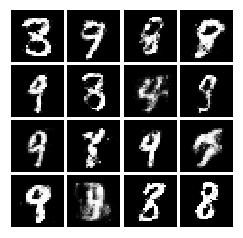

Iter: 42300; D_loss: 0.5432; G_loss: 2.944


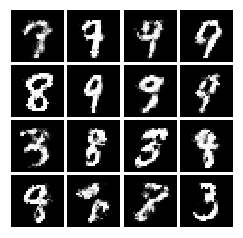

Iter: 42400; D_loss: 0.3571; G_loss: 4.436


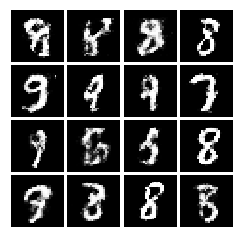

Iter: 42500; D_loss: 0.3079; G_loss: 4.0


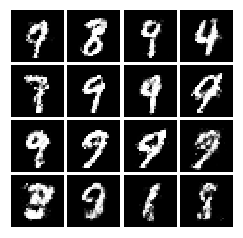

Iter: 42600; D_loss: 0.6184; G_loss: 4.953


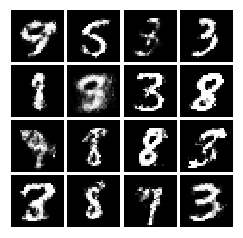

Iter: 42700; D_loss: 0.4783; G_loss: 2.004


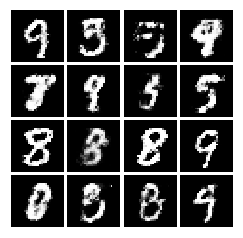

Iter: 42800; D_loss: 0.6316; G_loss: 3.578


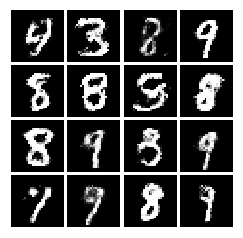

Iter: 42900; D_loss: 0.4405; G_loss: 3.211


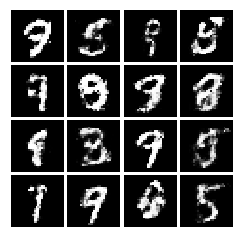

Iter: 43000; D_loss: 0.3863; G_loss: 2.461


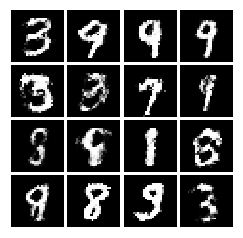

Iter: 43100; D_loss: 0.4847; G_loss: 4.206


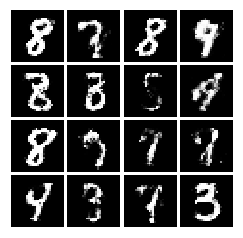

Iter: 43200; D_loss: 0.5372; G_loss: 3.265


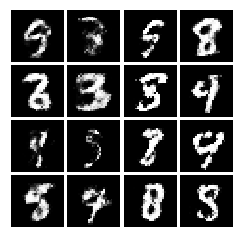

Iter: 43300; D_loss: 1.033; G_loss: 3.709


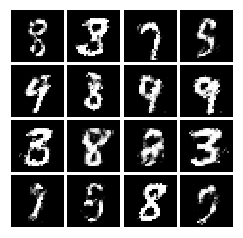

Iter: 43400; D_loss: 0.5982; G_loss: 2.779


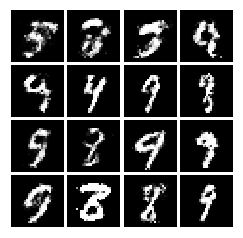

Iter: 43500; D_loss: 0.403; G_loss: 3.265


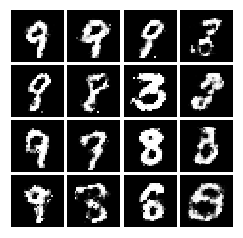

Iter: 43600; D_loss: 0.4717; G_loss: 3.749


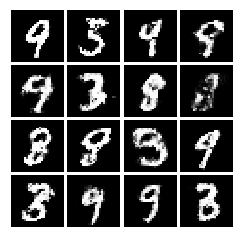

Iter: 43700; D_loss: 0.6742; G_loss: 4.236


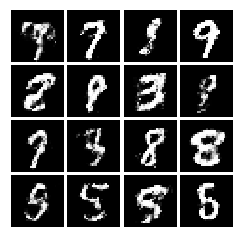

Iter: 43800; D_loss: 0.5309; G_loss: 4.329


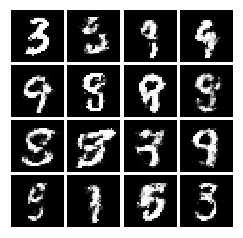

Iter: 43900; D_loss: 0.6203; G_loss: 4.077


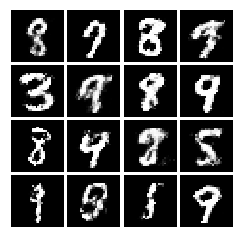

Iter: 44000; D_loss: 0.4739; G_loss: 2.797


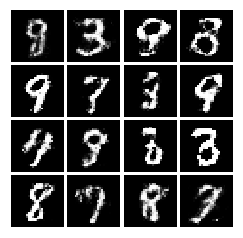

Iter: 44100; D_loss: 0.5247; G_loss: 4.236


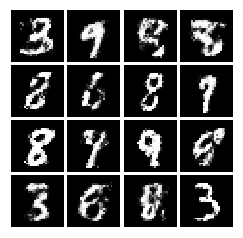

Iter: 44200; D_loss: 0.6611; G_loss: 2.564


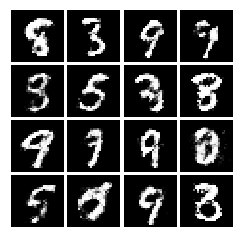

Iter: 44300; D_loss: 0.4754; G_loss: 3.613


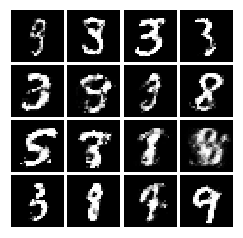

Iter: 44400; D_loss: 0.598; G_loss: 4.05


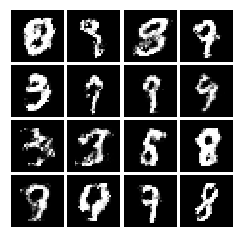

Iter: 44500; D_loss: 0.4395; G_loss: 3.317


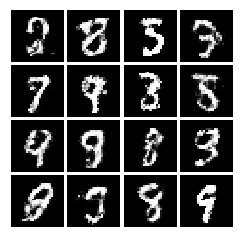

Iter: 44600; D_loss: 0.617; G_loss: 2.318


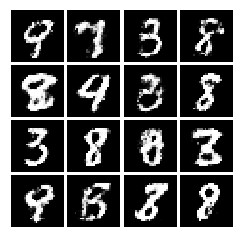

Iter: 44700; D_loss: 0.4413; G_loss: 4.337


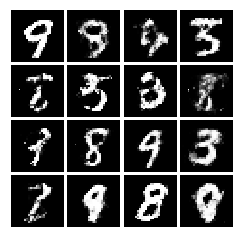

Iter: 44800; D_loss: 0.4325; G_loss: 3.45


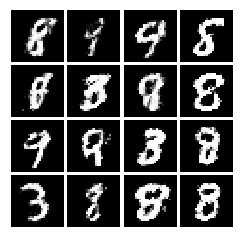

Iter: 44900; D_loss: 0.5445; G_loss: 3.645


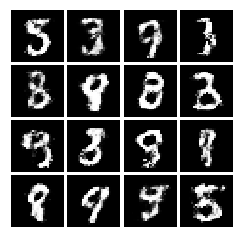

Iter: 45000; D_loss: 0.6514; G_loss: 2.882


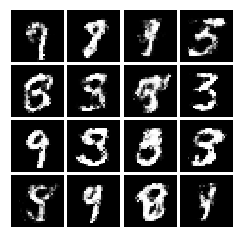

Iter: 45100; D_loss: 0.5949; G_loss: 4.611


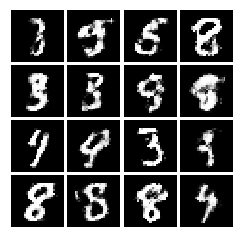

Iter: 45200; D_loss: 0.5381; G_loss: 2.674


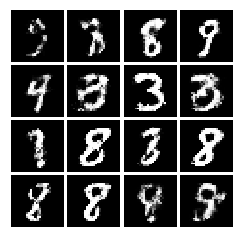

Iter: 45300; D_loss: 0.767; G_loss: 3.702


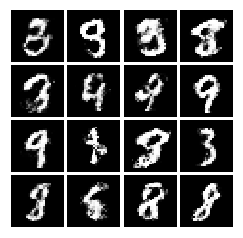

Iter: 45400; D_loss: 0.3799; G_loss: 2.966


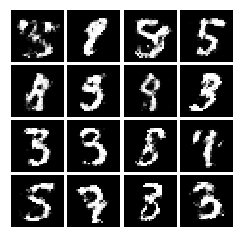

Iter: 45500; D_loss: 0.7943; G_loss: 3.057


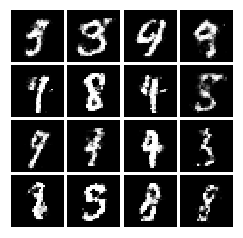

Iter: 45600; D_loss: 0.5602; G_loss: 3.635


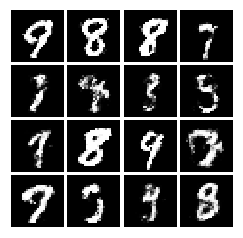

Iter: 45700; D_loss: 0.5452; G_loss: 3.331


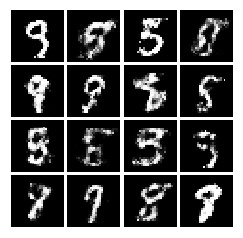

Iter: 45800; D_loss: 0.4624; G_loss: 2.152


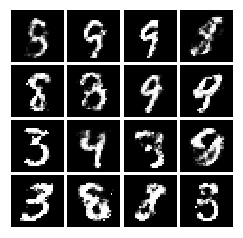

Iter: 45900; D_loss: 0.6165; G_loss: 3.363


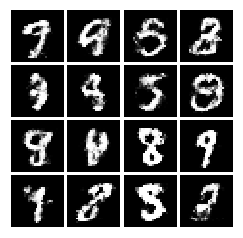

Iter: 46000; D_loss: 0.7153; G_loss: 3.83


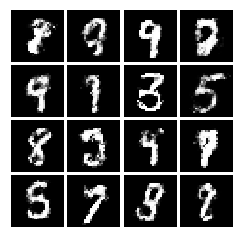

Iter: 46100; D_loss: 0.4862; G_loss: 4.902


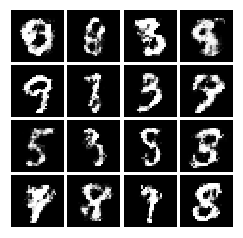

Iter: 46200; D_loss: 0.359; G_loss: 3.163


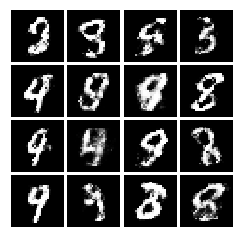

Iter: 46300; D_loss: 0.6068; G_loss: 3.161


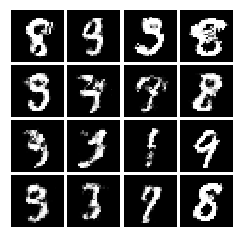

Iter: 46400; D_loss: 0.6784; G_loss: 2.93


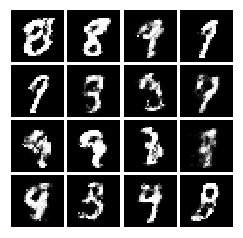

Iter: 46500; D_loss: 0.7939; G_loss: 4.091


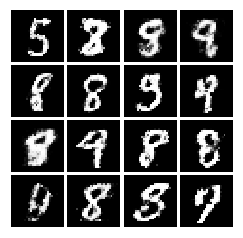

Iter: 46600; D_loss: 0.6277; G_loss: 3.472


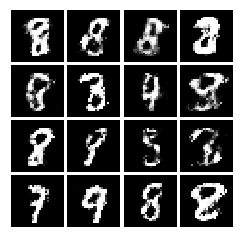

Iter: 46700; D_loss: 0.4123; G_loss: 4.21


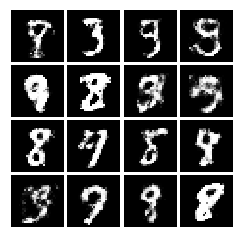

Iter: 46800; D_loss: 0.621; G_loss: 3.607


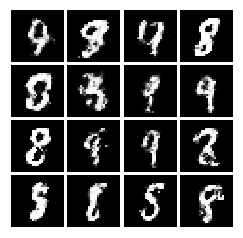

Iter: 46900; D_loss: 0.7831; G_loss: 2.617


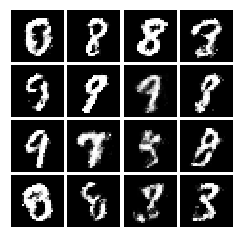

Iter: 47000; D_loss: 0.5051; G_loss: 3.741


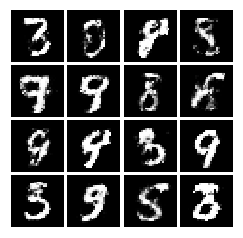

Iter: 47100; D_loss: 0.612; G_loss: 5.403


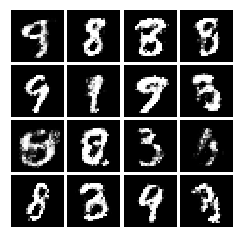

Iter: 47200; D_loss: 0.4102; G_loss: 2.813


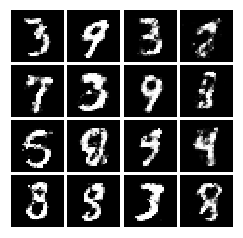

Iter: 47300; D_loss: 0.645; G_loss: 4.087


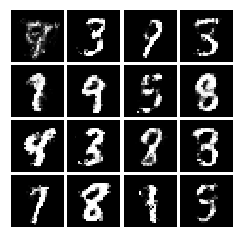

Iter: 47400; D_loss: 0.4499; G_loss: 4.452


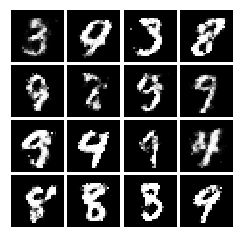

Iter: 47500; D_loss: 0.3965; G_loss: 3.971


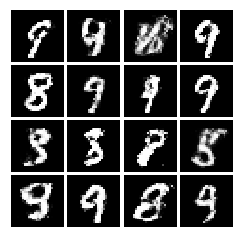

Iter: 47600; D_loss: 0.3498; G_loss: 4.286


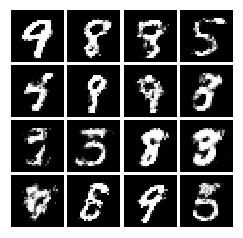

Iter: 47700; D_loss: 0.6552; G_loss: 3.919


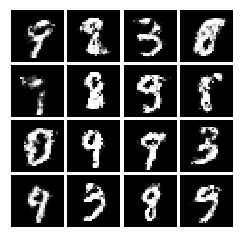

Iter: 47800; D_loss: 0.5526; G_loss: 3.181


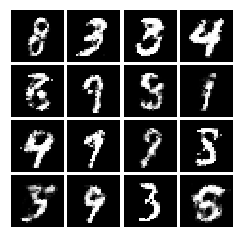

Iter: 47900; D_loss: 0.5949; G_loss: 2.593


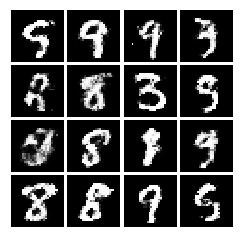

Iter: 48000; D_loss: 0.4483; G_loss: 3.661


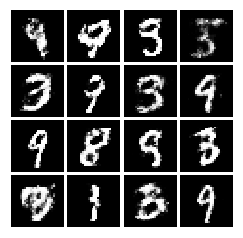

Iter: 48100; D_loss: 0.8791; G_loss: 3.451


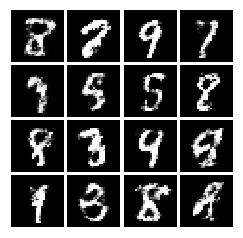

Iter: 48200; D_loss: 0.7243; G_loss: 3.263


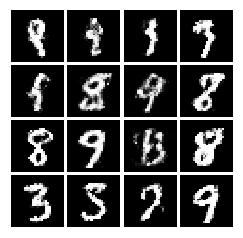

Iter: 48300; D_loss: 0.3948; G_loss: 2.557


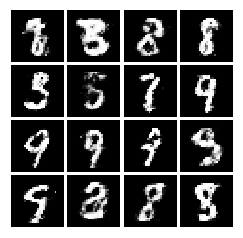

Iter: 48400; D_loss: 0.2729; G_loss: 4.034


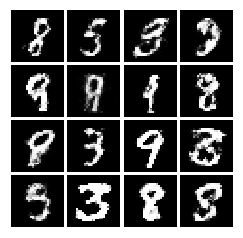

Iter: 48500; D_loss: 0.4907; G_loss: 3.749


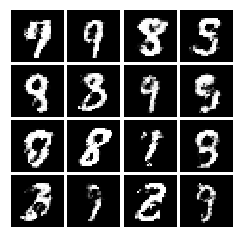

Iter: 48600; D_loss: 0.4672; G_loss: 3.904


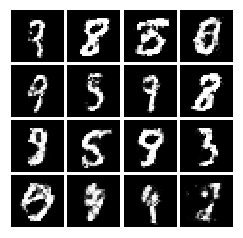

Iter: 48700; D_loss: 0.6132; G_loss: 3.868


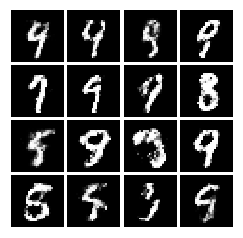

Iter: 48800; D_loss: 0.6343; G_loss: 3.209


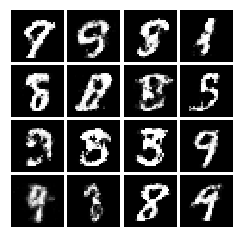

Iter: 48900; D_loss: 0.4968; G_loss: 3.787


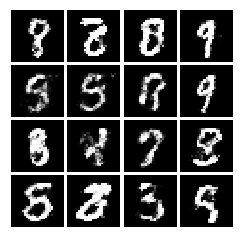

Iter: 49000; D_loss: 0.5718; G_loss: 4.025


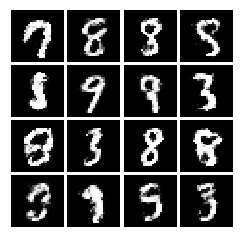

Iter: 49100; D_loss: 0.4113; G_loss: 3.827


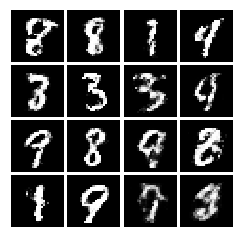

Iter: 49200; D_loss: 0.5571; G_loss: 2.634


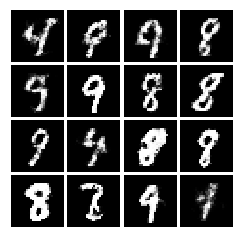

Iter: 49300; D_loss: 0.4041; G_loss: 3.713


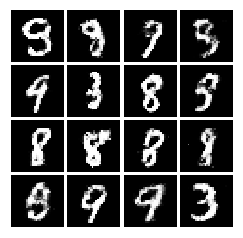

Iter: 49400; D_loss: 0.4325; G_loss: 2.647


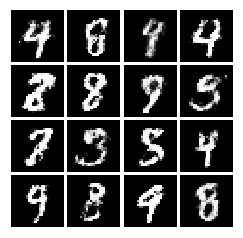

Iter: 49500; D_loss: 0.7628; G_loss: 3.751


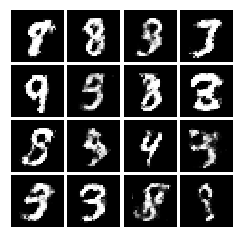

Iter: 49600; D_loss: 0.412; G_loss: 1.875


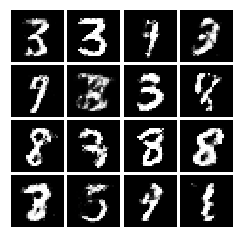

Iter: 49700; D_loss: 0.5368; G_loss: 5.966


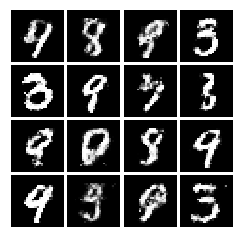

Iter: 49800; D_loss: 0.4836; G_loss: 2.325


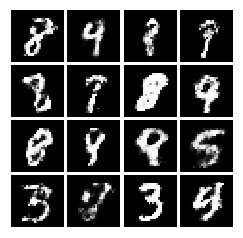

Iter: 49900; D_loss: 0.5639; G_loss: 3.726


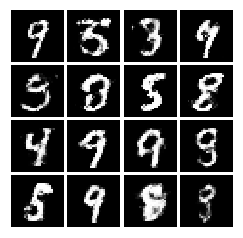

Iter: 50000; D_loss: 0.5246; G_loss: 2.76


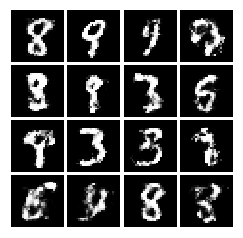

Iter: 50100; D_loss: 0.3333; G_loss: 3.373


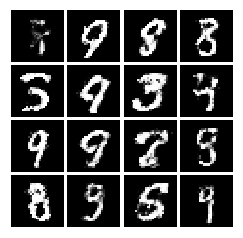

Iter: 50200; D_loss: 0.601; G_loss: 3.522


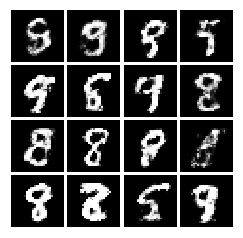

Iter: 50300; D_loss: 0.271; G_loss: 3.006


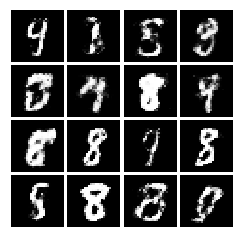

Iter: 50400; D_loss: 0.7333; G_loss: 3.424


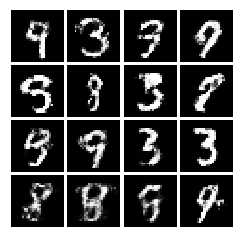

Iter: 50500; D_loss: 0.6138; G_loss: 4.48


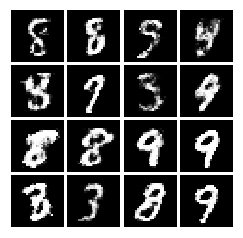

Iter: 50600; D_loss: 0.3305; G_loss: 4.656


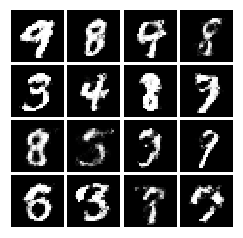

Iter: 50700; D_loss: 0.4231; G_loss: 3.755


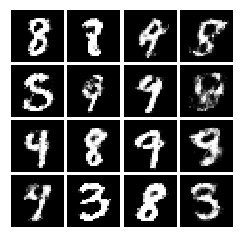

Iter: 50800; D_loss: 0.3458; G_loss: 3.727


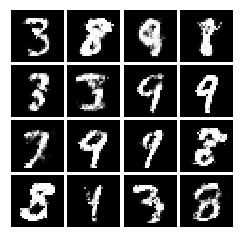

Iter: 50900; D_loss: 0.4961; G_loss: 3.581


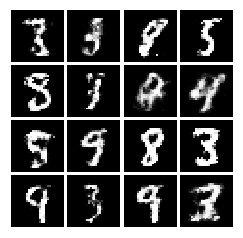

Iter: 51000; D_loss: 0.4695; G_loss: 3.083


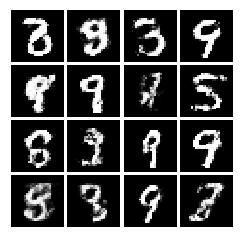

Iter: 51100; D_loss: 0.3534; G_loss: 3.526


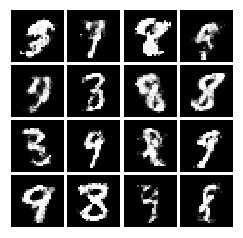

Iter: 51200; D_loss: 0.5068; G_loss: 3.343


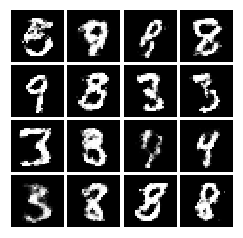

Iter: 51300; D_loss: 0.3801; G_loss: 3.336


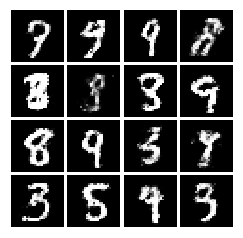

Iter: 51400; D_loss: 0.4384; G_loss: 2.9


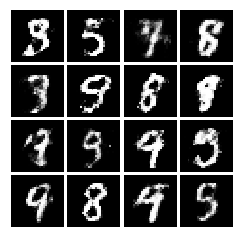

Iter: 51500; D_loss: 0.3597; G_loss: 4.233


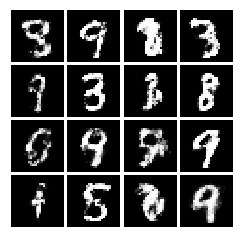

Iter: 51600; D_loss: 0.456; G_loss: 2.842


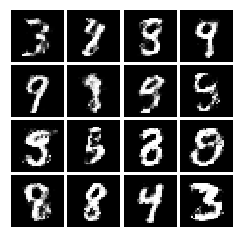

Iter: 51700; D_loss: 0.4371; G_loss: 3.905


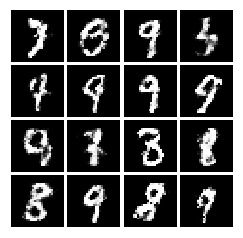

Iter: 51800; D_loss: 0.4958; G_loss: 3.449


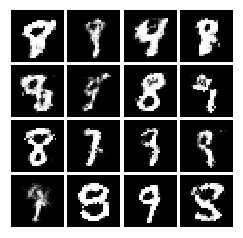

Iter: 51900; D_loss: 0.3108; G_loss: 3.982


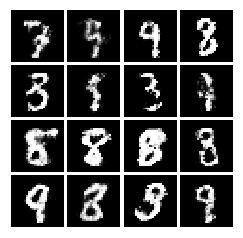

Iter: 52000; D_loss: 0.4631; G_loss: 3.523


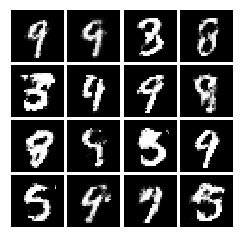

Iter: 52100; D_loss: 0.4421; G_loss: 4.486


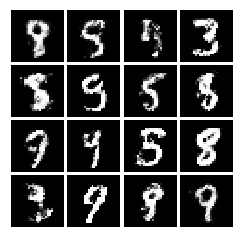

Iter: 52200; D_loss: 0.9261; G_loss: 2.23


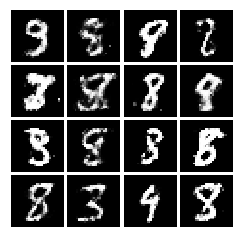

Iter: 52300; D_loss: 0.3019; G_loss: 4.026


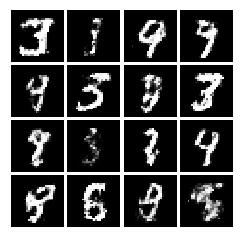

Iter: 52400; D_loss: 0.6387; G_loss: 4.587


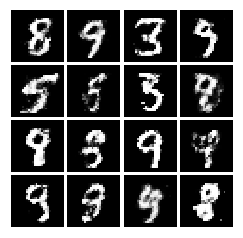

Iter: 52500; D_loss: 0.278; G_loss: 4.243


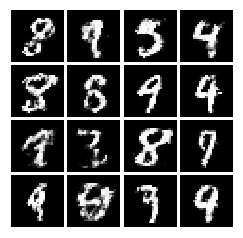

Iter: 52600; D_loss: 0.3577; G_loss: 2.763


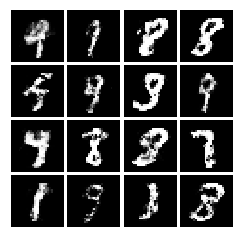

Iter: 52700; D_loss: 0.6737; G_loss: 5.352


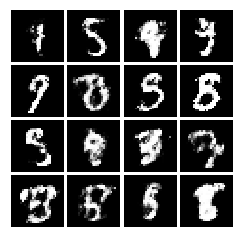

Iter: 52800; D_loss: 0.3853; G_loss: 2.96


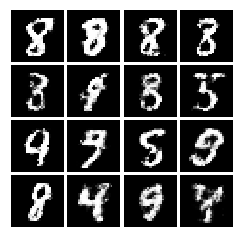

Iter: 52900; D_loss: 0.4694; G_loss: 3.941


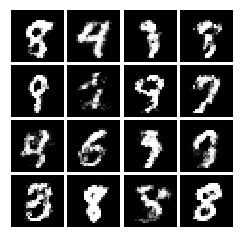

Iter: 53000; D_loss: 0.4515; G_loss: 3.912


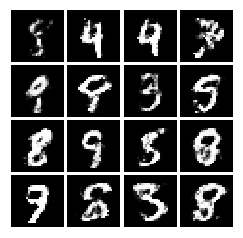

Iter: 53100; D_loss: 0.4054; G_loss: 3.576


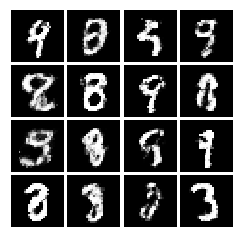

Iter: 53200; D_loss: 0.4347; G_loss: 4.361


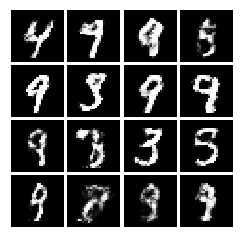

Iter: 53300; D_loss: 0.4814; G_loss: 2.605


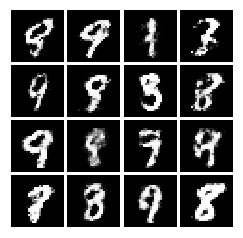

Iter: 53400; D_loss: 0.4612; G_loss: 3.432


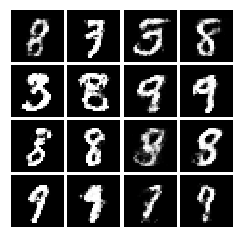

Iter: 53500; D_loss: 0.6913; G_loss: 3.18


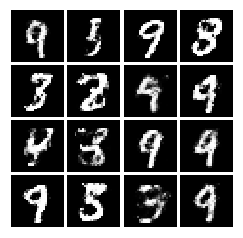

Iter: 53600; D_loss: 0.6159; G_loss: 3.725


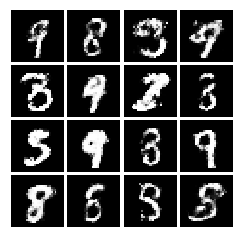

Iter: 53700; D_loss: 0.2643; G_loss: 4.008


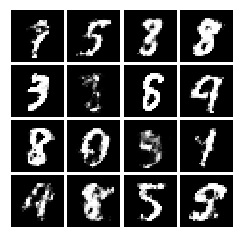

Iter: 53800; D_loss: 0.5611; G_loss: 4.551


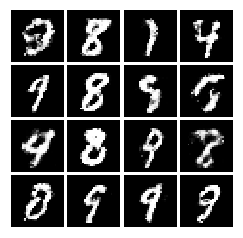

Iter: 53900; D_loss: 0.6065; G_loss: 1.956


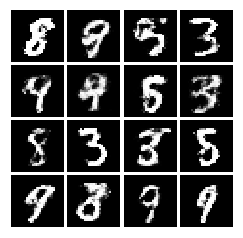

Iter: 54000; D_loss: 0.2519; G_loss: 4.221


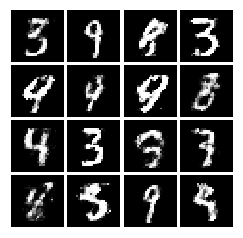

Iter: 54100; D_loss: 0.6166; G_loss: 3.237


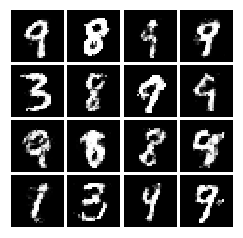

Iter: 54200; D_loss: 0.5075; G_loss: 4.181


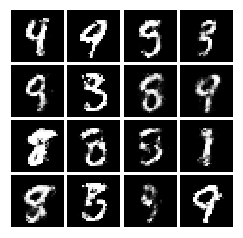

Iter: 54300; D_loss: 0.4681; G_loss: 3.121


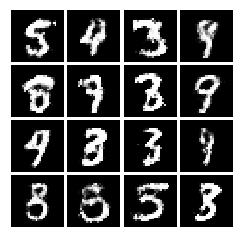

Iter: 54400; D_loss: 0.3866; G_loss: 2.761


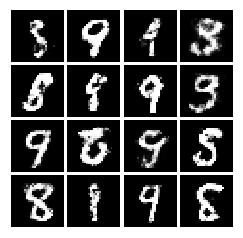

Iter: 54500; D_loss: 0.4654; G_loss: 3.432


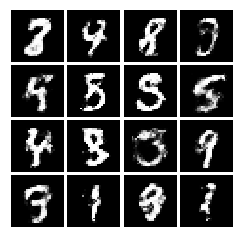

Iter: 54600; D_loss: 0.4613; G_loss: 3.857


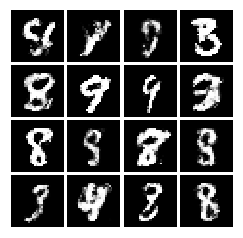

Iter: 54700; D_loss: 0.5044; G_loss: 4.72


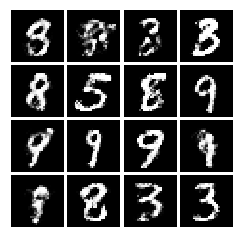

Iter: 54800; D_loss: 0.2582; G_loss: 4.074


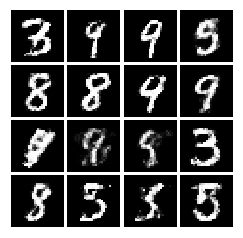

Iter: 54900; D_loss: 0.553; G_loss: 3.091


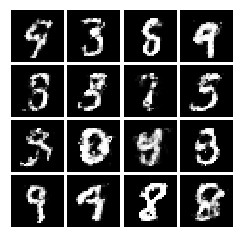

Iter: 55000; D_loss: 0.3389; G_loss: 2.851


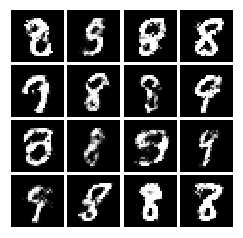

Iter: 55100; D_loss: 0.5358; G_loss: 5.118


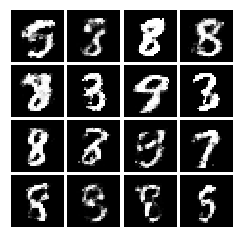

Iter: 55200; D_loss: 0.5927; G_loss: 3.387


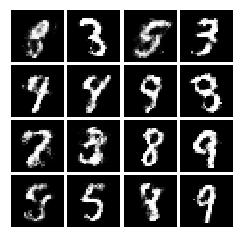

Iter: 55300; D_loss: 0.297; G_loss: 5.018


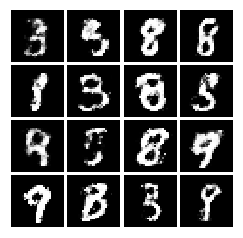

Iter: 55400; D_loss: 0.5893; G_loss: 2.588


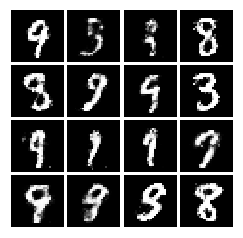

Iter: 55500; D_loss: 0.6101; G_loss: 2.904


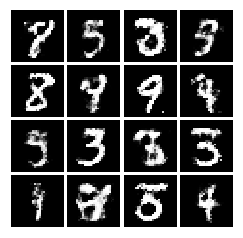

Iter: 55600; D_loss: 0.3791; G_loss: 3.247


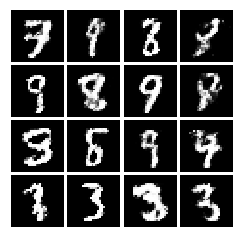

Iter: 55700; D_loss: 0.452; G_loss: 2.672


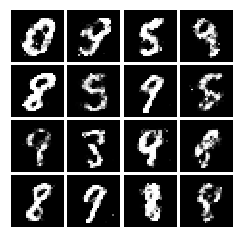

Iter: 55800; D_loss: 0.2484; G_loss: 4.553


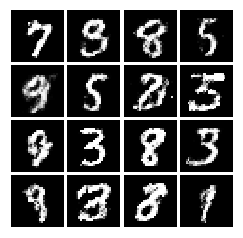

Iter: 55900; D_loss: 0.5787; G_loss: 2.425


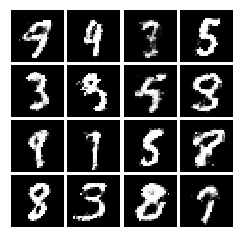

Iter: 56000; D_loss: 0.7349; G_loss: 3.451


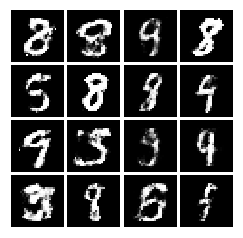

Iter: 56100; D_loss: 0.3264; G_loss: 2.78


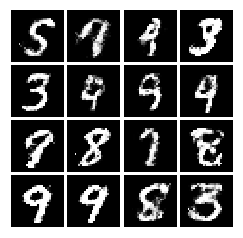

Iter: 56200; D_loss: 0.2803; G_loss: 3.407


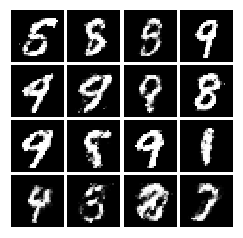

Iter: 56300; D_loss: 0.4971; G_loss: 3.472


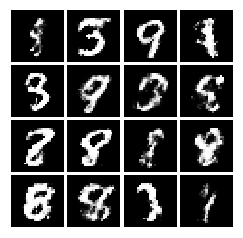

Iter: 56400; D_loss: 0.7391; G_loss: 2.71


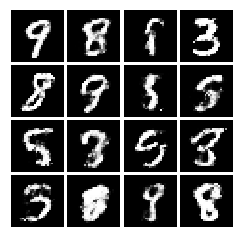

Iter: 56500; D_loss: 0.3775; G_loss: 4.207


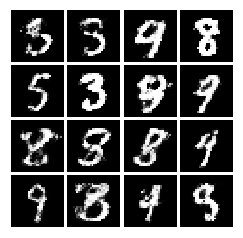

Iter: 56600; D_loss: 0.4547; G_loss: 2.903


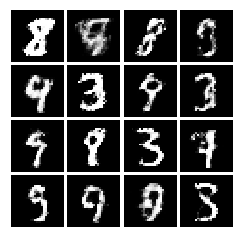

Iter: 56700; D_loss: 0.3976; G_loss: 4.15


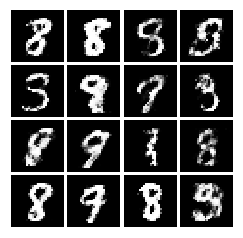

Iter: 56800; D_loss: 0.3297; G_loss: 3.138


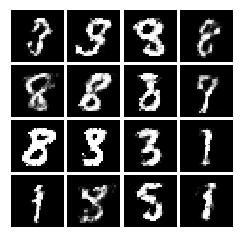

Iter: 56900; D_loss: 0.6477; G_loss: 4.777


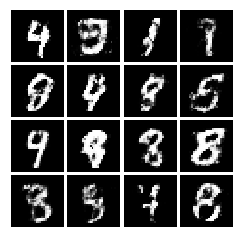

Iter: 57000; D_loss: 0.645; G_loss: 3.448


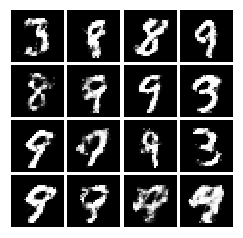

Iter: 57100; D_loss: 0.4229; G_loss: 2.582


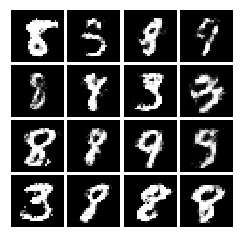

Iter: 57200; D_loss: 0.3719; G_loss: 3.152


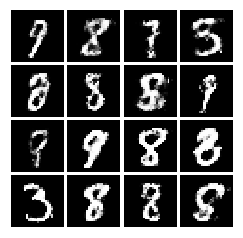

Iter: 57300; D_loss: 0.4556; G_loss: 2.884


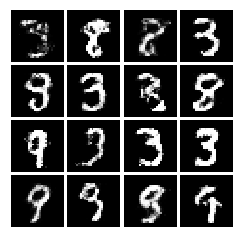

Iter: 57400; D_loss: 0.2492; G_loss: 5.839


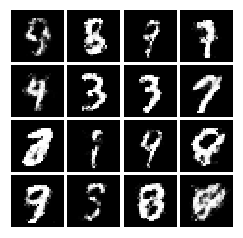

Iter: 57500; D_loss: 0.3093; G_loss: 4.441


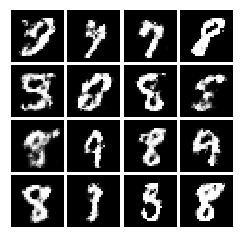

Iter: 57600; D_loss: 0.528; G_loss: 4.677


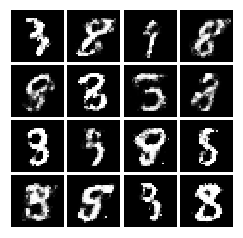

Iter: 57700; D_loss: 0.3453; G_loss: 4.391


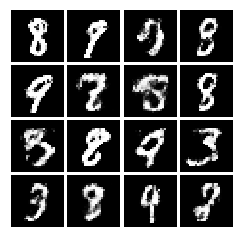

Iter: 57800; D_loss: 0.5364; G_loss: 3.463


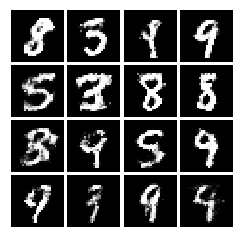

Iter: 57900; D_loss: 0.3926; G_loss: 5.526


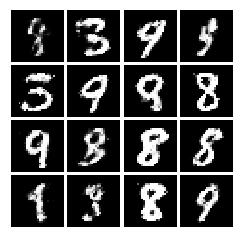

Iter: 58000; D_loss: 0.5363; G_loss: 3.61


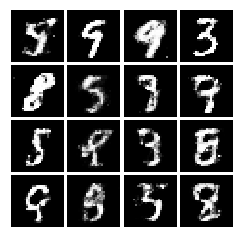

Iter: 58100; D_loss: 0.3778; G_loss: 3.348


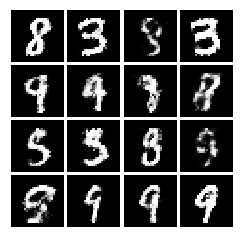

Iter: 58200; D_loss: 0.63; G_loss: 2.326


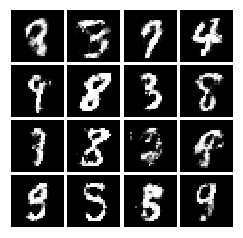

Iter: 58300; D_loss: 0.5543; G_loss: 3.205


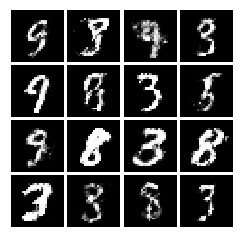

Iter: 58400; D_loss: 0.5695; G_loss: 3.833


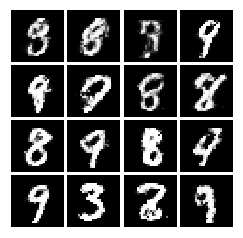

Iter: 58500; D_loss: 0.5716; G_loss: 3.036


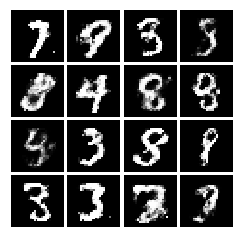

Iter: 58600; D_loss: 0.4805; G_loss: 3.924


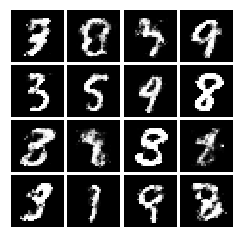

Iter: 58700; D_loss: 0.5241; G_loss: 4.25


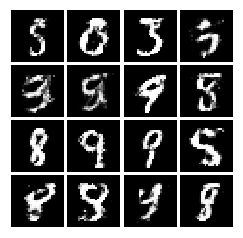

Iter: 58800; D_loss: 0.3766; G_loss: 3.274


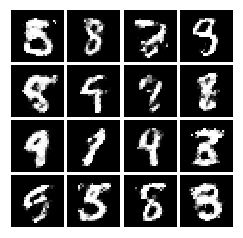

Iter: 58900; D_loss: 0.3625; G_loss: 3.089


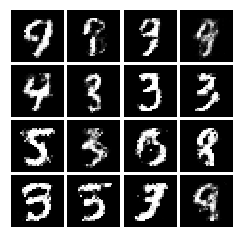

Iter: 59000; D_loss: 0.3984; G_loss: 2.33


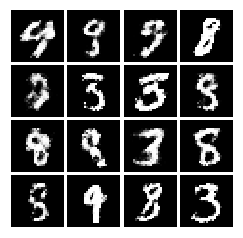

Iter: 59100; D_loss: 0.3996; G_loss: 3.113


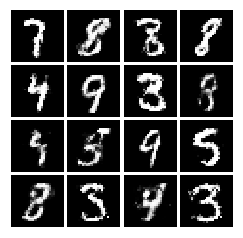

Iter: 59200; D_loss: 0.699; G_loss: 4.539


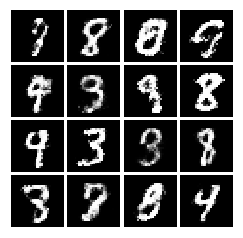

Iter: 59300; D_loss: 0.5934; G_loss: 2.076


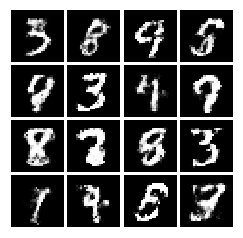

Iter: 59400; D_loss: 0.2404; G_loss: 3.009


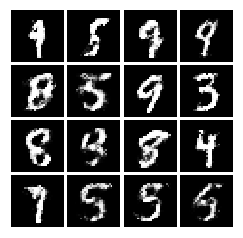

Iter: 59500; D_loss: 0.2943; G_loss: 3.815


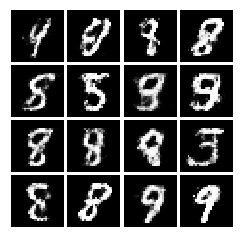

Iter: 59600; D_loss: 0.4165; G_loss: 3.263


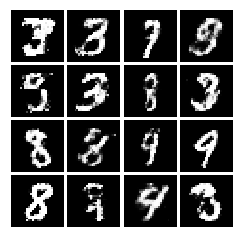

Iter: 59700; D_loss: 0.4843; G_loss: 2.779


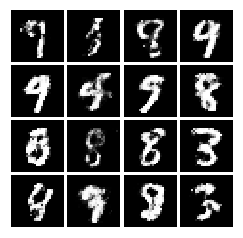

Iter: 59800; D_loss: 0.5724; G_loss: 2.805


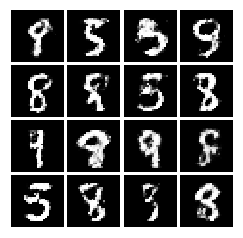

Iter: 59900; D_loss: 0.4048; G_loss: 3.566


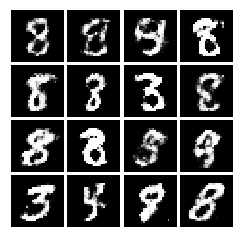

Iter: 60000; D_loss: 0.4434; G_loss: 2.936


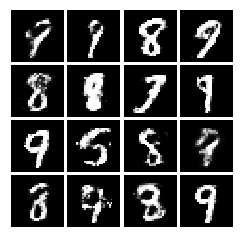

Iter: 60100; D_loss: 0.6635; G_loss: 3.719


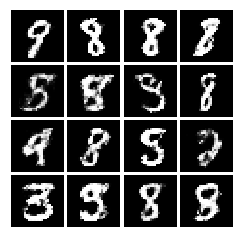

Iter: 60200; D_loss: 0.3997; G_loss: 4.658


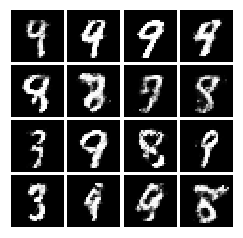

Iter: 60300; D_loss: 0.6331; G_loss: 2.908


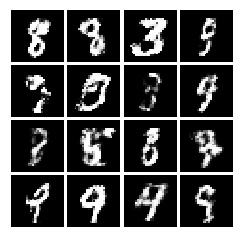

Iter: 60400; D_loss: 0.3504; G_loss: 2.926


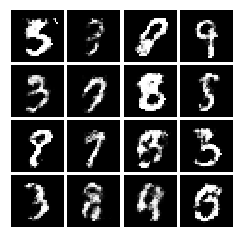

Iter: 60500; D_loss: 0.4414; G_loss: 3.377


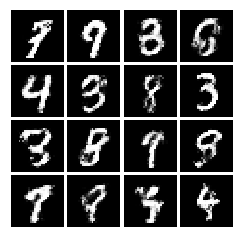

Iter: 60600; D_loss: 0.3096; G_loss: 4.552


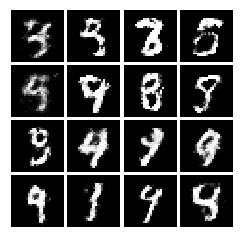

Iter: 60700; D_loss: 0.5106; G_loss: 2.697


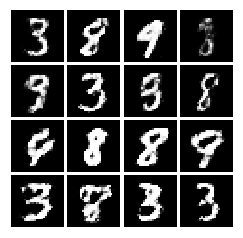

Iter: 60800; D_loss: 0.3584; G_loss: 2.619


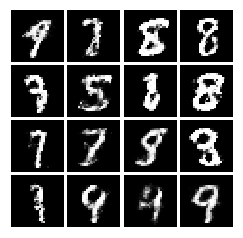

Iter: 60900; D_loss: 1.092; G_loss: 3.187


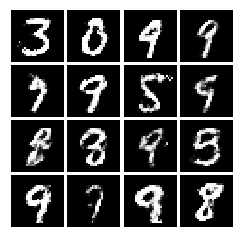

Iter: 61000; D_loss: 0.3209; G_loss: 3.146


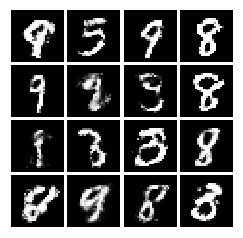

Iter: 61100; D_loss: 0.4884; G_loss: 3.416


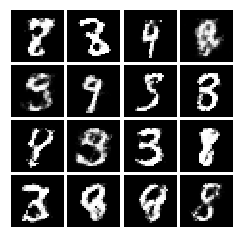

Iter: 61200; D_loss: 0.4903; G_loss: 3.143


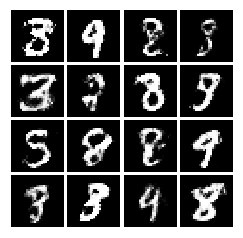

Iter: 61300; D_loss: 0.564; G_loss: 2.351


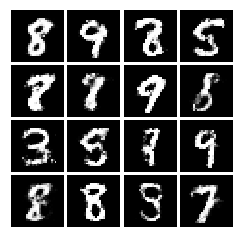

Iter: 61400; D_loss: 0.2204; G_loss: 4.038


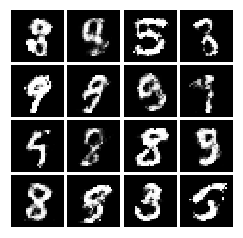

Iter: 61500; D_loss: 0.4852; G_loss: 3.692


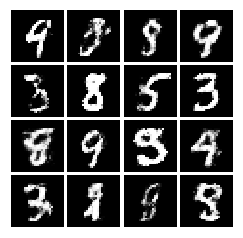

Iter: 61600; D_loss: 0.6293; G_loss: 3.449


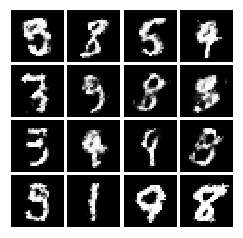

Iter: 61700; D_loss: 0.5953; G_loss: 2.672


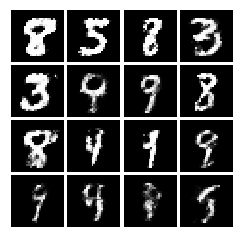

Iter: 61800; D_loss: 0.4045; G_loss: 3.518


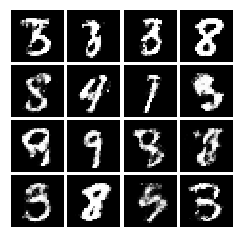

Iter: 61900; D_loss: 0.4566; G_loss: 3.566


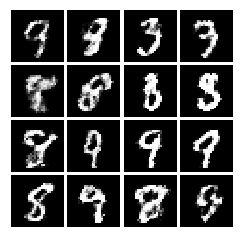

Iter: 62000; D_loss: 0.5119; G_loss: 2.953


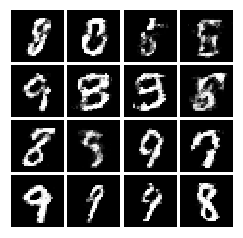

Iter: 62100; D_loss: 0.3985; G_loss: 3.927


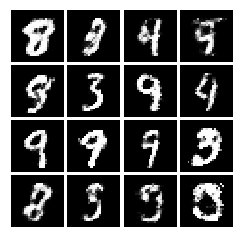

Iter: 62200; D_loss: 0.3312; G_loss: 3.144


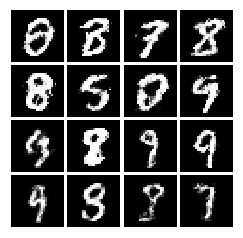

Iter: 62300; D_loss: 0.3455; G_loss: 3.505


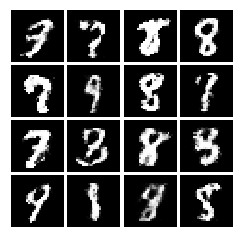

Iter: 62400; D_loss: 0.4534; G_loss: 2.629


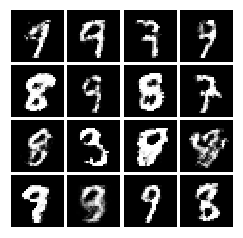

Iter: 62500; D_loss: 0.3886; G_loss: 3.142


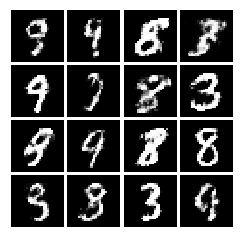

Iter: 62600; D_loss: 0.5458; G_loss: 1.995


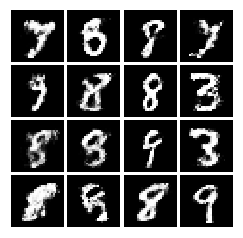

Iter: 62700; D_loss: 0.6065; G_loss: 2.626


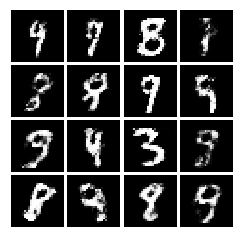

Iter: 62800; D_loss: 0.56; G_loss: 2.766


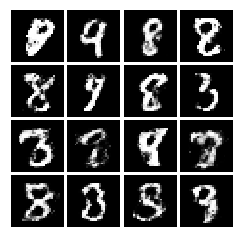

Iter: 62900; D_loss: 0.2821; G_loss: 3.284


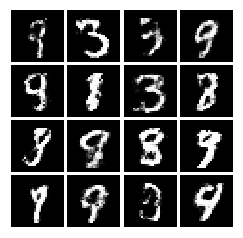

Iter: 63000; D_loss: 0.6217; G_loss: 3.028


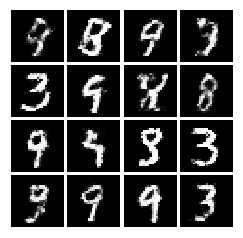

Iter: 63100; D_loss: 0.1848; G_loss: 3.234


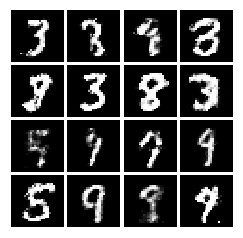

Iter: 63200; D_loss: 0.4096; G_loss: 3.349


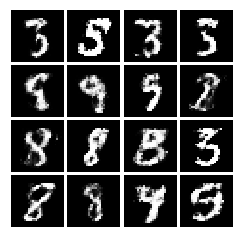

Iter: 63300; D_loss: 0.4562; G_loss: 3.739


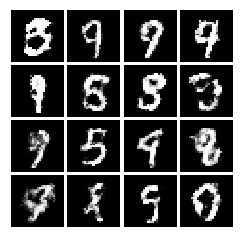

Iter: 63400; D_loss: 0.4443; G_loss: 3.389


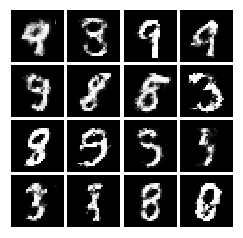

Iter: 63500; D_loss: 0.6064; G_loss: 3.848


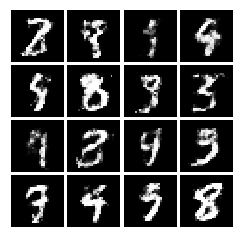

Iter: 63600; D_loss: 0.2857; G_loss: 3.33


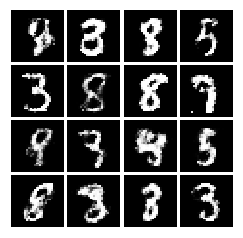

Iter: 63700; D_loss: 0.4498; G_loss: 2.877


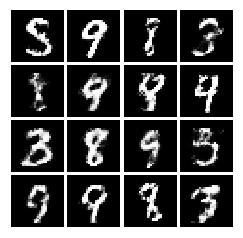

Iter: 63800; D_loss: 0.5814; G_loss: 3.801


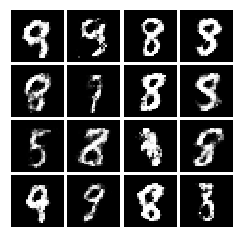

Iter: 63900; D_loss: 0.6443; G_loss: 4.125


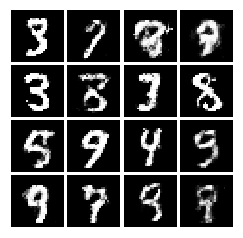

Iter: 64000; D_loss: 0.3244; G_loss: 5.171


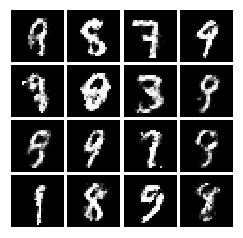

Iter: 64100; D_loss: 0.3808; G_loss: 3.358


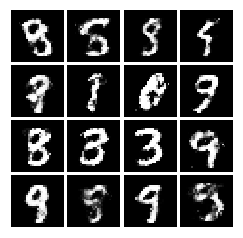

Iter: 64200; D_loss: 0.6236; G_loss: 3.108


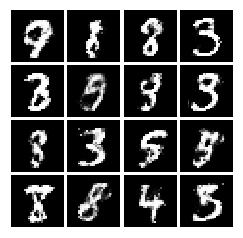

Iter: 64300; D_loss: 0.3349; G_loss: 3.437


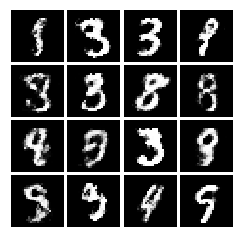

Iter: 64400; D_loss: 0.3588; G_loss: 3.232


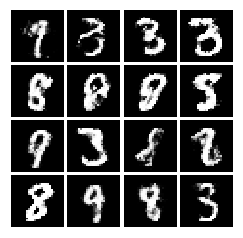

Iter: 64500; D_loss: 0.5522; G_loss: 2.449


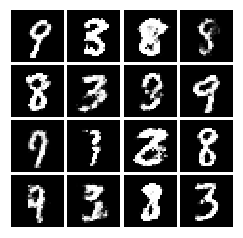

Iter: 64600; D_loss: 0.4065; G_loss: 4.118


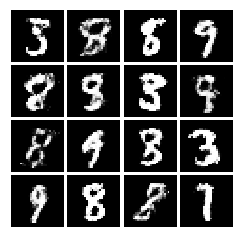

Iter: 64700; D_loss: 0.2962; G_loss: 4.116


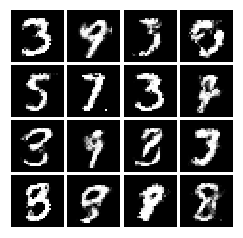

Iter: 64800; D_loss: 0.2155; G_loss: 5.397


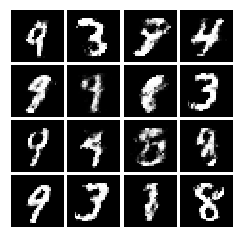

Iter: 64900; D_loss: 0.4803; G_loss: 3.797


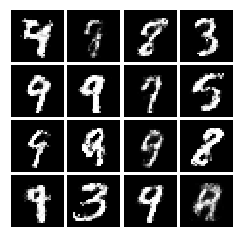

Iter: 65000; D_loss: 0.5683; G_loss: 2.826


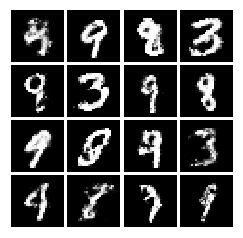

Iter: 65100; D_loss: 0.4633; G_loss: 2.983


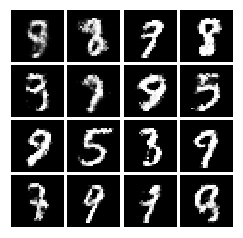

Iter: 65200; D_loss: 0.4216; G_loss: 3.28


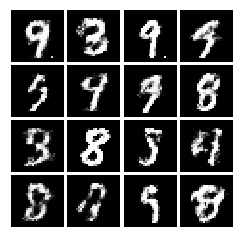

Iter: 65300; D_loss: 0.404; G_loss: 2.538


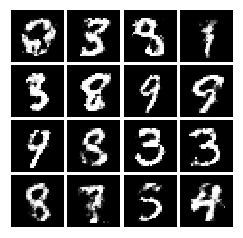

Iter: 65400; D_loss: 0.5484; G_loss: 2.817


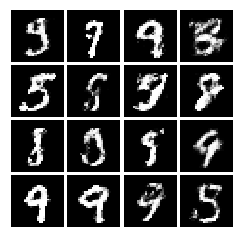

Iter: 65500; D_loss: 0.4558; G_loss: 4.305


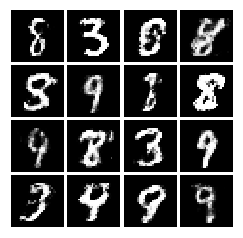

Iter: 65600; D_loss: 0.4707; G_loss: 2.613


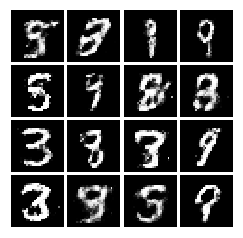

Iter: 65700; D_loss: 0.3761; G_loss: 5.187


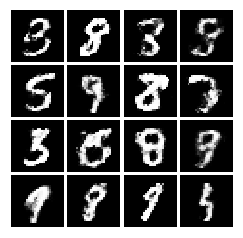

Iter: 65800; D_loss: 0.3509; G_loss: 3.967


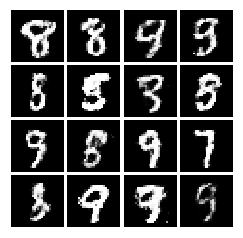

Iter: 65900; D_loss: 0.5025; G_loss: 3.323


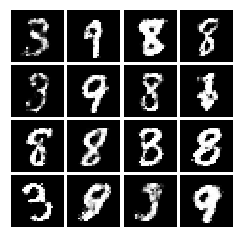

Iter: 66000; D_loss: 0.4668; G_loss: 4.307


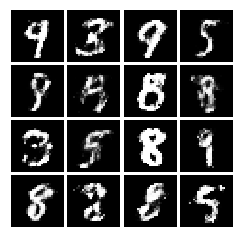

Iter: 66100; D_loss: 0.3093; G_loss: 2.085


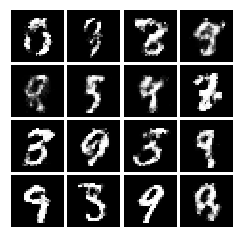

Iter: 66200; D_loss: 0.5032; G_loss: 3.611


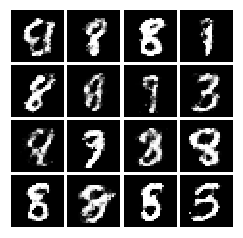

Iter: 66300; D_loss: 0.4483; G_loss: 3.664


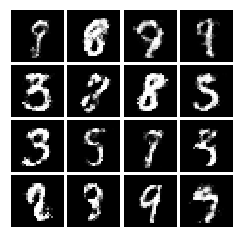

Iter: 66400; D_loss: 0.5597; G_loss: 3.248


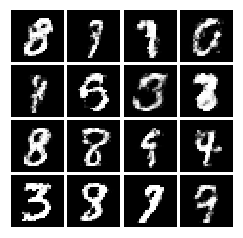

Iter: 66500; D_loss: 0.3852; G_loss: 3.264


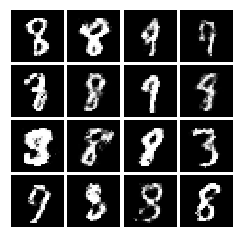

Iter: 66600; D_loss: 0.4423; G_loss: 3.51


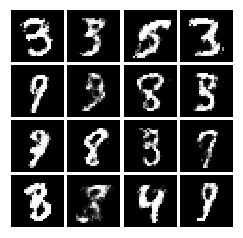

Iter: 66700; D_loss: 0.3087; G_loss: 3.006


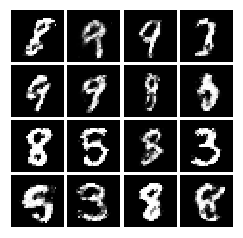

Iter: 66800; D_loss: 0.4206; G_loss: 4.358


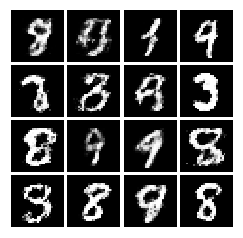

Iter: 66900; D_loss: 0.5435; G_loss: 3.356


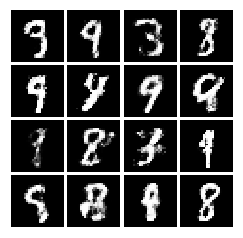

Iter: 67000; D_loss: 0.7592; G_loss: 3.134


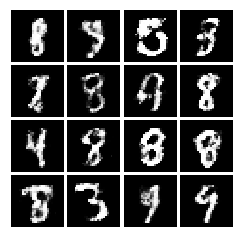

Iter: 67100; D_loss: 0.3786; G_loss: 3.208


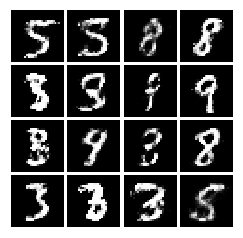

Iter: 67200; D_loss: 0.5298; G_loss: 3.151


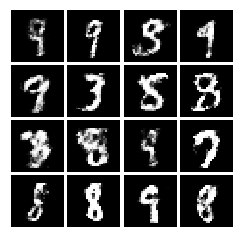

Iter: 67300; D_loss: 0.9528; G_loss: 4.704


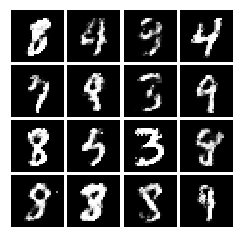

Iter: 67400; D_loss: 0.5575; G_loss: 2.758


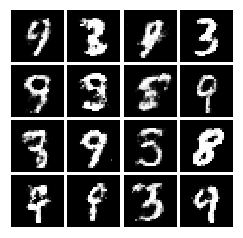

Iter: 67500; D_loss: 0.4478; G_loss: 2.585


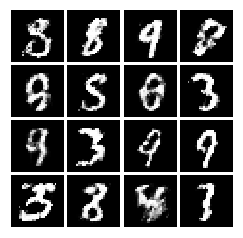

Iter: 67600; D_loss: 0.5663; G_loss: 2.849


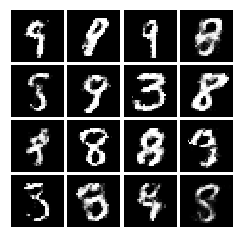

Iter: 67700; D_loss: 0.4205; G_loss: 4.099


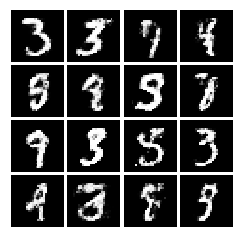

Iter: 67800; D_loss: 0.4956; G_loss: 3.943


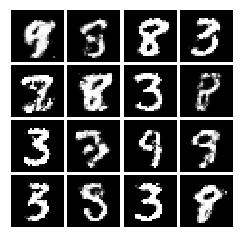

Iter: 67900; D_loss: 0.3696; G_loss: 4.96


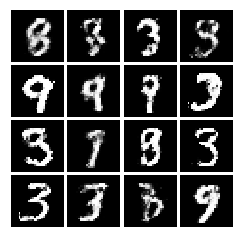

Iter: 68000; D_loss: 0.6584; G_loss: 3.673


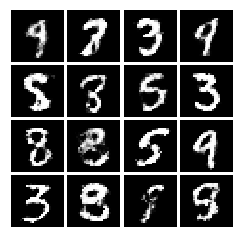

Iter: 68100; D_loss: 0.3941; G_loss: 3.42


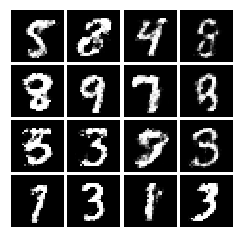

Iter: 68200; D_loss: 0.5987; G_loss: 4.305


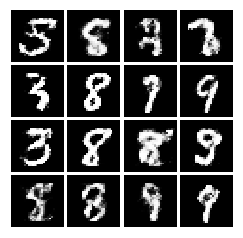

Iter: 68300; D_loss: 0.4986; G_loss: 3.915


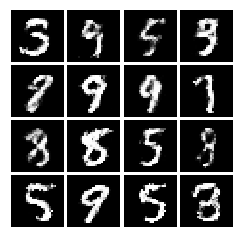

Iter: 68400; D_loss: 0.3216; G_loss: 2.632


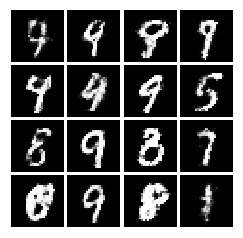

Iter: 68500; D_loss: 0.3386; G_loss: 4.14


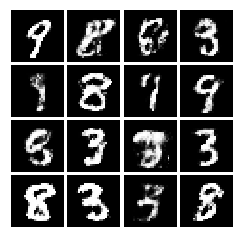

Iter: 68600; D_loss: 0.6677; G_loss: 3.083


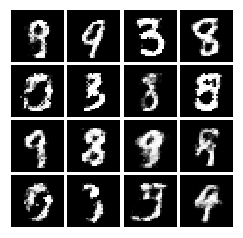

Iter: 68700; D_loss: 0.5127; G_loss: 5.1


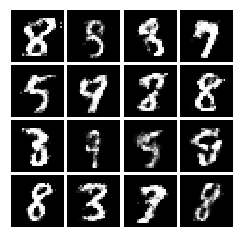

Iter: 68800; D_loss: 0.4755; G_loss: 2.993


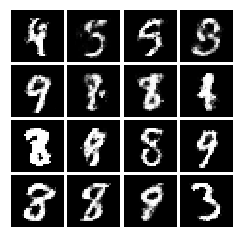

Iter: 68900; D_loss: 0.6038; G_loss: 3.735


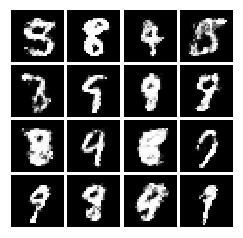

Iter: 69000; D_loss: 0.4715; G_loss: 3.25


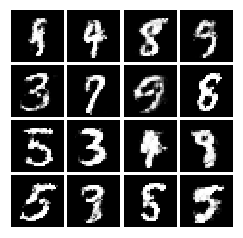

Iter: 69100; D_loss: 0.4763; G_loss: 2.751


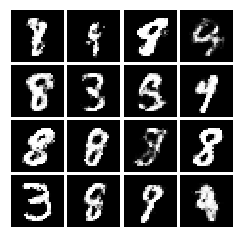

Iter: 69200; D_loss: 0.5803; G_loss: 2.785


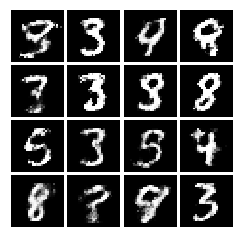

Iter: 69300; D_loss: 0.5125; G_loss: 3.114


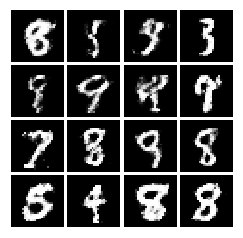

Iter: 69400; D_loss: 0.5959; G_loss: 3.228


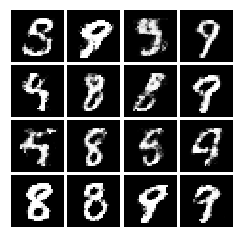

Iter: 69500; D_loss: 0.4583; G_loss: 2.784


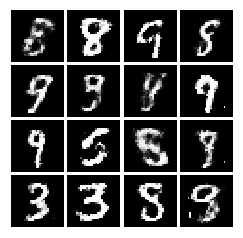

Iter: 69600; D_loss: 0.4877; G_loss: 5.111


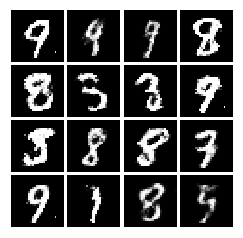

Iter: 69700; D_loss: 0.8356; G_loss: 3.674


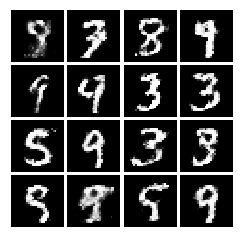

Iter: 69800; D_loss: 0.2865; G_loss: 2.851


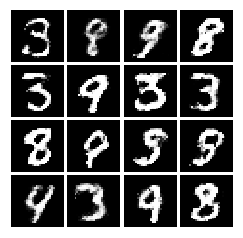

Iter: 69900; D_loss: 0.4701; G_loss: 3.845


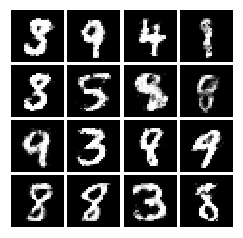

Iter: 70000; D_loss: 0.5703; G_loss: 2.248


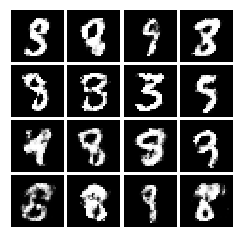

Iter: 70100; D_loss: 0.3722; G_loss: 4.241


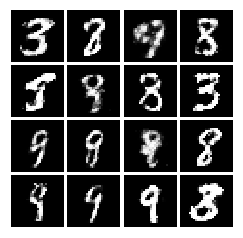

Iter: 70200; D_loss: 0.3581; G_loss: 4.659


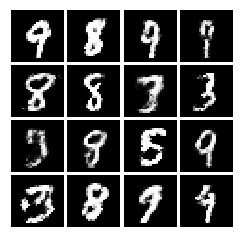

Iter: 70300; D_loss: 0.2546; G_loss: 3.769


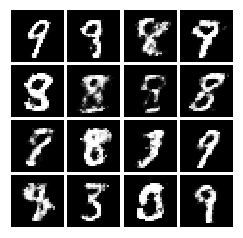

Iter: 70400; D_loss: 0.4065; G_loss: 4.167


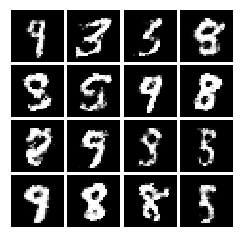

Iter: 70500; D_loss: 0.3807; G_loss: 3.657


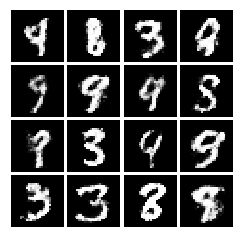

Iter: 70600; D_loss: 0.4394; G_loss: 5.428


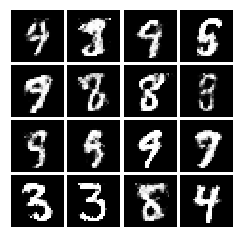

Iter: 70700; D_loss: 0.4189; G_loss: 2.805


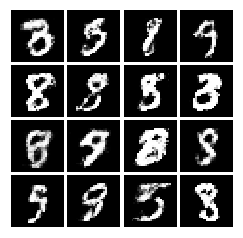

Iter: 70800; D_loss: 0.3355; G_loss: 2.565


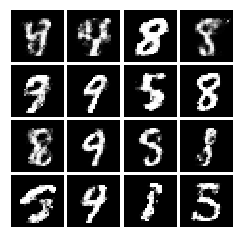

Iter: 70900; D_loss: 0.6291; G_loss: 2.923


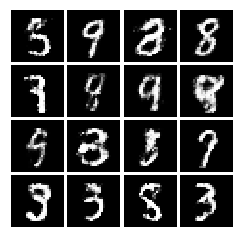

Iter: 71000; D_loss: 0.4533; G_loss: 5.003


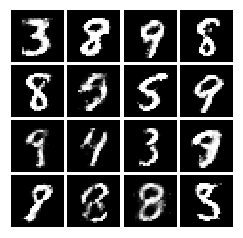

Iter: 71100; D_loss: 0.2805; G_loss: 2.182


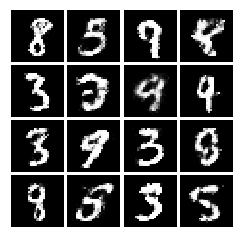

Iter: 71200; D_loss: 0.275; G_loss: 5.027


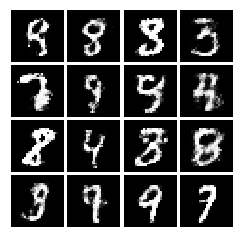

Iter: 71300; D_loss: 0.2267; G_loss: 2.756


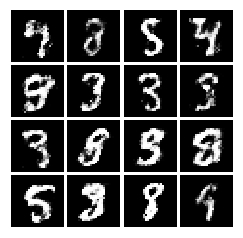

Iter: 71400; D_loss: 0.734; G_loss: 4.849


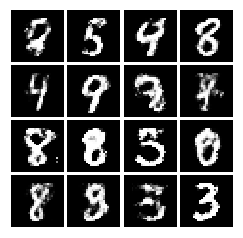

Iter: 71500; D_loss: 0.8597; G_loss: 3.101


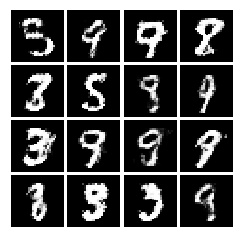

Iter: 71600; D_loss: 0.4235; G_loss: 3.421


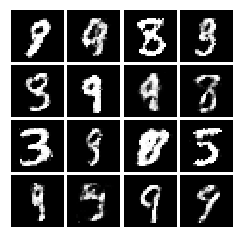

Iter: 71700; D_loss: 0.7574; G_loss: 5.643


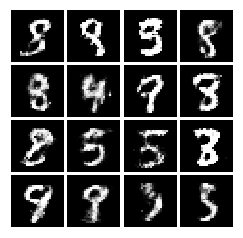

Iter: 71800; D_loss: 0.3614; G_loss: 3.178


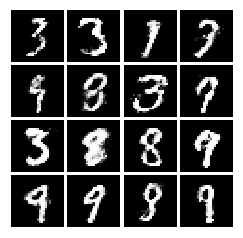

Iter: 71900; D_loss: 0.593; G_loss: 2.615


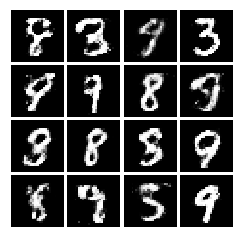

Iter: 72000; D_loss: 0.6906; G_loss: 4.658


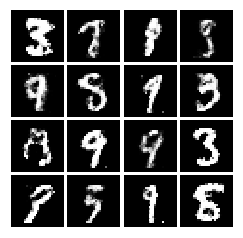

Iter: 72100; D_loss: 0.585; G_loss: 4.327


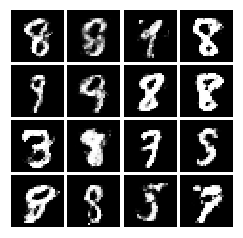

Iter: 72200; D_loss: 0.4282; G_loss: 3.167


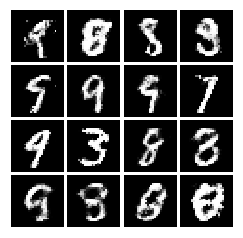

Iter: 72300; D_loss: 0.5112; G_loss: 2.933


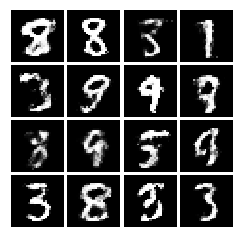

Iter: 72400; D_loss: 0.7946; G_loss: 3.332


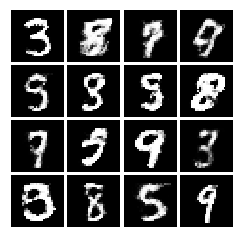

Iter: 72500; D_loss: 0.518; G_loss: 3.548


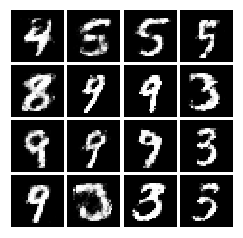

Iter: 72600; D_loss: 0.5976; G_loss: 3.274


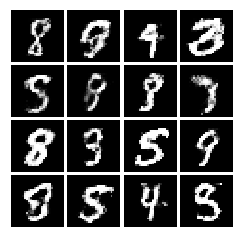

Iter: 72700; D_loss: 0.4055; G_loss: 2.746


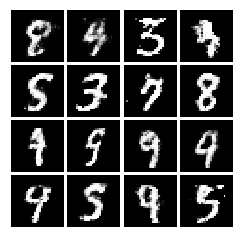

Iter: 72800; D_loss: 0.3521; G_loss: 4.224


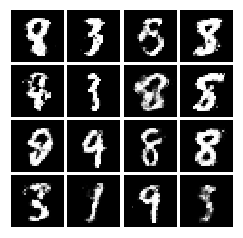

Iter: 72900; D_loss: 0.3917; G_loss: 3.127


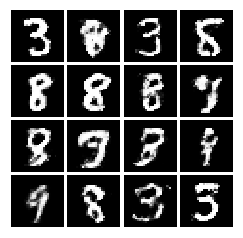

Iter: 73000; D_loss: 0.7184; G_loss: 3.986


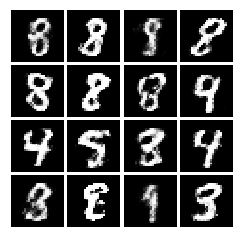

Iter: 73100; D_loss: 0.5386; G_loss: 3.264


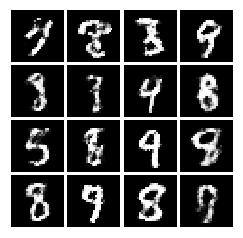

Iter: 73200; D_loss: 0.4925; G_loss: 4.335


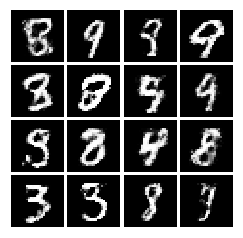

Iter: 73300; D_loss: 0.5514; G_loss: 3.709


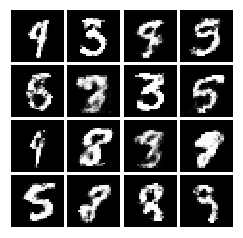

Iter: 73400; D_loss: 0.6021; G_loss: 1.93


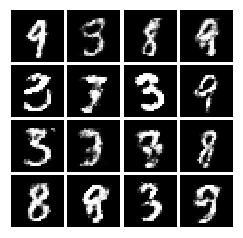

Iter: 73500; D_loss: 0.518; G_loss: 3.565


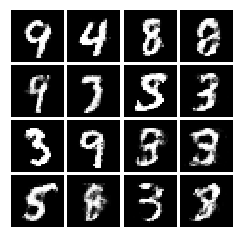

Iter: 73600; D_loss: 0.5253; G_loss: 2.596


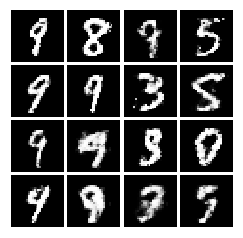

Iter: 73700; D_loss: 0.4063; G_loss: 2.868


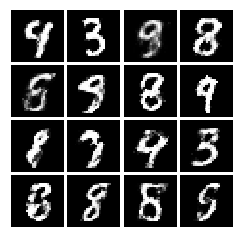

Iter: 73800; D_loss: 0.3062; G_loss: 2.3


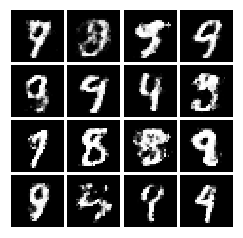

Iter: 73900; D_loss: 0.3401; G_loss: 3.683


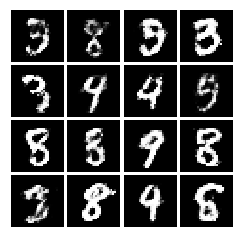

Iter: 74000; D_loss: 0.4646; G_loss: 2.678


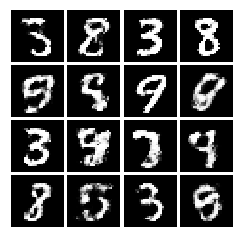

Iter: 74100; D_loss: 0.4701; G_loss: 2.973


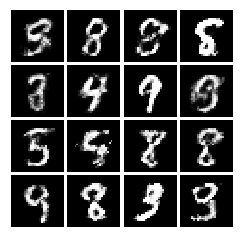

Iter: 74200; D_loss: 0.5381; G_loss: 4.835


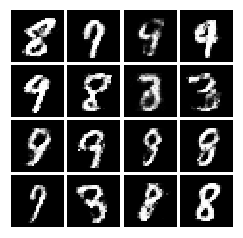

Iter: 74300; D_loss: 0.3919; G_loss: 3.956


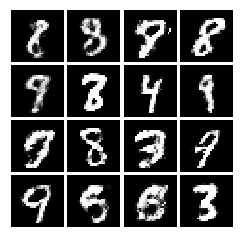

Iter: 74400; D_loss: 0.6006; G_loss: 1.968


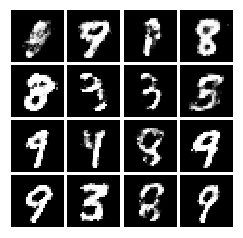

Iter: 74500; D_loss: 0.4863; G_loss: 4.207


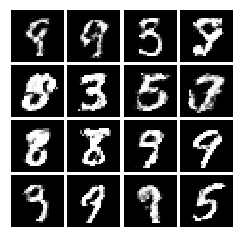

Iter: 74600; D_loss: 0.401; G_loss: 2.917


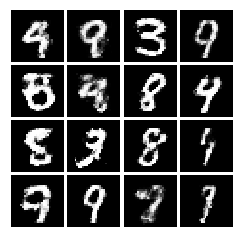

Iter: 74700; D_loss: 0.4302; G_loss: 2.293


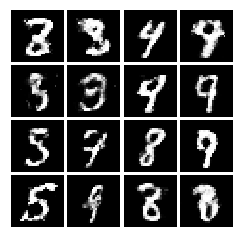

Iter: 74800; D_loss: 0.5163; G_loss: 3.309


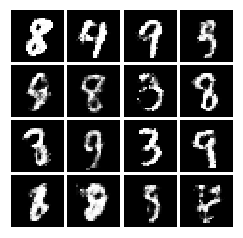

Iter: 74900; D_loss: 0.6652; G_loss: 5.531


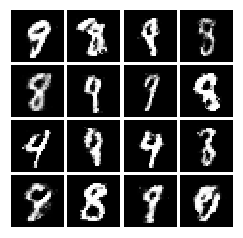

Iter: 75000; D_loss: 0.6105; G_loss: 3.305


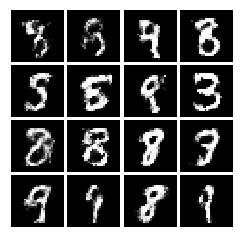

Iter: 75100; D_loss: 0.4671; G_loss: 3.48


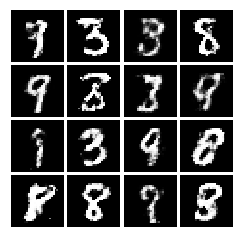

Iter: 75200; D_loss: 0.4696; G_loss: 3.552


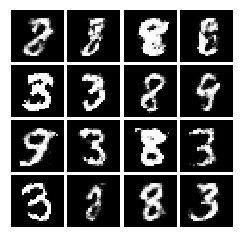

Iter: 75300; D_loss: 0.2419; G_loss: 3.295


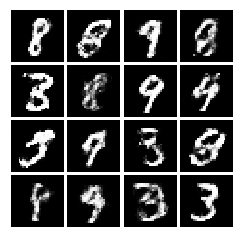

Iter: 75400; D_loss: 0.5021; G_loss: 3.25


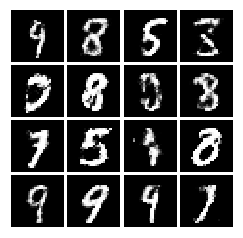

Iter: 75500; D_loss: 0.9059; G_loss: 3.869


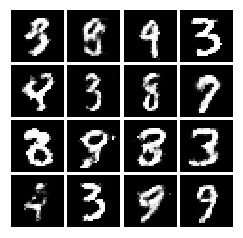

Iter: 75600; D_loss: 0.4098; G_loss: 2.933


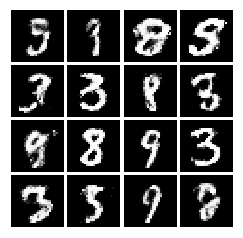

Iter: 75700; D_loss: 0.4787; G_loss: 3.043


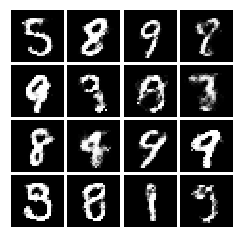

Iter: 75800; D_loss: 0.5884; G_loss: 3.51


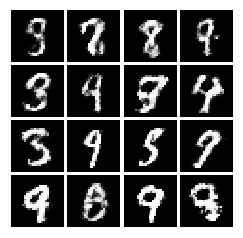

Iter: 75900; D_loss: 0.4193; G_loss: 3.608


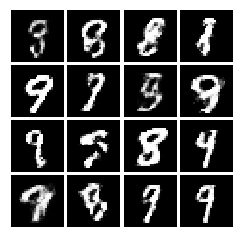

Iter: 76000; D_loss: 0.4544; G_loss: 3.629


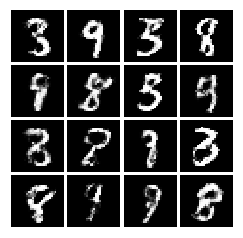

Iter: 76100; D_loss: 0.4164; G_loss: 3.895


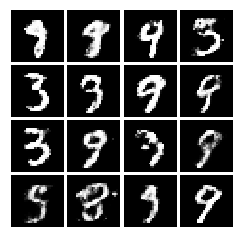

Iter: 76200; D_loss: 0.6256; G_loss: 3.052


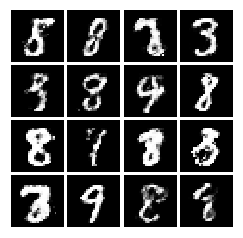

Iter: 76300; D_loss: 0.4917; G_loss: 2.874


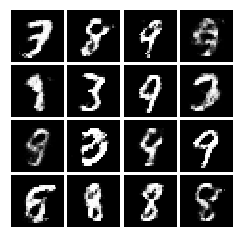

Iter: 76400; D_loss: 0.5572; G_loss: 2.498


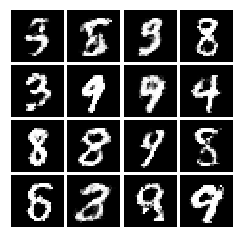

Iter: 76500; D_loss: 0.3114; G_loss: 3.901


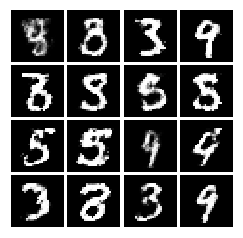

Iter: 76600; D_loss: 0.4664; G_loss: 4.403


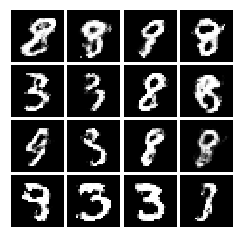

Iter: 76700; D_loss: 0.2073; G_loss: 4.773


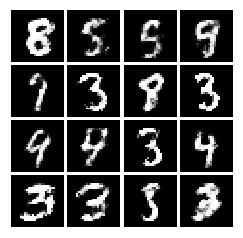

Iter: 76800; D_loss: 0.5349; G_loss: 3.07


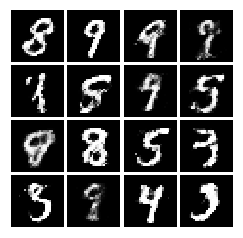

Iter: 76900; D_loss: 0.3777; G_loss: 4.834


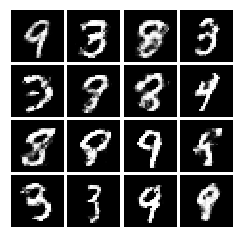

Iter: 77000; D_loss: 0.355; G_loss: 3.767


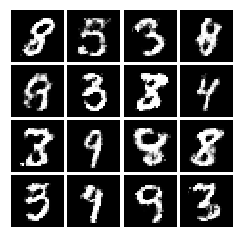

Iter: 77100; D_loss: 0.57; G_loss: 4.382


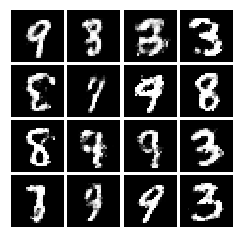

Iter: 77200; D_loss: 0.243; G_loss: 3.434


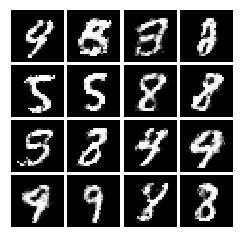

Iter: 77300; D_loss: 0.3603; G_loss: 3.755


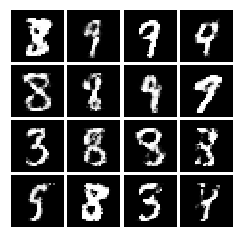

Iter: 77400; D_loss: 0.3104; G_loss: 3.597


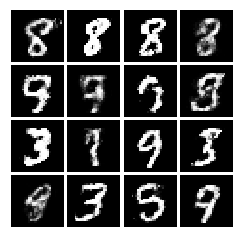

Iter: 77500; D_loss: 0.4089; G_loss: 3.399


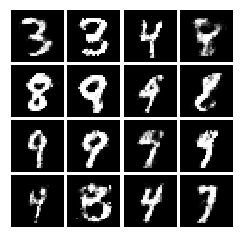

Iter: 77600; D_loss: 0.5563; G_loss: 2.921


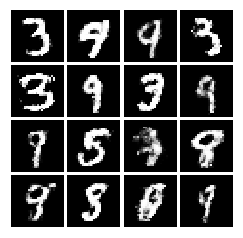

Iter: 77700; D_loss: 0.6899; G_loss: 3.069


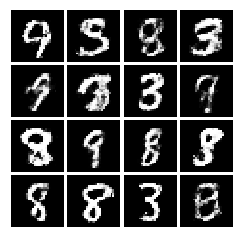

Iter: 77800; D_loss: 0.4169; G_loss: 2.496


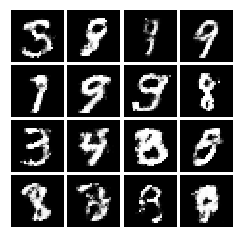

Iter: 77900; D_loss: 0.895; G_loss: 2.299


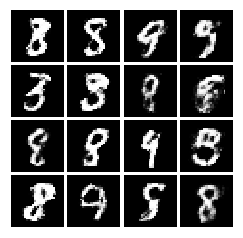

Iter: 78000; D_loss: 0.427; G_loss: 4.328


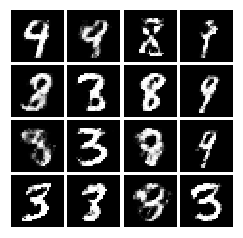

Iter: 78100; D_loss: 0.5832; G_loss: 2.796


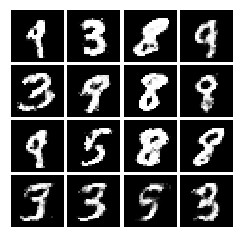

Iter: 78200; D_loss: 0.4664; G_loss: 3.53


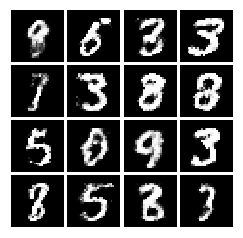

Iter: 78300; D_loss: 0.375; G_loss: 3.516


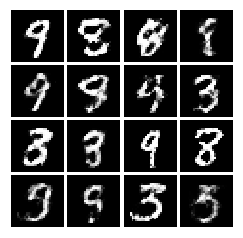

Iter: 78400; D_loss: 0.3569; G_loss: 2.95


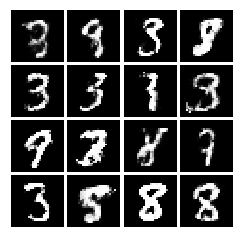

Iter: 78500; D_loss: 0.6486; G_loss: 3.383


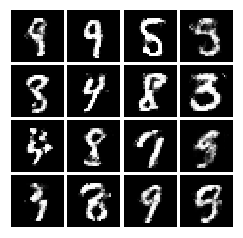

Iter: 78600; D_loss: 0.6284; G_loss: 5.622


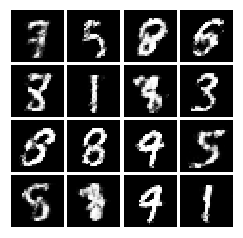

Iter: 78700; D_loss: 0.4276; G_loss: 3.838


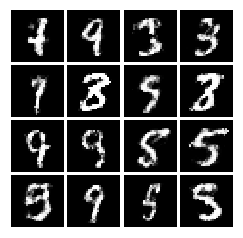

Iter: 78800; D_loss: 0.3099; G_loss: 3.605


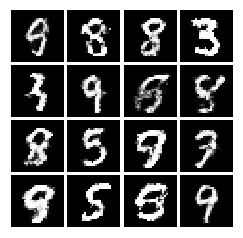

Iter: 78900; D_loss: 0.4176; G_loss: 2.098


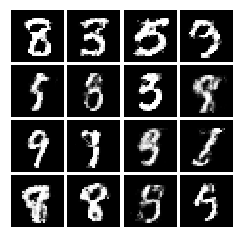

Iter: 79000; D_loss: 0.3623; G_loss: 2.593


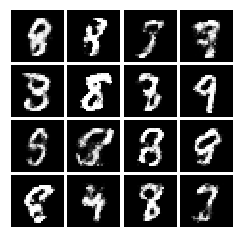

Iter: 79100; D_loss: 0.4839; G_loss: 2.378


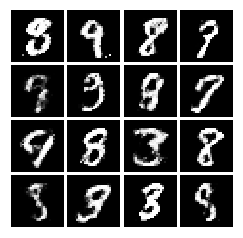

Iter: 79200; D_loss: 0.3243; G_loss: 3.108


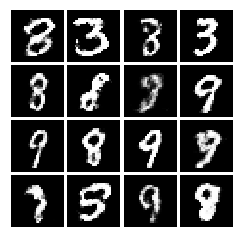

Iter: 79300; D_loss: 0.4868; G_loss: 3.721


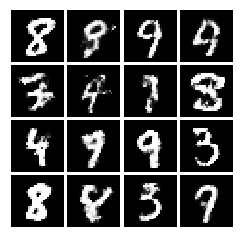

Iter: 79400; D_loss: 0.6573; G_loss: 4.071


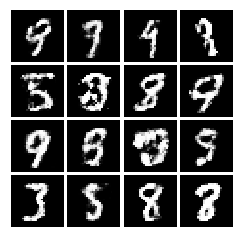

Iter: 79500; D_loss: 0.3232; G_loss: 3.331


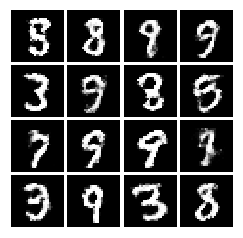

Iter: 79600; D_loss: 0.5875; G_loss: 3.008


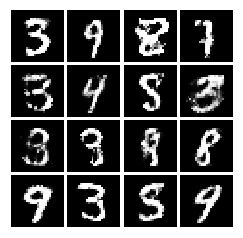

Iter: 79700; D_loss: 0.7478; G_loss: 3.19


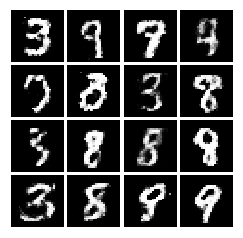

Iter: 79800; D_loss: 0.4671; G_loss: 2.906


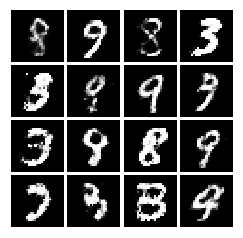

Iter: 79900; D_loss: 0.6161; G_loss: 2.827


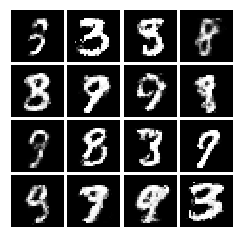

Iter: 80000; D_loss: 0.3969; G_loss: 2.978


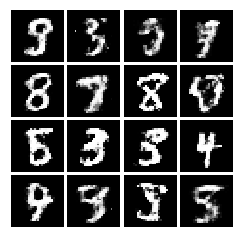

Iter: 80100; D_loss: 0.9686; G_loss: 3.363


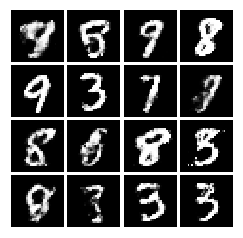

Iter: 80200; D_loss: 0.4854; G_loss: 3.114


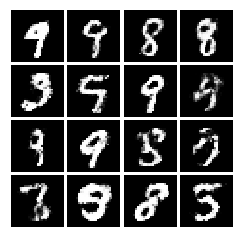

Iter: 80300; D_loss: 0.6041; G_loss: 3.045


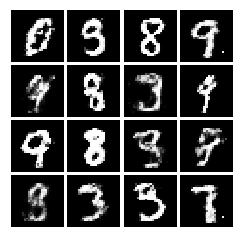

Iter: 80400; D_loss: 0.6765; G_loss: 2.969


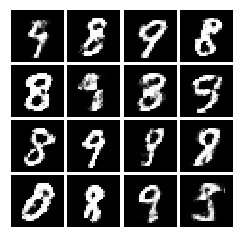

Iter: 80500; D_loss: 0.3182; G_loss: 3.975


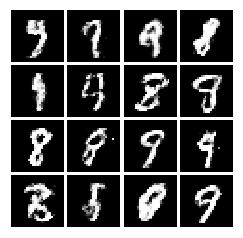

Iter: 80600; D_loss: 0.3722; G_loss: 3.672


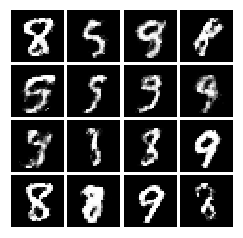

Iter: 80700; D_loss: 0.793; G_loss: 4.296


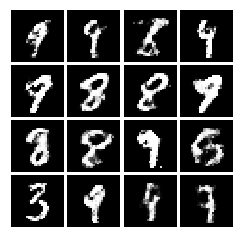

Iter: 80800; D_loss: 0.6092; G_loss: 4.21


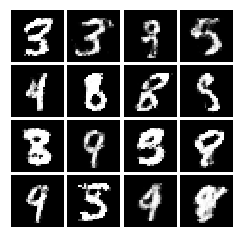

Iter: 80900; D_loss: 0.2578; G_loss: 4.289


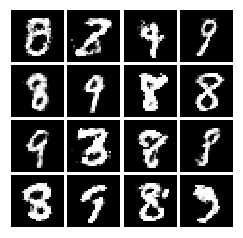

Iter: 81000; D_loss: 0.5514; G_loss: 3.032


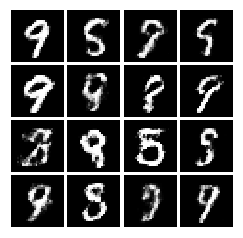

Iter: 81100; D_loss: 0.6452; G_loss: 4.919


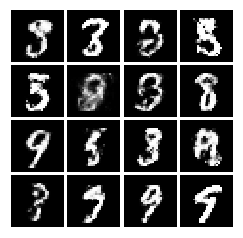

Iter: 81200; D_loss: 0.5779; G_loss: 3.097


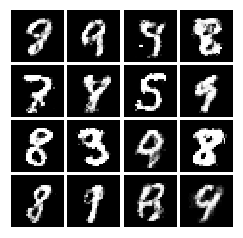

Iter: 81300; D_loss: 0.4709; G_loss: 3.5


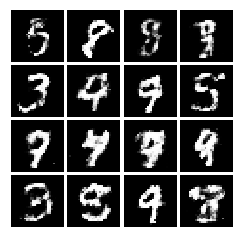

Iter: 81400; D_loss: 0.4485; G_loss: 2.478


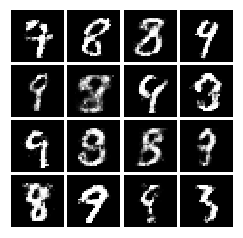

Iter: 81500; D_loss: 0.6034; G_loss: 4.455


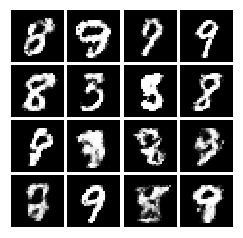

Iter: 81600; D_loss: 0.3458; G_loss: 3.444


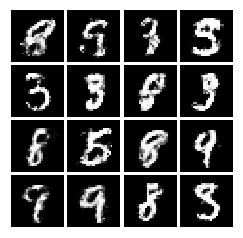

Iter: 81700; D_loss: 0.6897; G_loss: 3.675


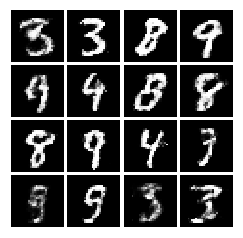

Iter: 81800; D_loss: 0.5321; G_loss: 2.504


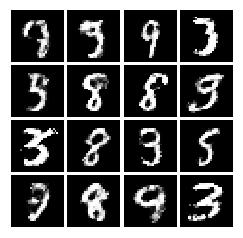

Iter: 81900; D_loss: 0.4472; G_loss: 2.933


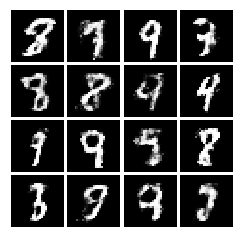

Iter: 82000; D_loss: 0.43; G_loss: 3.75


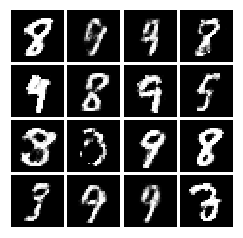

Iter: 82100; D_loss: 0.4858; G_loss: 2.066


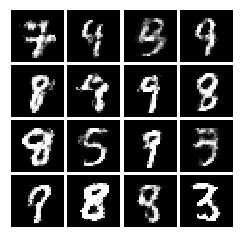

Iter: 82200; D_loss: 0.5167; G_loss: 3.835


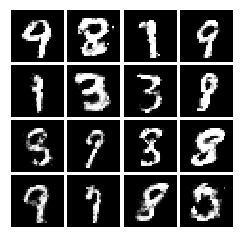

Iter: 82300; D_loss: 0.4331; G_loss: 3.507


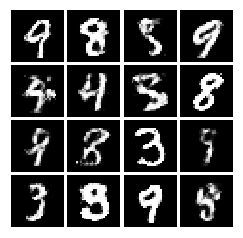

Iter: 82400; D_loss: 0.4702; G_loss: 4.265


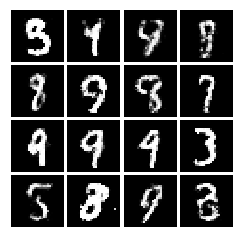

Iter: 82500; D_loss: 0.4918; G_loss: 3.209


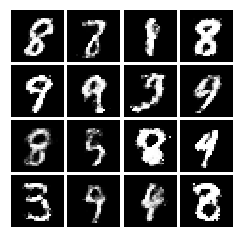

Iter: 82600; D_loss: 0.5466; G_loss: 3.083


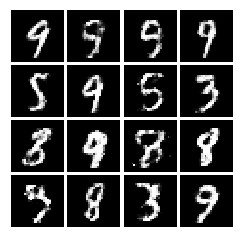

Iter: 82700; D_loss: 0.4481; G_loss: 5.489


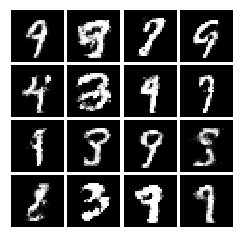

Iter: 82800; D_loss: 0.4321; G_loss: 3.509


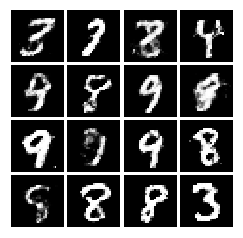

Iter: 82900; D_loss: 0.4294; G_loss: 3.127


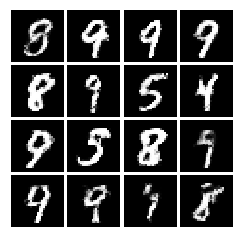

Iter: 83000; D_loss: 0.5713; G_loss: 3.789


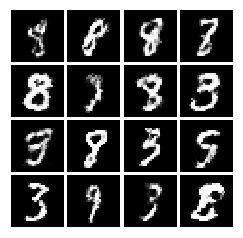

Iter: 83100; D_loss: 0.4941; G_loss: 2.733


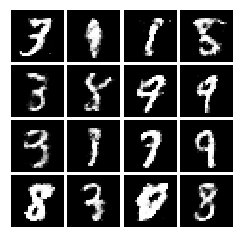

Iter: 83200; D_loss: 0.6781; G_loss: 3.828


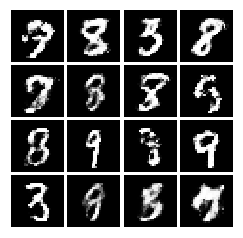

Iter: 83300; D_loss: 0.2774; G_loss: 3.276


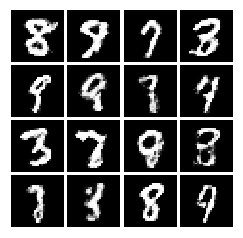

Iter: 83400; D_loss: 0.4659; G_loss: 1.638


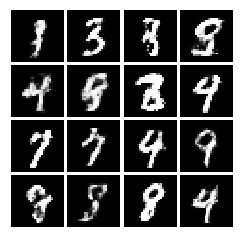

Iter: 83500; D_loss: 0.5938; G_loss: 2.438


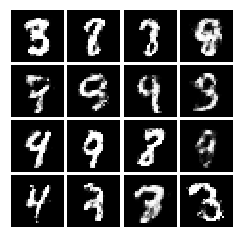

Iter: 83600; D_loss: 0.5546; G_loss: 5.048


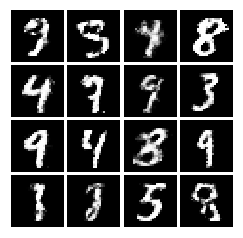

Iter: 83700; D_loss: 0.5989; G_loss: 4.693


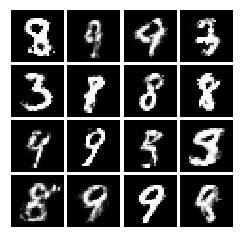

Iter: 83800; D_loss: 0.4393; G_loss: 4.528


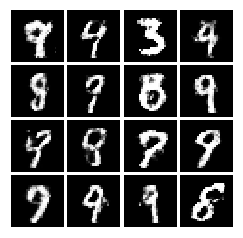

Iter: 83900; D_loss: 0.1601; G_loss: 2.905


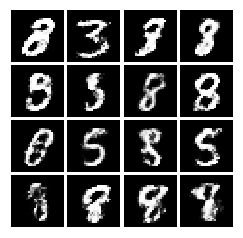

Iter: 84000; D_loss: 0.3489; G_loss: 3.385


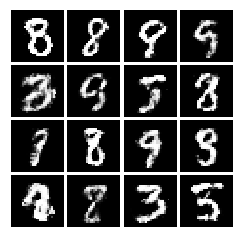

Iter: 84100; D_loss: 0.4439; G_loss: 4.121


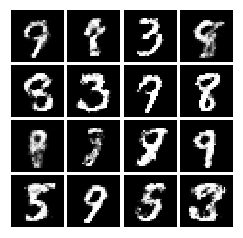

Iter: 84200; D_loss: 0.4142; G_loss: 2.353


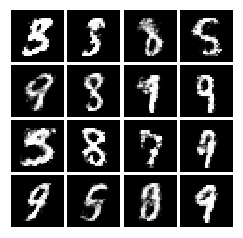

Iter: 84300; D_loss: 0.3321; G_loss: 2.333


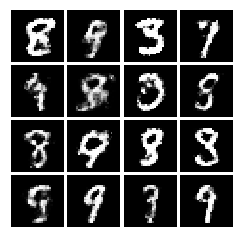

Iter: 84400; D_loss: 0.4382; G_loss: 4.509


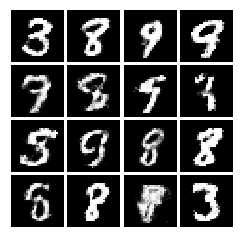

Iter: 84500; D_loss: 0.2931; G_loss: 3.552


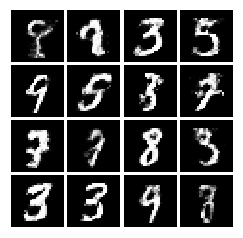

Iter: 84600; D_loss: 0.5012; G_loss: 3.125


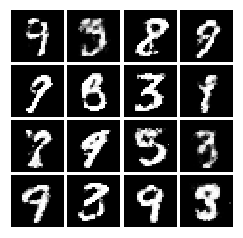

Iter: 84700; D_loss: 0.4868; G_loss: 2.231


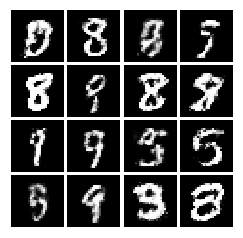

Iter: 84800; D_loss: 0.5022; G_loss: 4.928


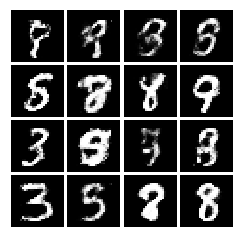

Iter: 84900; D_loss: 0.5087; G_loss: 3.661


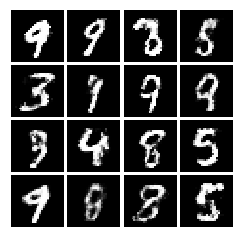

Iter: 85000; D_loss: 0.5174; G_loss: 3.251


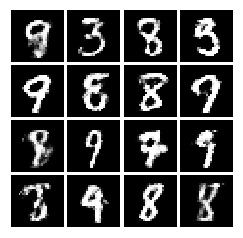

Iter: 85100; D_loss: 0.5473; G_loss: 2.605


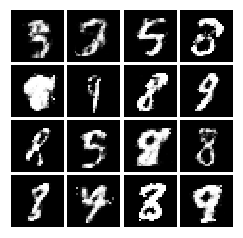

Iter: 85200; D_loss: 0.4721; G_loss: 3.525


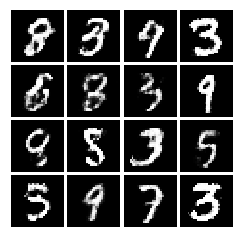

Iter: 85300; D_loss: 0.8808; G_loss: 2.821


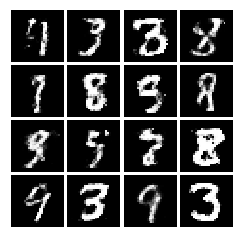

Iter: 85400; D_loss: 0.5199; G_loss: 2.692


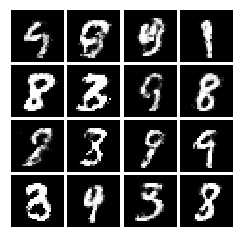

Iter: 85500; D_loss: 0.2842; G_loss: 3.918


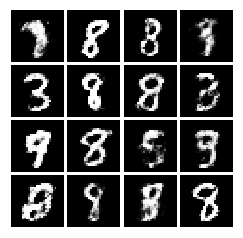

Iter: 85600; D_loss: 0.5143; G_loss: 3.318


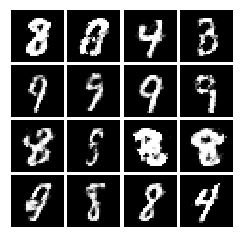

Iter: 85700; D_loss: 0.5535; G_loss: 3.352


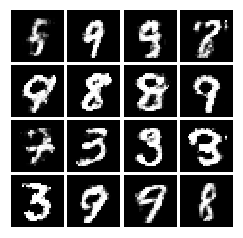

Iter: 85800; D_loss: 0.7094; G_loss: 2.862


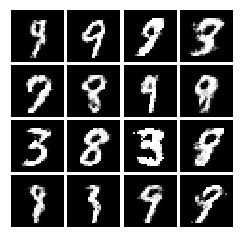

Iter: 85900; D_loss: 0.6791; G_loss: 3.537


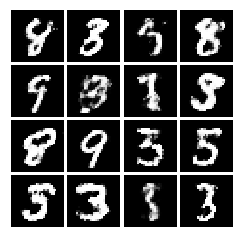

Iter: 86000; D_loss: 0.2232; G_loss: 4.454


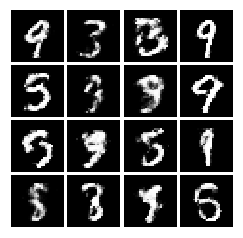

Iter: 86100; D_loss: 0.4097; G_loss: 2.464


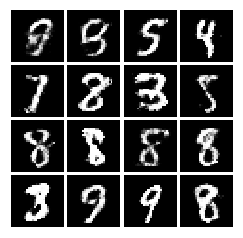

Iter: 86200; D_loss: 0.1835; G_loss: 5.328


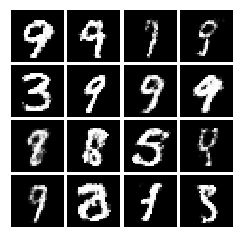

Iter: 86300; D_loss: 0.2984; G_loss: 4.809


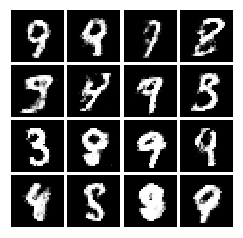

Iter: 86400; D_loss: 0.427; G_loss: 2.897


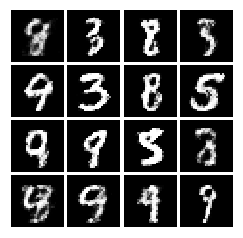

Iter: 86500; D_loss: 0.6147; G_loss: 4.347


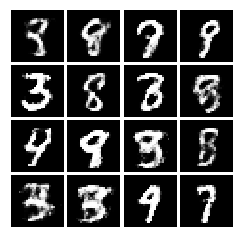

Iter: 86600; D_loss: 0.4286; G_loss: 3.388


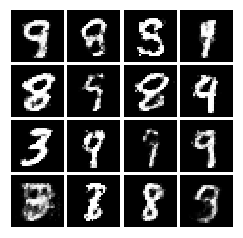

Iter: 86700; D_loss: 0.6217; G_loss: 3.529


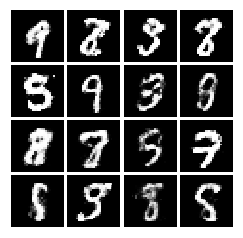

Iter: 86800; D_loss: 0.6549; G_loss: 2.529


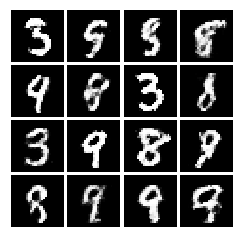

Iter: 86900; D_loss: 0.336; G_loss: 3.752


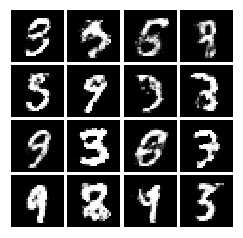

Iter: 87000; D_loss: 0.4969; G_loss: 3.491


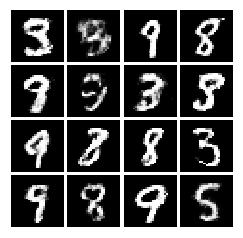

Iter: 87100; D_loss: 0.464; G_loss: 3.539


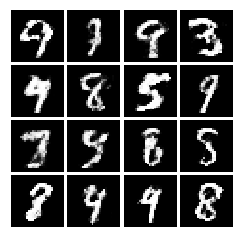

Iter: 87200; D_loss: 0.4021; G_loss: 2.921


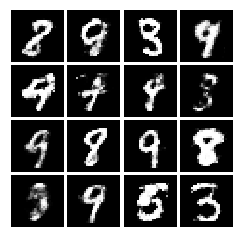

Iter: 87300; D_loss: 0.2704; G_loss: 4.212


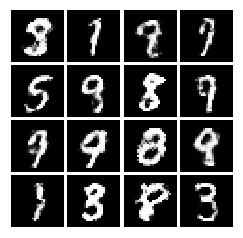

Iter: 87400; D_loss: 0.5348; G_loss: 4.358


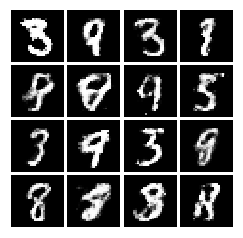

Iter: 87500; D_loss: 0.4089; G_loss: 3.452


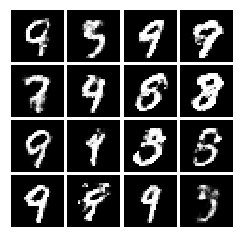

Iter: 87600; D_loss: 0.5607; G_loss: 3.56


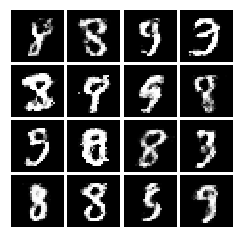

Iter: 87700; D_loss: 0.4799; G_loss: 5.137


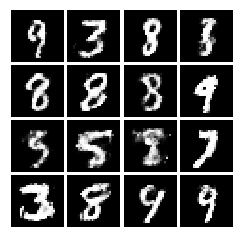

Iter: 87800; D_loss: 0.4071; G_loss: 3.947


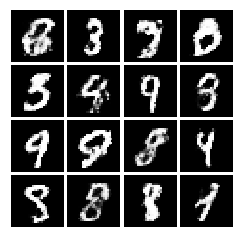

Iter: 87900; D_loss: 0.4022; G_loss: 3.352


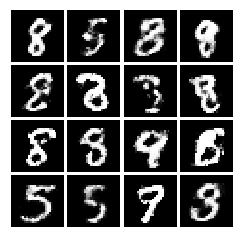

Iter: 88000; D_loss: 0.3357; G_loss: 4.294


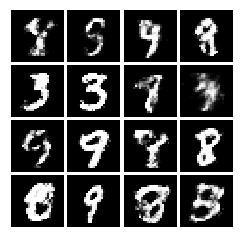

Iter: 88100; D_loss: 0.2448; G_loss: 3.025


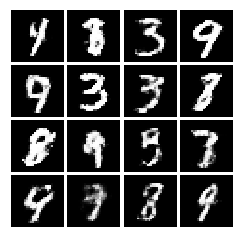

Iter: 88200; D_loss: 0.4151; G_loss: 1.808


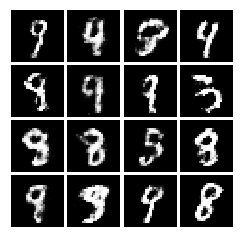

Iter: 88300; D_loss: 0.5718; G_loss: 3.195


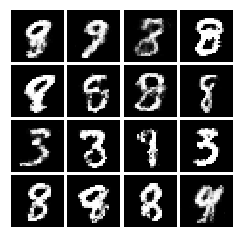

Iter: 88400; D_loss: 0.4522; G_loss: 3.946


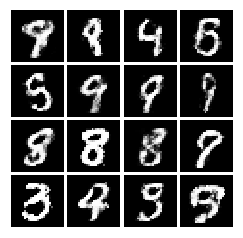

Iter: 88500; D_loss: 0.5665; G_loss: 3.881


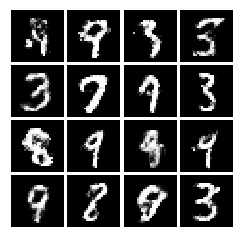

Iter: 88600; D_loss: 0.5177; G_loss: 3.004


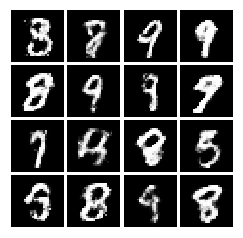

Iter: 88700; D_loss: 0.8436; G_loss: 3.415


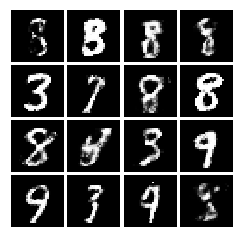

Iter: 88800; D_loss: 0.3011; G_loss: 4.29


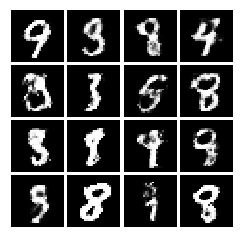

Iter: 88900; D_loss: 0.495; G_loss: 3.567


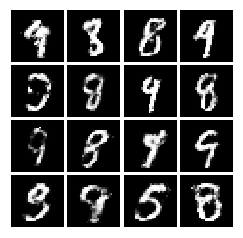

Iter: 89000; D_loss: 0.5561; G_loss: 4.669


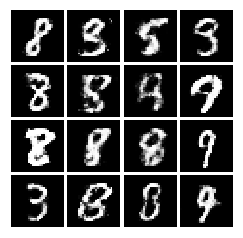

Iter: 89100; D_loss: 0.4154; G_loss: 3.377


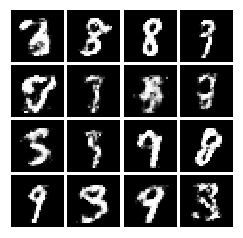

Iter: 89200; D_loss: 0.6991; G_loss: 4.381


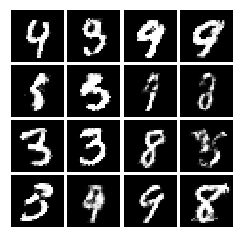

Iter: 89300; D_loss: 0.4005; G_loss: 3.855


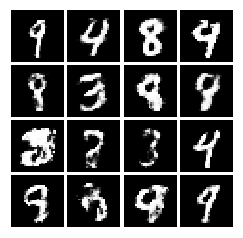

Iter: 89400; D_loss: 0.6871; G_loss: 3.755


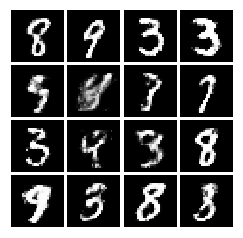

Iter: 89500; D_loss: 0.2727; G_loss: 3.692


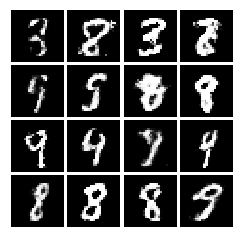

Iter: 89600; D_loss: 0.4412; G_loss: 4.242


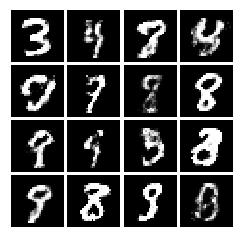

Iter: 89700; D_loss: 0.4663; G_loss: 3.315


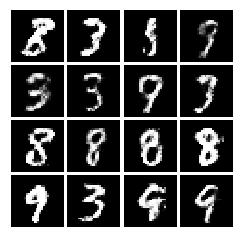

Iter: 89800; D_loss: 0.683; G_loss: 3.866


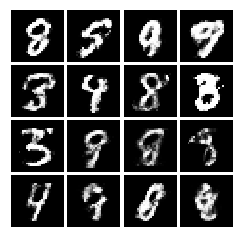

Iter: 89900; D_loss: 0.577; G_loss: 2.111


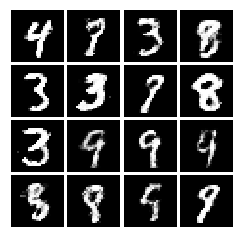

Iter: 90000; D_loss: 0.4954; G_loss: 2.794


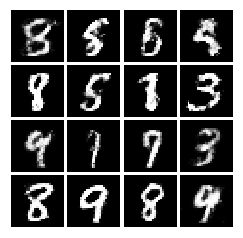

Iter: 90100; D_loss: 0.3593; G_loss: 4.026


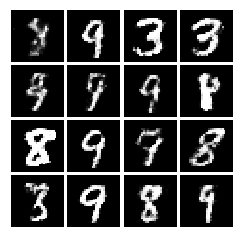

Iter: 90200; D_loss: 0.5005; G_loss: 4.862


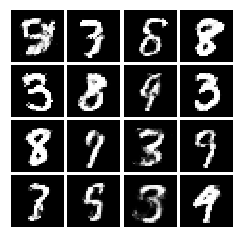

Iter: 90300; D_loss: 0.3456; G_loss: 3.122


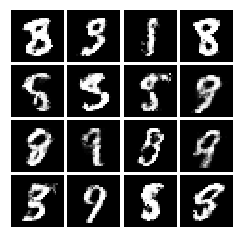

Iter: 90400; D_loss: 0.554; G_loss: 2.825


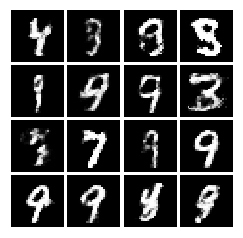

Iter: 90500; D_loss: 0.6629; G_loss: 2.868


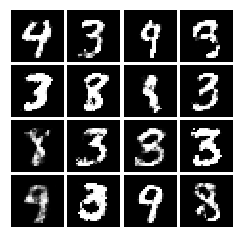

Iter: 90600; D_loss: 0.4773; G_loss: 3.617


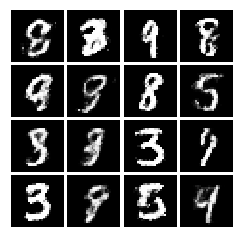

Iter: 90700; D_loss: 0.4563; G_loss: 3.07


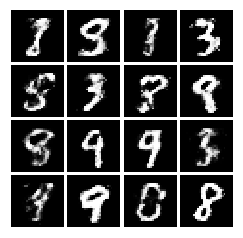

Iter: 90800; D_loss: 0.5116; G_loss: 3.552


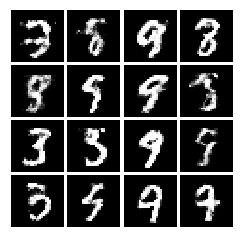

Iter: 90900; D_loss: 0.505; G_loss: 3.769


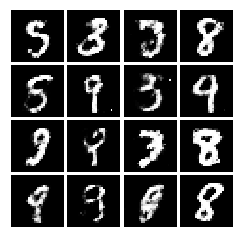

Iter: 91000; D_loss: 0.705; G_loss: 2.557


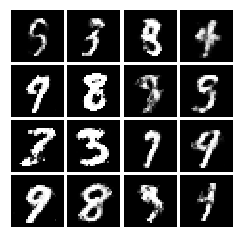

Iter: 91100; D_loss: 0.5088; G_loss: 3.733


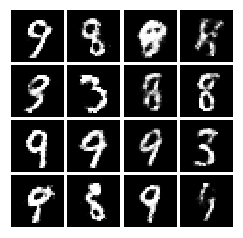

Iter: 91200; D_loss: 0.4589; G_loss: 3.318


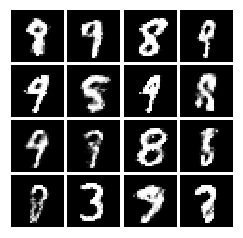

Iter: 91300; D_loss: 0.3167; G_loss: 1.903


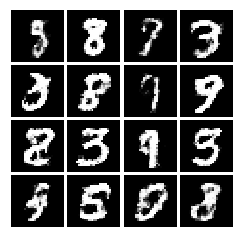

Iter: 91400; D_loss: 0.3428; G_loss: 3.622


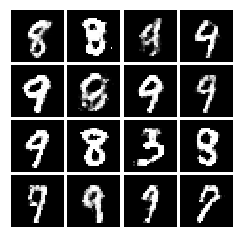

Iter: 91500; D_loss: 0.5345; G_loss: 2.98


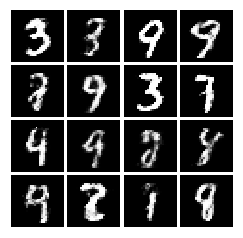

Iter: 91600; D_loss: 0.2718; G_loss: 3.401


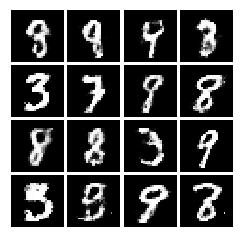

Iter: 91700; D_loss: 0.3869; G_loss: 2.752


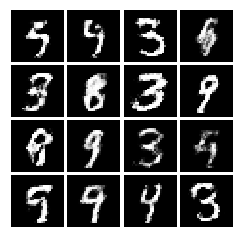

Iter: 91800; D_loss: 0.8686; G_loss: 3.479


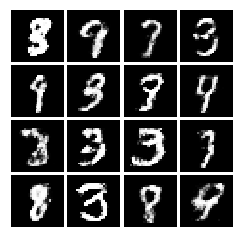

Iter: 91900; D_loss: 0.4512; G_loss: 2.834


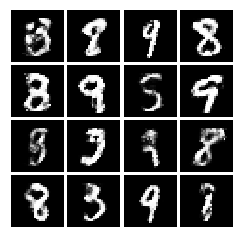

Iter: 92000; D_loss: 0.6407; G_loss: 2.574


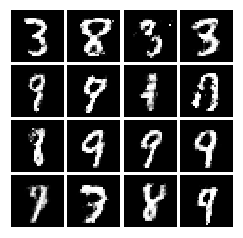

Iter: 92100; D_loss: 0.2909; G_loss: 2.569


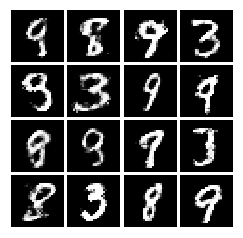

Iter: 92200; D_loss: 0.3697; G_loss: 2.203


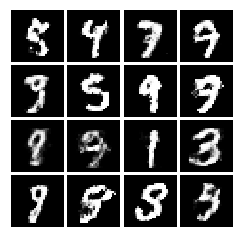

Iter: 92300; D_loss: 0.5462; G_loss: 4.016


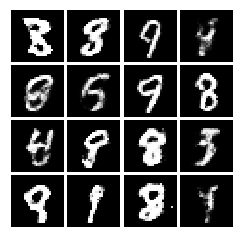

Iter: 92400; D_loss: 0.38; G_loss: 2.729


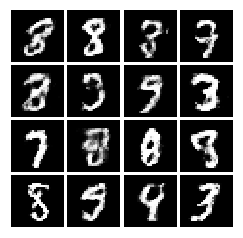

Iter: 92500; D_loss: 0.4955; G_loss: 3.515


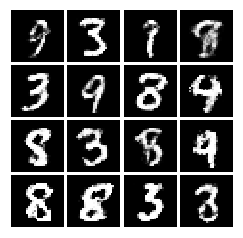

Iter: 92600; D_loss: 0.3718; G_loss: 3.144


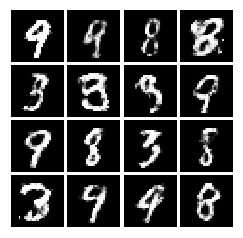

Iter: 92700; D_loss: 0.5618; G_loss: 3.498


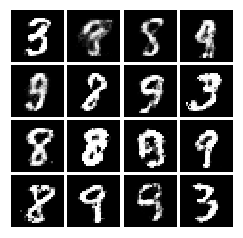

Iter: 92800; D_loss: 0.6566; G_loss: 2.866


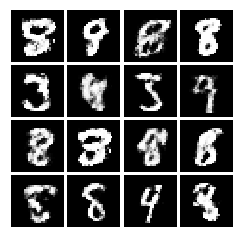

Iter: 92900; D_loss: 0.5168; G_loss: 4.858


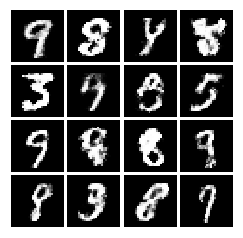

Iter: 93000; D_loss: 0.5237; G_loss: 3.52


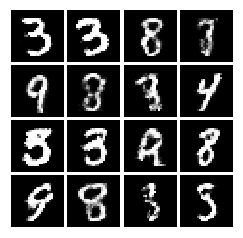

Iter: 93100; D_loss: 0.4452; G_loss: 2.243


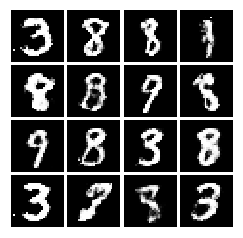

Iter: 93200; D_loss: 0.6443; G_loss: 3.501


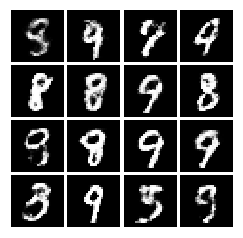

Iter: 93300; D_loss: 0.5044; G_loss: 3.478


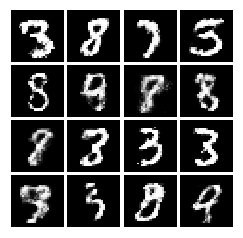

Iter: 93400; D_loss: 0.4067; G_loss: 3.351


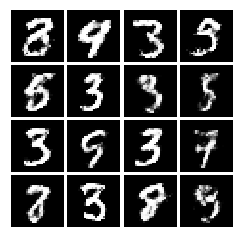

Iter: 93500; D_loss: 0.4672; G_loss: 2.969


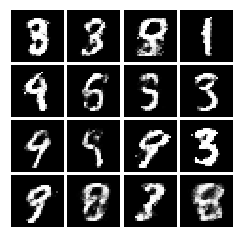

Iter: 93600; D_loss: 0.3371; G_loss: 3.547


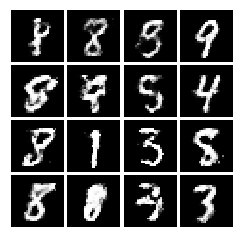

Iter: 93700; D_loss: 0.8123; G_loss: 3.847


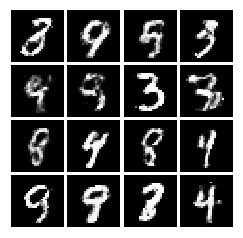

Iter: 93800; D_loss: 0.5325; G_loss: 2.09


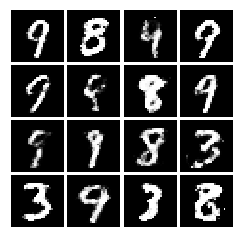

Iter: 93900; D_loss: 0.4138; G_loss: 3.065


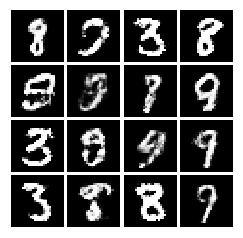

Iter: 94000; D_loss: 0.6743; G_loss: 3.68


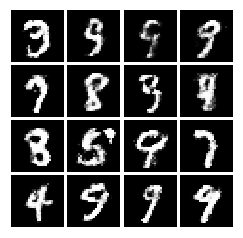

Iter: 94100; D_loss: 0.4148; G_loss: 3.736


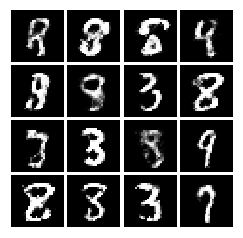

Iter: 94200; D_loss: 0.4615; G_loss: 3.777


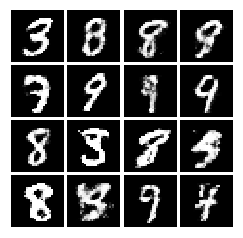

Iter: 94300; D_loss: 0.6193; G_loss: 3.059


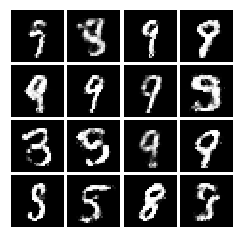

Iter: 94400; D_loss: 0.4917; G_loss: 3.157


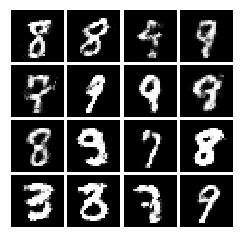

Iter: 94500; D_loss: 0.5839; G_loss: 3.583


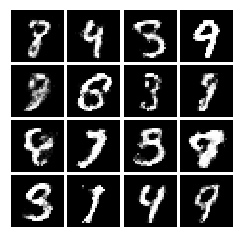

Iter: 94600; D_loss: 0.3365; G_loss: 4.717


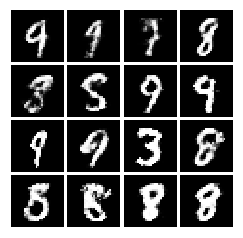

Iter: 94700; D_loss: 0.413; G_loss: 3.847


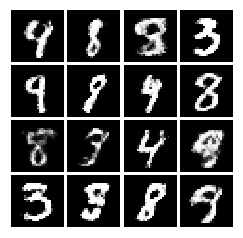

Iter: 94800; D_loss: 0.2131; G_loss: 5.112


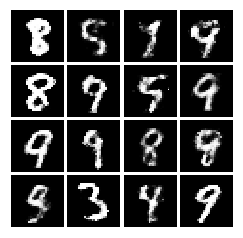

Iter: 94900; D_loss: 0.4702; G_loss: 2.035


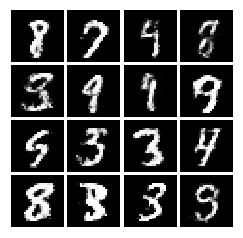

Iter: 95000; D_loss: 0.4696; G_loss: 2.981


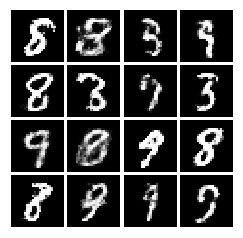

Iter: 95100; D_loss: 0.3272; G_loss: 2.387


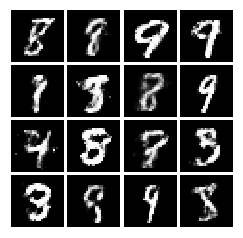

Iter: 95200; D_loss: 0.3329; G_loss: 4.347


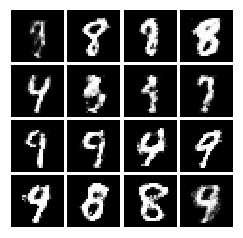

Iter: 95300; D_loss: 0.6158; G_loss: 3.533


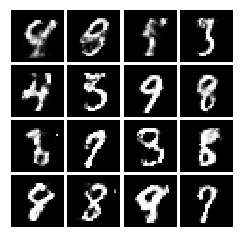

Iter: 95400; D_loss: 0.5925; G_loss: 4.393


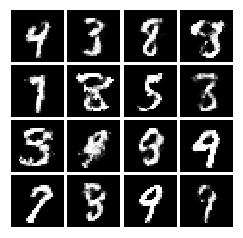

Iter: 95500; D_loss: 0.3441; G_loss: 2.949


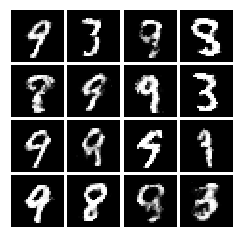

Iter: 95600; D_loss: 0.5246; G_loss: 3.913


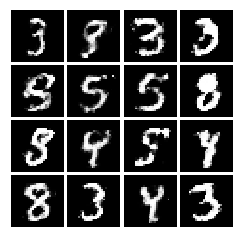

Iter: 95700; D_loss: 0.4287; G_loss: 3.682


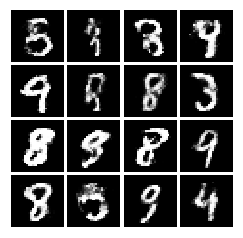

Iter: 95800; D_loss: 0.3584; G_loss: 2.768


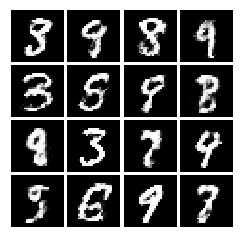

Iter: 95900; D_loss: 0.6809; G_loss: 5.979


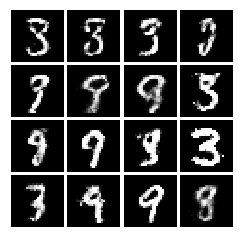

Iter: 96000; D_loss: 0.2501; G_loss: 6.619


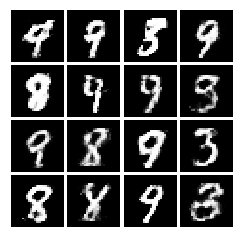

Iter: 96100; D_loss: 0.494; G_loss: 3.782


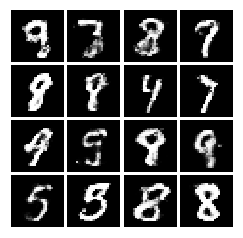

Iter: 96200; D_loss: 0.6225; G_loss: 3.425


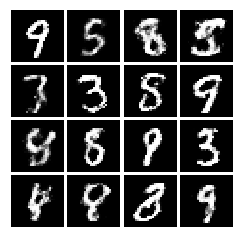

Iter: 96300; D_loss: 0.7539; G_loss: 2.633


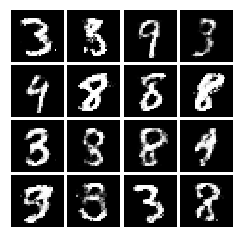

Iter: 96400; D_loss: 0.3207; G_loss: 2.846


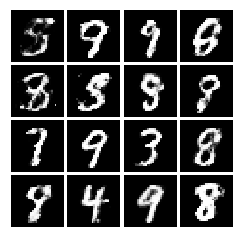

Iter: 96500; D_loss: 0.226; G_loss: 3.676


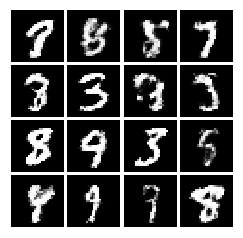

Iter: 96600; D_loss: 0.3006; G_loss: 3.661


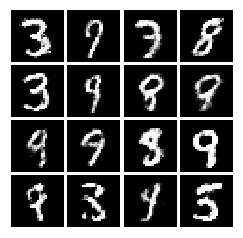

Iter: 96700; D_loss: 0.5716; G_loss: 3.147


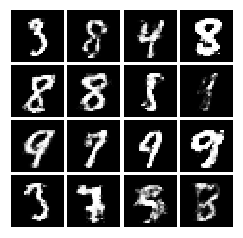

Iter: 96800; D_loss: 0.3807; G_loss: 3.17


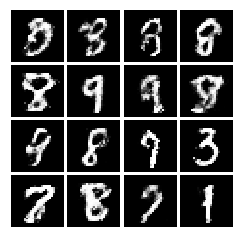

Iter: 96900; D_loss: 0.2973; G_loss: 4.326


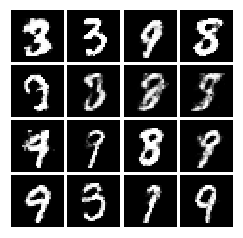

Iter: 97000; D_loss: 0.3924; G_loss: 4.019


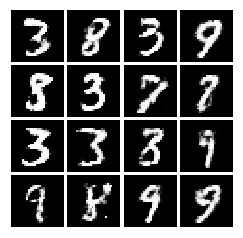

Iter: 97100; D_loss: 0.3673; G_loss: 2.936


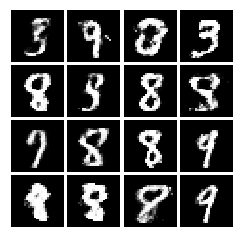

Iter: 97200; D_loss: 0.4956; G_loss: 4.226


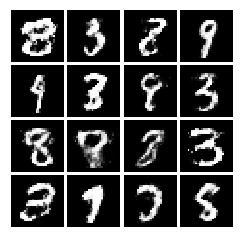

Iter: 97300; D_loss: 0.4766; G_loss: 6.117


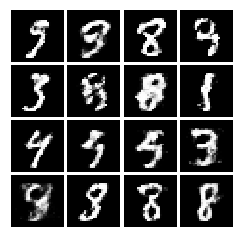

Iter: 97400; D_loss: 0.418; G_loss: 4.166


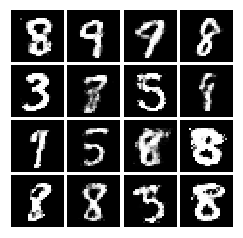

Iter: 97500; D_loss: 0.4312; G_loss: 3.291


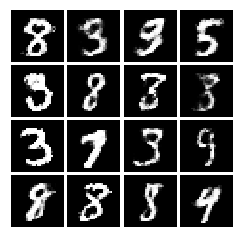

Iter: 97600; D_loss: 0.3342; G_loss: 2.31


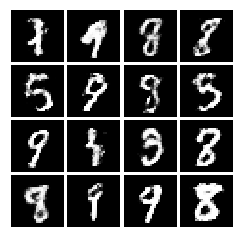

Iter: 97700; D_loss: 0.526; G_loss: 4.299


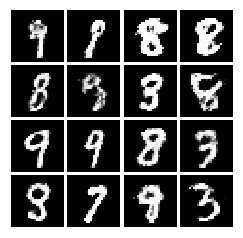

Iter: 97800; D_loss: 0.3203; G_loss: 3.499


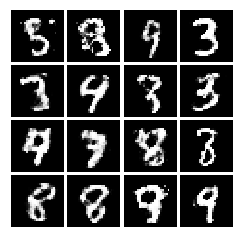

Iter: 97900; D_loss: 0.3752; G_loss: 4.023


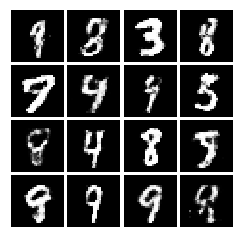

Iter: 98000; D_loss: 0.4361; G_loss: 5.142


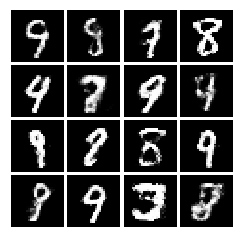

Iter: 98100; D_loss: 0.403; G_loss: 4.142


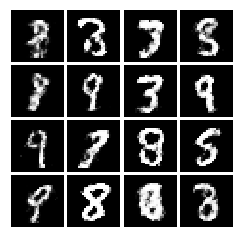

Iter: 98200; D_loss: 0.351; G_loss: 2.651


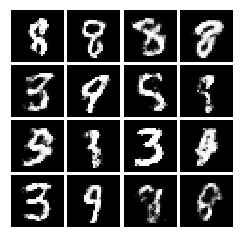

Iter: 98300; D_loss: 0.5335; G_loss: 4.346


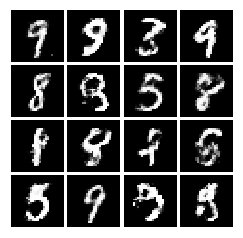

Iter: 98400; D_loss: 0.4611; G_loss: 2.937


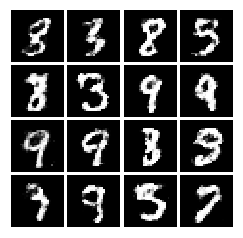

Iter: 98500; D_loss: 0.414; G_loss: 3.03


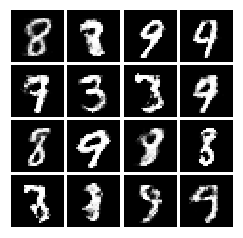

Iter: 98600; D_loss: 0.3026; G_loss: 2.761


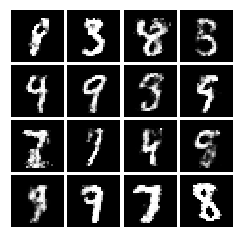

Iter: 98700; D_loss: 0.3755; G_loss: 3.466


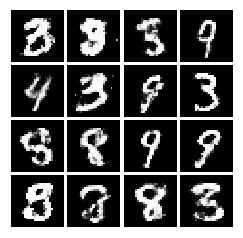

Iter: 98800; D_loss: 0.3632; G_loss: 3.649


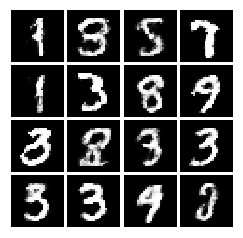

Iter: 98900; D_loss: 0.174; G_loss: 3.602


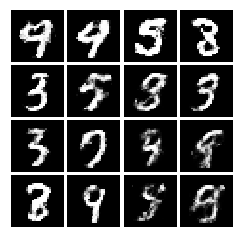

Iter: 99000; D_loss: 0.3966; G_loss: 2.684


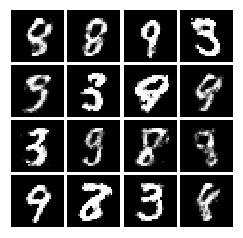

Iter: 99100; D_loss: 0.3785; G_loss: 4.29


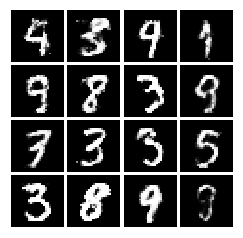

Iter: 99200; D_loss: 0.6443; G_loss: 3.922


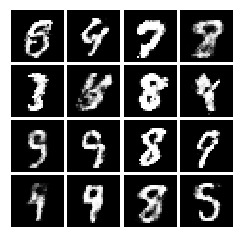

Iter: 99300; D_loss: 0.5681; G_loss: 3.032


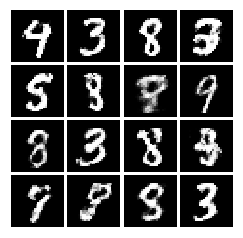

Iter: 99400; D_loss: 0.4241; G_loss: 4.633


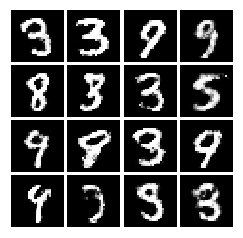

Iter: 99500; D_loss: 0.434; G_loss: 3.735


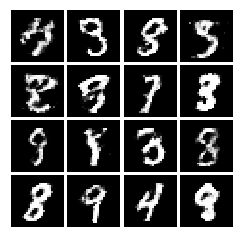

Iter: 99600; D_loss: 0.7072; G_loss: 3.876


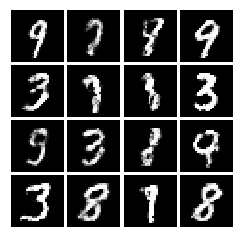

Iter: 99700; D_loss: 0.1802; G_loss: 3.579


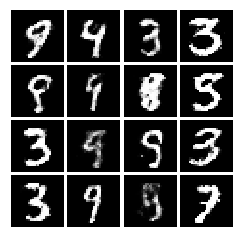

Iter: 99800; D_loss: 0.4036; G_loss: 3.74


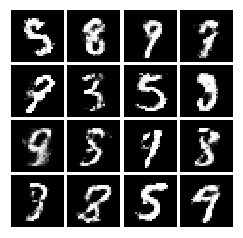

Iter: 99900; D_loss: 0.4416; G_loss: 3.482


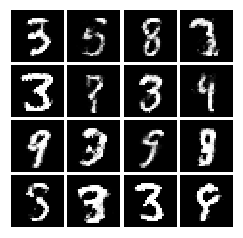

In [10]:
i = 0

for it in range(100000):
    X_mb, _ = mnist.train.next_batch(mb_size)
    z_mb = sample_z(mb_size, z_dim)

    _, D_loss_curr = sess.run(
        [D_solver, D_loss],
        feed_dict={X: X_mb, z: z_mb}
    )

    _, G_loss_curr = sess.run(
        [G_solver, G_loss],
        feed_dict={X: X_mb, z: sample_z(mb_size, z_dim)}
    )

    if it % 100 == 0:
        print('Iter: {}; D_loss: {:.4}; G_loss: {:.4}'
              .format(it, D_loss_curr, G_loss_curr))

        samples = sess.run(G_sample, feed_dict={z: sample_z(16, z_dim)})

        fig = plot(samples)
        #plt.savefig('out/{}.png'
        #           .format(str(i).zfill(3)), bbox_inches='tight')
        plt.show()
        i += 1
        plt.close(fig)



## Denoising GANs
* What happens if we substitute latent space for a copy of a noisy image
* Keep the ground truth image to be unmodified
* and, add in a discriminator to detect if an image is denoised or the ground truth.
* And don't forget the autoencoder for great fun.

<img src="https://i.imgur.com/gmhtbjX.jpg"/>


Taken from: https://www.cc.gatech.edu/~hays/7476/projects/Avery_Wenchen/

## First Step, replace the generator with an autoencoder.
<img src="https://www.cc.gatech.edu/~hays/7476/projects/Avery_Wenchen/images/architecture_overview.png"/ style="width: 700px;"/>>

## Next, Create a Deep Convolutional Network to serve as the Discriminator

<img src="https://www.cc.gatech.edu/~hays/7476/projects/Avery_Wenchen/images/architecture_discriminator.png"/>

## Results (still from https://www.cc.gatech.edu/~hays/7476/projects/Avery_Wenchen/ )

<img src="https://www.cc.gatech.edu/~hays/7476/projects/Avery_Wenchen/images/one.png"/>

<img src="http://i0.kym-cdn.com/entries/icons/facebook/000/018/512/emhance.jpg"/>

It makes it look good, but it is worth noting the GAN is basically just making data up that looks good, so your dreams of zooming in on a bolt to recover a license plate number won't be realized.

## Next up, Anomaly Detection

<img src="https://i.imgur.com/0TYRLmY.jpg"/>

In [19]:
import sys
!{sys.executable} -m pip install keras

    100% |################################| 348kB 2.2MB/s ta 0:00:01
    100% |################################| 256kB 2.8MB/s ta 0:00:01
  Running setup.py bdist_wheel for pyyaml ... done
  Stored in directory: /root/.cache/pip/wheels/03/05/65/bdc14f2c6e09e82ae3e0f13d021e1b6b2481437ea2f207df3f
Successfully built pyyaml
You are using pip version 8.1.1, however version 10.0.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [20]:
import tensorflow as tf
from keras import backend as K
from keras.layers import Dense, Dropout
from keras.layers import Activation

import numpy as np


Using TensorFlow backend.


In [21]:
class UniformPrior(object):
    def __init__(self, x, y):
        self.x, self.y = x, y

    def sample(self, N):
        return np.linspace(self.x, self.y, N) + np.random.random(N) * 0.01


In [22]:
def linear(input, output_dim, scope=None, stddev=1.0):
    with tf.variable_scope(scope or 'linear'):

        w = tf.get_variable(
            'w',
            [input.get_shape()[1], output_dim],
            initializer=tf.contrib.layers.xavier_initializer()
        )
        b = tf.get_variable(
            'b',
            [output_dim],
            initializer=tf.constant_initializer(0.0)
        )
        return tf.matmul(input, w) + b


In [24]:
def optimizer(loss, var_list):
    learning_rate = 0.00005
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(
        loss,
        #step,
        var_list=var_list
    )
    return optimizer


In [25]:
class GAN(object):
    def __generator(self, input):
        h0 = tf.nn.relu(linear(input, 4096, 'g0'))
        h3 = linear(h0, self.num_features, 'g3')
        return h3

    def __discriminator(self, input):
        h0 = tf.nn.relu(linear(input, 4096, 'd0'))
        h3 = linear(h0, 1, scope='d3')
        return h3, tf.nn.sigmoid(h3)


    def __init__(self, num_features):
        self.num_features = num_features
        with tf.variable_scope('G'):
            self.__z = tf.placeholder(tf.float32, shape=(None, num_features))
            self.__G = self.__generator(self.__z)

        self.__x = tf.placeholder(tf.float32, shape=(None, num_features))
        with tf.variable_scope('D'):
            self.__D1, self.__d1l = self.__discriminator(self.__x)

        with tf.variable_scope('D', reuse=True):
            self.__D2, _ = self.__discriminator(self.__G)

        self.__loss_d = tf.reduce_mean(self.__D1) - tf.reduce_mean(self.__D2)
        self.__loss_g = -tf.reduce_mean(self.__D2)

        vars = tf.trainable_variables()
        d_params = [v for v in vars if v.name.startswith('D/')]
        g_params = [v for v in vars if v.name.startswith('G/')]

        self.__clip_D = [p.assign(tf.clip_by_value(p, -0.01, 0.01)) for p in d_params]
        self.__opt_d = optimizer(-self.__loss_d, d_params)
        self.__opt_g = optimizer(self.__loss_g, g_params)
        self.sess = tf.Session()
        tf.local_variables_initializer().run(session=self.sess)
        tf.global_variables_initializer().run(session=self.sess)
        
    def train(self, samples):
        # Train calls both the discriminator and the generator
        gen = UniformPrior(-5, 5)
        bs = len(samples)
        num_features = len(samples[0])
        x = samples
        #print np.array(samples).shape
        z = gen.sample(len(samples)*self.num_features)
        z = np.reshape(z, (bs, self.num_features))
        #print(z.shape)
        res1, _, _ = self.sess.run([self.__loss_d, self.__opt_d, self.__clip_D], { self.__x: x,
                                                                                 self.__z: z
                                                                                 })

        z = gen.sample(len(samples)*self.num_features)
        z = np.reshape(z, (bs, self.num_features))
        res, _ = self.sess.run([self.__loss_g, self.__opt_g], {self.__z: z})
        print("Discriminator Loss: {}, Generator Loss: {}".format(res1, res))

    def predict(self, sample):
        # Fit only calls the discriminator
        _, d = self.sess.run([self.__D1, self.__d1l], {self.__x: sample})
        print(d)           
    


## Anomaly Detection
* Look at the discriminator, and run outlier analysis on the losses and this will *probably* work depending on your data
* The caution here is GANs aren't really learning to detect weird things, but rather they are learning to detect fake examples from the generator
* I'm not sure if this works better than Autoencoders for the same task
* I basically wanted to show you that you can separate the Discriminator and the Generator (these things are good for more than just generating things, they are also good for discriminating them.
* I also wanted to show you a slightly more readable example.

## Other applications that I didn't have time to demonstrate
* Unsupervised Clustering (infogan)
* Imitation Learning (Finn et al, A connection between generative adversarial networks, Inverse Reinforcement Learning, and Energy-based models, 2016)
* Domain Adaption (DiscoGAN)
* Text Generation (SeqGAN)


## Mode collapse
<img src="http://aiden.nibali.org/img/bimodal_temperatures.svg"/>


## Generator or Discriminator Strength Bias

A Gan is looking for a nash equilibrium, and getting to one can be difficult if the Generator is too smart, or the Discriminator is too smart, you need them to learn together.

## One final example of things that can be accomplished with a GAN.

This is basically denoising, with a very special prior and ground truth.

<a href="https://www.youtube.com/watch?v=Fea4kZq0oFQ&t=52s">Cycle GAN face swapping video</a>